# Proxy Record selection and Calibration

* This preprocessing notebooks documents how the proxy record selection was extracted from the different climate proxy record databases (one .nc file for each proxy record type, such that it is easier to exclude specific archive types), using mainly pandas and xarray (the final files are created via xarray)
* It also includes the linear regression of the the tree rings and corals to observed climate variables. The linear regression coefficients are stored as metadata in the nc files.
* **It is not necessary to run this notebook to run the PaleoDA reconstruction. All files for that are part of the Input Data Zenodo repository**. The notebook primarily serves documentary purposes.

**Selection criteria** (from the manuscript):

We define four selection criteria for choosing proxy records from the respective databases:   
* The sites where the climate archives where obtained are located in the region 65$^\circ$S-35$^\circ$N, 20$^\circ$W-110$^\circ$W. Proxy records from Central America are explicitly included as they can provide information for the northern part of South America, where few proxy records for the past two millennia exist.
* The proxy variable is approximately linearly related to one of the climate variables provided by the climate model simulations (see Section~\ref{sec:model} and ~\ref{sec:PSM}). We follow the recommendations given by the authors in the original publications to decide if such a relationship holds. Note, that speleothem and icecore \dO values can also be included in our proxy record collection because the climate model data also includes simulated isotopic-composition of rainfall.
* The proxy records span at least 200 years and have at least one sample value in the period from 1750 to 1850 CE. This period is used as the reference period for computing anomalies of the proxy records relative to a shared time period. It has the advantage of including crucial records as speleothems, that lack data points during the more commonly chosen reference period of the 20th century. At the same time, this excludes many shorter records which would lead to high reconstruction skill during the instrumental era, but would not contribute to the reconstruction of centennial scale hydroclimate changes, and are, thus, acceptable to omit.
* The resolution of the proxy records is is better than 10 years (median), as we set 10 years as the largest reconstruction time scale in the multi-time scale PaleoData Assimilation approach). While decadal to multi-decadal and lower resolution is technically possible, the proxy records falling into that category are too coarsely resolved to contribute to the skill of the reconstruction of the past two millennia on multi decadal and centennial time scales, which is the focus of this study.

Our selection of proxy records for the South American reconstruction consists of 295 records covering southern and central America (Figure~\ref{fig:spat_temp_records_availability} a). Due to our selection criteria, the maximum number of proxy records is available in the reference period 1750 - 1850 CE  and the least in the first century (13 records)

**Linear calibration**
For proxy records that can be calibrated to instrumental data, such as corals and tree rings, we employ a linear regression-based PSM. Linear regression equations are estimated between the proxy time series and instrumental time series over a calibration period. The regression parameters are then applied to the model data in the data assimilation. Different predictor variables, such as surface temperature, precipitation, or the SPEI drought index, are used based on the lowest p-value for each proxy record. For coral records, we only use surface temperature as a predictor variable.

Important to take into account:
- demean all proxy records with respect to the same anomaly period (here 1750-1850 mean)
- demean all calibration data with respect to the same time window (1950-2000 CE) (Despite using different time windows)
- standardize std with respect to reference period (for an easier comparison of kalman gains just in case this is done)
- It is not important that the models do not span the calibration time period, because I always enforce the prior in (HX - Y) to have mean zero and in the covariances the mean is not important.


# Proxy-record databases (except speleothems -> speleothem_composites.ipynb)

- **Pages2k** (Emile-Geay 2017)
- **Iso2k** (Konecky 2020). Probably mostly irrelevant, because almost all interesting records are part of Pages2k (See comment on lake sediments about that)
- **Sisalv3**: See 'speleothem_composites.ipynb'
- **Breitenmoser 2014** tree rings (part of the NOAA database). Not scanned for temperature/precipitation calibration, but used prominently and PHYDA and LMRv2
- **CoralHydro2k** (Not checked yet, probably all new records are too short anyway)
- **Temp12k (Kaufmann 2021, used in Erb 2022 et al.)**: Eventually. These are very coarsely resolved records.

# Feel free to explore the proxy record databases, plotting the time series ...


In [15]:
import sys
sys.path.append('/home/mchoblet/paleoda')

import numpy as np
import xarray as xr
import scipy as sc
import pickle
import lipd
import urllib

import cftime
import matplotlib.pyplot as plt
import pandas as pd

import seaborn as sns

import cartopy.crs as ccrs
import cartopy.feature as cfeature  

import os
import matplotlib as mpl
from adjustText import adjust_text
from scipy import stats
import xskillscore

pd.set_option('display.max_rows', 700,'display.max_columns', None)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
pd.set_option('display.max_rows', 700,'display.max_columns', None)


%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
%%javascript

Jupyter.keyboard_manager.command_shortcuts.remove_shortcut('up');
Jupyter.keyboard_manager.command_shortcuts.remove_shortcut('down');

<IPython.core.display.Javascript object>

# Helper Functions (Extracting/moving data)

In [157]:
def lipd2df(lipd_dirpath, pkl_filepath, col_str=[
            'paleoData_pages2kID',
            'pub1_doi',
            'archiveType',                                                                                
            'geo_meanElev', 'geo_meanLat', 'geo_meanLon',
            'geo_siteName',
            'year', 'yearUnits',     
            'minYear',
            'maxYear',
            'paleoData_hasResolution_hasMedianValue',
            'paleoData_variableName',
            'paleoData_units',                                                                                           
            'paleoData_values',
            'paleoData_proxy',
            'paleoData_interpretation',
            'paleoData_useInGlobalTemperatureAnalysis',
            'paleoData_climateInterpretation_seasonality',
            'paleoData_climateInterpretation_variable',
            'paleoData_climateInterpretation_variableDetail',
            'paleoData_inCompilation',
            'dataSetName', 
    ],
           crit='paleoData_iso2kPrimaryTimeseries' #'paleoData_useInGlobalTemperatureAnalysis'
           ):
        ''' 
        Adapted from https://github.com/LinkedEarth/notebooks/blob/master/PAGES2k/01.lipd2df.ipynb (adapted)
        Convert a bunch of PAGES2k LiPD files to a pickle file of Pandas DataFrame to boost data loading                                                                 
        Args:                                          
            lipd_dirpath (str): the path of the PAGES2k LiPD files
            pkl_filepath (str): the path of the converted pickle file
            col_str (list of str): the name string of the variables to extract from the LiPD files

        Returns:                                                         
            df (Pandas DataFrame): the converted Pandas DataFrame
        '''
    
        # save the current working directory for later use, as the LiPD utility will change it in the background
        work_dir = os.getcwd()

        # LiPD utility requries the absolute path, so let's get it
        lipd_dirpath = os.path.abspath(lipd_dirpath)

        # load LiPD files from the given directory
        lipds = lipd.readLipd(lipd_dirpath)

        # extract timeseries from the list of LiDP objects
        ts_list = lipd.extractTs(lipds)

        # recover the working directory
        os.chdir(work_dir)

        # create an empty pandas dataframe with the number of rows to be the number of the timeseries (PAGES2k records),
        # and the columns to be the variables we'd like to extract 
        df_tmp = pd.DataFrame(index=range(len(ts_list)), columns=col_str)

        # loop over the timeseries and pick those for global temperature analysis
        i = 0                                                                                                                
        for ts in ts_list:
            #import pdb
            #pdb.set_trace()
            if crit in ts.keys() and \
                ts[crit] == 'TRUE':
                for name in col_str:                                                                                         
                    try:
                        df_tmp.loc[i, name] = ts[name]                                                                       
                    except:
                        df_tmp.loc[i, name] = np.nan                                                                         
                i += 1 
        # drop the rows with all NaNs (those not for global temperature analysis)
        df = df_tmp.dropna(how='all')

        # save the dataframe to a pickle file for later use
        save_path = os.path.abspath(pkl_filepath)
        print(f'Saving pickle file at: {save_path}')
        df.to_pickle(save_path)

        return df

def mean(xarray,avg):
    """
    TAKE ANNUAL/SEASONAL MEAN
    """
    fm=xarray.time.dt.month[0]
    years=np.unique(xarray.time.dt.year.values)
    try:
        sm=avg[0]
    except:
        sm=avg

    #first month in Array smaller than start month: slice from avg-month in first year
    if fm<=sm:
        xarray=xarray.isel(time=slice(int(sm-fm),None))
        #print('slice in first year')
    #slice in second year
    else:
        xarray=xarray.isel(time=slice(int(12-fm+sm),None))
        #print('slice in second year')
    #"""
    lm=xarray.time.dt.month[-1].values

    if isinstance(avg,np.ndarray) | isinstance(avg,list):
        #month to end with
        em=avg[-1]
        #slice in last year
        if lm>em:
            #if last month in prior larger than end month in avg slice from the end
            xarray=xarray.isel(time=slice(None,int(em-lm)))
        elif lm<em:
            #else go one year further back
            xarray=xarray.isel(time=slice(None,int(em-lm-12)))

        #xarray=xarray.resample(time='1MS').mean()
        #xarray=xarray.where(xarray.time.dt.month.isin(avg), drop=True)
        if len(xarray.dims)>1:
            xarray=xarray[xarray.time.dt.month.isin(avg),:,:] #(where extremely slow)
        else:
            xarray=xarray[xarray.time.dt.month.isin(avg)]
        calib_data1=xarray.coarsen(time=len(avg),boundary='trim').sum('time')    

    elif isinstance(avg,int): 
        #slice in last year
        if lm>=avg:
            xarray=xarray.isel(time=slice(None,int(avg-lm-1)))
        else:
            xarray=xarray.isel(time=slice(None,int(avg-lm-12-1)))
    
    calib_data1=xarray.resample(time="12MS",closed='left',label='left').mean()
    return calib_data1

def dataframe_cftime(data,time_idx='year',vals_idx='paleoData_values'):
    from datetime import timedelta, datetime
    """
    For a dataframe convert the values in the years into datetime
    """
    data=data.copy(deep=True)
    frac_year=data[time_idx].values
    vals=data[vals_idx].values
    #loop over each record
    for i,time in enumerate(frac_year):
        #convert to numpy arrays and elimnate NANs
        time=np.array(time,dtype=float)
        val=np.array(vals[i],dtype=float)

        mask1=~np.isnan(time)
        time=time[mask1]
        val=val[mask1]
        mask2=~np.isnan(val)
        try:
            time=time[mask2]
        except:
            continue
        val=val[mask2]

        #convert fractional year to datetime
        year=time.astype(int)
        days=(time - year)*365
        d = np.array([timedelta(t) for t in days])
        day_one = np.array([cftime.DatetimeProlepticGregorian(y,1,1) for y in year])
        date = d + day_one
        #getting the datetime correctly is a bit annoying, but it works
        date= np.array([cftime.DatetimeProlepticGregorian(year[i],date[i].month,1) for i,j in enumerate(year)])
        date=xr.CFTimeIndex(date)

        #convert to datetime64
        #date=np.array(date,dtype='datetime64')

        #order values
        idx=np.argsort(date)
        date=date[idx]
        val=val[idx]

        #replace in initial array
        frac_year[i]=date
        vals[i]=val
    
    #replace initial columns
    data['year']=frac_year
    data['paleoData_values']=vals
    return data

def fracyears(time,data):
    from datetime import timedelta, datetime
    """
    Converts fractional years (e.g 1950.2) to cftime index
    """
    #loop over each record
    #for i,time in enumerate(frac_year):
        #convert to numpy arrays and elimnate NANs
    time=np.array(time,dtype=float)
    data=np.array(data,dtype=float)

    mask1=~np.isnan(time)
    time=time[mask1]
    data=data[mask1]
    mask2=~np.isnan(data)
    time=time[mask2]
    data=data[mask2]

    #convert fractional year to datetime
    year=time.astype(int)
    
    #exclude times smaller 0
    
    
    days=(time - year)*365
    d = np.array([timedelta(t) for t in days])
    #import pdb
    #pdb.set_trace()
    day_one = np.array([cftime.DatetimeProlepticGregorian(j,1,1) for i,j in enumerate(year)])
    date = d + day_one
    #getting the datetime correctly is a bit annoying, but it works
    date= np.array([cftime.DatetimeProlepticGregorian(year[i],date[i].month,1) for i,j in enumerate(year)])
    date=xr.CFTimeIndex(date)

    #convert to datetime64
    #date=np.array(date,dtype='datetime64')
    #order values
    idx=np.argsort(date)
    time=date[idx]
    data=data[idx]

    return time,data

def table_to_xarray(data,start=1,end=2000):
    """
    start and end included
    """
    #paleoData_values
    num_prox=data.shape[0]
    num_time=end-start+1
    empty=np.full((num_time,num_prox),np.nan)
    
    for ii,(i,d) in enumerate(data.iterrows()):
        time=d['year']
        vals=d['paleoData_values']
        #eventually replace time
        #if (type(time)!=xr.coding.cftimeindex.CFTimeIndex) & (type(time[0])!=cftime._cftime.DatetimeGregorian):
            #time,vals=fracyears(time,vals)
        try:
            time,vals=fracyears(time,vals)
        except:
            array=xr.DataArray(vals,coords={'time':time})
        #resample to annual
        
        #BUG/PROBLEM. TIMES <0 CAN NOT BE RESAMPLED. THUS LIMIT THE DATE TO 1
        #import pdb
        #pdb.set_trace()
        
        array=array.sel(time=slice('0001',None))
        
        
        array=array.resample(time='YS').mean()
        
        #throw out indices that are too small or too large (according to start + end)
        years=(array.time.dt.year.values-start)
        array=array[(years>=0) & (years<=(end-start))]
        indices=array.time.dt.year-start
        
        #find right indices to fill
        empty[indices,ii]=array.values
        #import pdb
        #pdb.set_trace()
        
    time=xr.cftime_range(start=cftime.datetime(start,1,1,calendar='gregorian'),end=cftime.datetime(end,1,1,calendar='gregorian'),freq='YS',inclusive='both')
    xarray=xr.DataArray(empty,coords={'time':time},dims=('time','site'))
    

    meta_list=[
#'ID', 
        'paleoData_variableName', 'archiveType', 
       'geo_meanLat', 'geo_meanLon', 'geo_siteName',
        'minYear', 'maxYear', 
       'PSM', 'seasonality', 'variable', 'noise_snr', 'regression_params_a',
       'regression_params_b', 'regression_params_var',
        'variable_name',
          'pub1_doi', 
        ]
    cols=data.columns.intersection(meta_list)
    sub_df=data[cols]
 
    for x in sub_df:
        xarray[x]=('site',sub_df[x].values)
    
    #import pdb
    #pdb.set_trace()
    
    return xarray


# Helper functions plots

In [80]:
def empty_map(figsize=(8,10),fontsize=25,map_extent=[250,340,-65,30],title='South and Central America selection'):
    fig = plt.figure(layout="constrained",figsize=figsize)
    ax_map = fig.add_subplot(projection=ccrs.PlateCarree())
    ax_map.add_feature(cfeature.COASTLINE,zorder=1)
    gl=ax_map.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 18}
    gl.ylabel_style = {'size': 18}
    ## PLOT LOCATIONS WITH NUMBERS, sort by latitude
    ax_map.set_extent(map_extent, crs=ccrs.PlateCarree())
    ax_map.stock_img()
    plt.title(title,fontsize=fontsize)

def plot_map_ts(data,
    title='Speleothems (South America)',
    figsize=(25,8),
    gridspec=(4,5),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
    varname_dic={'temperature':'T','Sr_Ca':'Sr/Ca','calcification':'calci.','d18O':'$\delta^{18}$O'},
    unitname_dic={'degC':'°C','permil':'‰'},
    annotate=True,
    label_lim=None,
    legend_fontsize=8,
       ):
    """
    subgridspec solution more elegant, because it requires less thinking/easier to tune
    Do not plot different variables together (initially tried that, but things get messy
    """

    fig = plt.figure(layout="constrained",figsize=figsize)
    gs0 = fig.add_gridspec(1, 2,width_ratios=width_ratios)
    gs00 = gs0[0].subgridspec(1,1) #projection=ccrs.PlateCarree())
    gs01 = gs0[1].subgridspec(gridspec[0],gridspec[1])

    #MAP PLOT                                         
    ax_map = fig.add_subplot(gs00[0,0],projection=ccrs.PlateCarree())
    ax_map.add_feature(cfeature.COASTLINE,zorder=1)
    gl=ax_map.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 18}
    gl.ylabel_style = {'size': 18}

    ## PLOT LOCATIONS WITH NUMBERS, sort by latitude
    locs=data.drop_duplicates('geo_siteName')#.sort_values('geo_meanLat',ascending=False)
    name_locs=locs['geo_siteName'].values
    num_locs=len(locs)
    lats,lons=locs['geo_meanLat'].values,locs['geo_meanLon'].values


    ax_map.set_extent(map_extent, crs=ccrs.PlateCarree())
    ax_map.stock_img()

    #plot locations
    scatter=ax_map.scatter(lons,lats,c='orange',s=200, transform=ccrs.PlateCarree(),marker='*', edgecolors='grey',zorder=1)

    #for adjust text to work properly it is important to run the set_extent command before (else it will use the whole globe)
    if annotate:
        texts=[ax_map.text(lons[i],lats[i],i, fontsize=14, ha='center', color='black',weight='bold',
                va='center', transform=ccrs.PlateCarree()) for i in range(len(lats))]
        adjust_text(texts,ax=ax_map)

    #TIMESERIES PLOTS
    counter=0
    for i in range(gridspec[0]):
        for j in range(gridspec[1]):
            ax2 = fig.add_subplot(gs01[i, j])

            #select site and loop over subset
            site=name_locs[counter]
            subset=data[data['geo_siteName']==site]
            palette=sns.color_palette('colorblind',len(subset))
            k=0
            lines=[]
            for index,row in subset.iterrows():
                v=row['paleoData_variableName']
                if v in varname_dic.keys():
                    v=varname_dic[v]
                unit=str(row['paleoData_units'])
                if unit in unitname_dic.keys():
                    unit=unitname_dic[unit]

                time=np.array(row['year']).astype(float)
                vals=np.array(row['paleoData_values']).astype(float)
                
                #elimante nans (yes, some vals still contains nans unfortunately)
                vals=vals.astype(float)
                try:
                    time=time[~np.isnan(vals)]
                    vals=vals[~np.isnan(vals)]
                    #get the order right
                    idx=np.argsort(time)
                    time=time[idx]
                    vals=vals[idx]
                    
                except:
                    #there are empty times apparently
                    break

                resol=str(np.round(np.abs(row['paleoData_hasResolution_hasMedianValue']),1))
                #l=ax2.plot(time,vals,label=(row['ID'][8:]+' ('+str(len(vals))+','+resol+')'),color=palette[k],)
                if label_lim is None:
                    l=ax2.plot(time,vals,label=(row['ID']+' ('+str(len(vals))+','+resol+')'),color=palette[k],)
                else:
                    l=ax2.plot(time,vals,label=(row['ID'][:label_lim]+' ('+str(len(vals))+','+resol+')'),color=palette[k],)
                ylabel=v+' ['+unit+']'
                ax2.set_ylabel(ylabel,fontsize=10)
                lines.append(l[0])
                k+=1

            labels=[l.get_label() for l in lines]
            ax2.legend(lines,labels, fontsize=legend_fontsize,handlelength=0.7)

            ax2.set_title(str(counter)+' - '+site,fontsize=10)
            ax2.grid(True,color='lightgray')

            #unify number of ticks in the time-series plots
            #x ticks hack (a bit weird because I don't know how to get the positions) (**NOT WORKING AS INTENDED**)
            ax2.set_xlim(np.min(time_0),np.max(time_0))
            ax2.set_xticks(ticks)

            ax2.tick_params(axis='both', which='major', labelsize=10)
            ax2.locator_params(axis='y', nbins=5)

            counter+=1
            if counter==num_locs:
                break
        if counter==num_locs:
            break

    #ADD NUMBER OF SITE, LAT LON, #LEGEND WITH NUMBER OF DATAPOINTS PER CURVE
    if title==None:
        fig.suptitle((archive+' (n='+str(len(data))+'|'+str(len(data['geo_siteName'].drop_duplicates()))+' sites)'),fontsize=30)
    else:
        fig.suptitle((title+' (n='+str(len(data))+'|'+str(len(data['geo_siteName'].drop_duplicates()))+' sites)'),fontsize=30)
    #plt.savefig('sisal_southamerica.pdf',format='pdf')
    #plt.show()

def plot_map(
    data,
    title='Tree rings',
    figsize=(8,10),
    annotate=True,
    map_extent=[242,327,-65,30,],
    scattersize=200,
    edgecolors='grey',
    fontsize=25
    ):
    
    """
    Function for only plotting the map (of use for tree rings for instance)
    """
    fig = plt.figure(layout="constrained",figsize=figsize)
    ax_map = fig.add_subplot(projection=ccrs.PlateCarree())
    ax_map.add_feature(cfeature.COASTLINE,zorder=1)
    gl=ax_map.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 18}
    gl.ylabel_style = {'size': 18}
    
    ## PLOT LOCATIONS WITH NUMBERS, sort by latitude
    locs=data.drop_duplicates('geo_siteName')#.sort_values('geo_meanLat',ascending=False)
    name_locs=locs['geo_siteName'].values
    num_locs=len(locs)
    lats,lons=locs['geo_meanLat'].values,locs['geo_meanLon'].values

    ax_map.set_extent(map_extent, crs=ccrs.PlateCarree())
    ax_map.stock_img()

    #plot locations
    scatter=ax_map.scatter(lons,lats,c='orange',s=scattersize, transform=ccrs.PlateCarree(),marker='*', edgecolors=edgecolors,zorder=1)

    #for adjust text to work properly it is important to run the set_extent command before (else it will use the whole globe)
    if annotate:
        texts=[ax_map.text(lons[i],lats[i],i, fontsize=14, ha='center', color='black',weight='bold',
                va='center', transform=ccrs.PlateCarree()) for i in range(len(lats))]
        adjust_text(texts,ax=ax_map)
    
    plt.title(title,fontsize=fontsize)
    
    return 

def plot_all_proxies(
    all_recs_df,
    title='Selected proxy records from\n South and Central America',
    lon_col='geo_meanLon',
    lat_col='geo_meanLat',
    archiveType_col='archiveType',
    title_size=30,
    title_weight=None,
    figsize=[8, 12],
    projection=ccrs.Robinson(),
    markersize=80,
    legend_fontsize=12,
    map_extent=[250,340,-65,30],
    labelsize=12,
    draw_labels=True,
    ):
    df=all_recs_df
    archive_types = [
                'coral',
                 'wood',
                 'glacier ice',
                'lake sediment',
                'marine sediment',
                'sclerosponge',
                'speleothem',
                'tree',
                ]
    markers = ['o','P','d','s','s','o','D','v']
    markers_dict = dict(zip(archive_types, markers))
    colors=['orange','lime','aqua','blue','brown','red','deeppink','forestgreen']
    colors_dict = dict(zip(archive_types, colors))
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(ncols=1,nrows=1)
    ax = fig.add_subplot(gs[0,0],projection=projection)

    # plot map
    if title:
        plt.title(title, fontsize=title_size, fontweight=title_weight,y=1.01)

    ax.set_global()
    ax.add_feature(cfeature.LAND, facecolor='gray', alpha=0.3)
    ax.gridlines(edgecolor='gray', linestyle=':')
    ax.coastlines()
    ax.set_extent([240,340,-70,31,], crs=ccrs.PlateCarree())

    # plot markers by archive types
    s_plots = []
    type_names = []
    df_archiveType_set,counts = np.unique(all_recs_df[archiveType_col], return_counts=True)
    counts=np.argsort(-counts)
    df_archiveType_set=df_archiveType_set[counts]
    for type_name in df_archiveType_set:
        selector = all_recs_df[archiveType_col] == type_name
        type_names.append(f'{type_name} (n={len(df[selector])})')
        s_plots.append(
            ax.scatter(
                df[selector][lon_col], df[selector][lat_col], marker=markers_dict[type_name],
                c=colors_dict[type_name], edgecolor='k', s=markersize, transform=ccrs.Geodetic(),zorder=1
            )
        )

    gl=ax.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=draw_labels, dms=True, x_inline=False, y_inline=False)
    ax.axes.xaxis.set_visible(True)
    ax.axes.yaxis.set_visible(True)
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    gl.xlabel_style = {'size': labelsize}
    gl.ylabel_style = {'size': labelsize}
    gl.top_labels = False
    gl.right_labels = False
    ax.stock_img()
    # plot legend
    plt.legend(s_plots, type_names,scatterpoints=1,loc='lower left',fontsize=legend_fontsize,frameon=True,framealpha=0.8)
    
    return fig
    
def plot_ts(data,
    title='Tree rings',
    figsize=(22.5,30),
    gridspec=(15,8),
    time_0=[1550,2050], #limits
    ticks=[1600,1700,1800,1900,2000], #limits
    annotate=True,
       ):
    """
    subgridspec solution more elegant, because it requires less thinking/easier to tune
    Do not plot different variables together (initially tried that, but things get messy
    """

    fig = plt.figure(layout="constrained",figsize=figsize)
    gs0 = fig.add_gridspec(gridspec[0],gridspec[1])

    locs=data.drop_duplicates('geo_siteName')#.sort_values('geo_meanLat',ascending=False)
    name_locs=locs['geo_siteName'].values
    num_locs=len(locs)
    lats,lons=locs['geo_meanLat'].values,locs['geo_meanLon'].values
    
    #TIMESERIES PLOTS
    counter=0
    for i in range(gridspec[0]):
        for j in range(gridspec[1]):
            ax2 = fig.add_subplot(gs0[i, j])

            #select site and loop over subset
            site=name_locs[counter]
            subset=data[data['geo_siteName']==site]
            palette=sns.color_palette('colorblind',len(subset))
            k=0
            lines=[]
            for index,row in subset.iterrows():
                v=row['paleoData_variableName']
                unit=row['paleoData_units']


                time=np.array(row['year'])
                vals=np.array(row['paleoData_values'])
                #elimante nans (yes, some vals still contains nans unfortunately)
                vals=vals.astype(float)
                try:
                    time=time[~np.isnan(vals)]
                    vals=vals[~np.isnan(vals)]
                    #get the order right
                    idx=np.argsort(time)
                    time=time[idx]
                    vals=vals[idx]
                    
                except:
                    #there are empty times apparently
                    break
                    
                resol=str(np.round(np.abs(data['paleoData_hasResolution_hasMedianValue'].values[counter]),1))
                #l=ax2.plot(time,vals,label=(row['ID'][8:]+' ('+str(len(vals))+','+resol+')'),color=palette[k],)
                l=ax2.plot(time,vals,label=(row['ID']+' ('+str(len(vals))+','+resol+')'),color=palette[k],)
                ylabel=v+' ['+unit+']'            
                if unit==' ':
                    ylabel=''
                
                ax2.set_ylabel(ylabel)
                lines.append(l[0])
                k+=1

            labels=[l.get_label() for l in lines]
            #ax2.legend(lines,labels, fontsize=8,handlelength=0.7)

            #ax2.set_title(str(counter)+' - '+site,fontsize=10)
            #ax2.set_title(site+'|Lat:'+str(lats[counter])+'|Lon:'+str(lons[counter]),fontsize=10)
            ax2.set_title(str(counter)+'|Lat:'+str(lats[counter])+'|Lon:'+str(lons[counter]),fontsize=10)
            ax2.grid(True,color='lightgray')

            #unify number of ticks in the time-series plots
            #x ticks hack (a bit weird because I don't know how to get the positions) (**NOT WORKING AS INTENDED**)
            ax2.set_xlim(np.min(time_0),np.max(time_0))
            ax2.set_xticks(ticks)

            ax2.tick_params(axis='x', which='major', labelsize=10)
            ax2.locator_params(axis='y', nbins=5)

            counter+=1
            if counter==num_locs:
                break
        if counter==num_locs:
            break

    #ADD NUMBER OF SITE, LAT LON, #LEGEND WITH NUMBER OF DATAPOINTS PER CURVE
    if title==None:
        fig.suptitle((archive+' (n='+str(len(data))+'|'+str(len(data['geo_siteName'].drop_duplicates()))+' sites)'),fontsize=30)
    else:
        fig.suptitle((title+' (n='+str(len(data))+'|'+str(len(data['geo_siteName'].drop_duplicates()))+' sites)'),fontsize=30)
    
    """
    Function for only the time series
    """
    
    return fig
    

# PAGES2k- and Iso selection

In [105]:
#lipd2df('/home/mchoblet/south_america/proxies/pages2k/LiPD_Files', '/home/mchoblet/south_america/proxies/pages2k/pages2k_dataset.pkl',crit='paleoData_useInGlobalTemperatureAnalysis')
df_pages=pd.read_pickle( '/home/mchoblet/south_america/proxies/pages2k/pages2k_dataset.pkl')
df_pages=df_pages[(df_pages['geo_meanLat']<30) & (df_pages['geo_meanLat']>-65) & (df_pages['geo_meanLon']<-20) & (df_pages['geo_meanLon']>-110)]
df_pages['ID']='PAGES2K-' + df_pages['paleoData_pages2kID']

In [106]:
#lipd2df('/home/mchoblet/south_america/proxies/iso2k', '/home/mchoblet/south_america/proxies/iso2k/iso2k.pkl',crit='paleoData_iso2kPrimaryTimeseries')
df_iso=pd.read_pickle('/home/mchoblet/south_america/proxies/iso2k/iso2k.pkl')
df_iso=df_iso[(df_iso['geo_meanLat']<30) & (df_iso['geo_meanLat']>-65) & (df_iso['geo_meanLon']<-20) & (df_iso['geo_meanLon']> -110)]

#helper funtion for getting the values out of the paleoData_interpretation dictionary
def convert(x,var):
    try:
        return x[var]
    except:
        return 'NaN'

#flatten list of dictionaries in paleodata-interpretation (I don't understand that weird, totally unusuable format, why does it have to be in multiple dictionaries? )
#df_iso['paleoData_interpretation']=df_iso['paleoData_interpretation'].apply(lambda x: {k: v for d in x for k, v in d.items()})
df_iso['paleoData_climateInterpretation_variable']=df_iso['paleoData_interpretation'].apply(lambda x: convert(x[0],'variable'))
df_iso['paleoData_climateInterpretation_variableDetail']=df_iso['paleoData_interpretation'].apply(lambda x: convert(x[0],'basis'))

df_iso['paleoData_climateInterpretation_integrationTime']=df_iso['paleoData_interpretation'].apply(lambda x: [convert(x[0],'integrationTime'),convert(x[0],'integrationTimeUnits')])
df_iso['paleoData_climateInterpretation_seasonality']=df_iso['paleoData_interpretation'].apply(lambda x: convert(x[0],'seasonality'))

#remove speleothem
df_iso=df_iso[~(df_iso['archiveType']=='Speleothem')]

# remove pages2k duplicates
df_iso=df_iso[pd.isna(df_iso['paleoData_pages2kID'])]
df_iso['ID']=df_iso.index.map(lambda x: 'Iso2K-'+str(x))

In [107]:
with pd.option_context('display.max_colwidth', 100):
    display(df_iso)

,paleoData_pages2kID,pub1_doi,archiveType,geo_meanElev,geo_meanLat,geo_meanLon,geo_siteName,year,yearUnits,minYear,maxYear,paleoData_hasResolution_hasMedianValue,paleoData_variableName,paleoData_units,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_useInGlobalTemperatureAnalysis,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_inCompilation,dataSetName,paleoData_climateInterpretation_integrationTime,ID
15,NaN,"10.2307/1353206, 10.1016/0031-0182(95)00078-X, 10.1016/0168-9622(91)90055-2",Coral,-5.0,24.9167,-80.75,"Lignumvitae Basin, Florida Bay","[1899.0, 1900.0, 1901.0, 1902.0, 1903.0, 1904.0, 1905.0, 1906.0, 1907.0, 1908.0, 1909.0, 1910.0,...",AD,1899,1996,1.0,d18O,permil,"[-4.71, -5.55, -3.88, -4.59, -5.09, -4.96, -5.6, -4.78, -5.94, -3.42, -6.03, -4.38, -4.0, -4.07,...",NaN,"[{'interpDirection': 'increase', 'scope': 'climate', 'variable': 'S', 'variableDetail': 'sea sur...",NaN,NaN,S,NaN,NaN,CO99SWFB,"[NaN, NaN]",Iso2K-15
30,NaN,10.1191/095968399669724431,LakeSediment,400.0,10.1667,-67.75,Lake Valencia,"[-43.0, -35.645, -28.29, -20.9349999999999, -13.5809999999999, -6.22579999999994, 1.128999999999...",AD,-43,12663,40.6,d18O,permil,"[0.62, 0.71, 1.09, 0.63, 1.07, 0.95, 0.91, 1.12, nan, 1.2, 0.76, 0.88, 0.83, 0.89, 0.84, 0.91, 0...",NaN,"[{'basis': 'Lake level also important as lake not always closed but Since ,3000 14C yr BP the le...",NaN,NaN,P_E,"Lake level also important as lake not always closed but Since ,3000 14C yr BP the level of Lake ...",NaN,LS99CUVA,"[NaN, years]",Iso2K-30
43,NaN,10.1006/qres.1996.0042,LakeSediment,14.0,20.63,-87.61,Punta Laguna,"[-43.0, -35.3, -12.0999999999999, 11.0, 26.4000000000001, 34.2, 49.5999999999999, 57.3, 65.0, 72...",AD,-43,3546.6,5.59,d18O,permil,"[-0.56, -0.54, -0.27, -0.29, nan, nan, nan, -0.98, -1.26, 0.18, 0.42, 0.49, 0.24, -0.68, -1.35, ...",NaN,"[{'basis': 'If the d18O signal is controlled mainly by E/P, then the variation in d18O during th...",NaN,NaN,E/P,"If the d18O signal is controlled mainly by E/P, then the variation in d18O during the late Holoc...",NaN,LS96CUPU,"[NaN, NaN]",Iso2K-43
49,NaN,10.1016/j.quascirev.2015.02.006,LakeSediment,113.0,-51.95,-70.38,Laguna Potrok Aike,"[1971.0, 1945.0, 1329.0, 1304.0, 1278.0, 1252.0, 1226.0, 1201.0, 1175.0, 1149.0, 1123.0, 1072.0,...",AD,-7335,1971,-18.0,d18O,permil,"[-3.69, -4.01, -4.43, -4.78, -5.35, -4.9, -3.92, -3.6, -4.01, -3.9, -4.97, -3.82, -4.47, -4.44, ...",NaN,[{'basis': 'Carbonate record consists of ikaite-derived calcite; Negative correlation between am...,NaN,NaN,"hydrology, west wind intensity",Carbonate record consists of ikaite-derived calcite; Negative correlation between amount of prec...,NaN,LS15OEPO,"[NaN, NaN]",Iso2K-49
62,NaN,10.1175/2010EI277.1,Wood,265.0,-12.6,-69.2,Puerto Maldonado Peru,"[1820.0, 1821.0, 1822.0, 1823.0, 1824.0, 1825.0, 1826.0, 1827.0, 1828.0, 1829.0, 1830.0, 1831.0,...",AD,1820,2004,1.0,d18O,permil,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,[{'basis': 'A multi-proxy record spanning 180 years from Cedrela spp. showed a significant negat...,NaN,Jan,P_amount,A multi-proxy record spanning 180 years from Cedrela spp. showed a significant negative relation...,NaN,TR11BAPU,"[NaN, NaN]",Iso2K-62
63,NaN,10.1175/2010EI277.1,Wood,265.0,-12.6,-69.2,Puerto Maldonado Peru,"[1820.0, 1821.0, 1822.0, 1823.0, 1824.0, 1825.0, 1826.0, 1827.0, 1828.0, 1829.0, 1830.0, 1831.0,...",AD,1820,2004,1.0,d18O,permil,"[21.62, 21.86, 23.25, 23.26, 24.57, 23.54, 22.71, 24.15, 24.06, 23.24, 24.34, 21.33, 24.44, 23.3...",NaN,[{'basis': 'A multi-proxy record spanning 180 years from Cedrela spp. showed a significant negat...,NaN,Jan,Precipitation amount,A multi-proxy record spanning 180 years from Cedrela spp. showed a significant negative relation...,NaN,TR11BAPU,"[NaN, NaN]",Iso2K-63
72,NaN,10.1029/97PA00230,MarineSediment,-790.0,10.7,-64.94,Cariaco Basi

In [108]:
#Unify Pages and Iso 2k
cols=['ID','archiveType', 'geo_siteName','pub1_doi','geo_meanLat','geo_meanLon',
       #'geo_meanElev',
        'year',
      'yearUnits',
       'minYear', 'maxYear',
      'paleoData_hasResolution_hasMedianValue',
       'paleoData_variableName',
      'paleoData_units',
      'paleoData_values',
       'paleoData_proxy', 'paleoData_interpretation',
       'paleoData_climateInterpretation_seasonality',
       'paleoData_climateInterpretation_variable',
       'paleoData_climateInterpretation_variableDetail', 
       'paleoData_climateInterpretation_integrationTime']

remap={'Coral':'coral','MarineSediment':'marine sediment','LakeSediment':'lake sediment','Speleothem':'speleothem','Wood':'wood','GlacierIce':'glacier ice',
'Sclerosponge':'sclerosponge'}

In [109]:
def convert_lon(data):
    """
    Check if longitudes are from -180 to 180 and convert from 0 to 360 (this is also how the model data + calibration data is defined)
    """
    if np.min(data['geo_meanLon'])<0: print('Data longitudes are in -180 to 180, convert to 0 - 360'); data['geo_meanLon'] = data['geo_meanLon'] % 360
    else: print(('Data has right longitudes, mean:',np.round(np.mean(data['geo_meanLon']),1),' min:',np.round(np.min(data['geo_meanLon']),2))); print('Dont do anything')
    return data

In [110]:
pages_iso=pd.concat([df_iso,df_pages])[cols].replace({'archiveType':remap}).set_index('ID').sort_values('geo_meanLat')
pages_iso['ID']=pages_iso.index
pages_iso=convert_lon(pages_iso)
#pages_iso=dataframe_cftime(pages_iso)

Data longitudes are in -180 to 180, convert to 0 - 360


# Breitenmoser tree rings

Part of PHYDA / LMR 2.0 Data: https://zenodo.org/record/1189006
and Anderson 2019: https://datascience.codata.org/article/10.5334/dsj-2019-002/

Can be found here: https://www.ncei.noaa.gov/pub/data/paleo/reconstructions/anderson2018lmr/

**There is an issue about proxy record duplicates in that database** (which I solved in another notebook). The duplicates don't affect the tree rings from South America, only non-isotope additions to the Pages2k according to my analysis (except for one tree ring from Asia).
Treerings from South America are not affected, so I just select them here throught the name-ID.

**Visualization:** Do Plots separately for old tree rings (pre 1600) and younger ones (post 1600). 

In [111]:
phyda_lmr_data='/home/mchoblet/south_america/proxies/lmr2k/proxydata_aprmar_lmr_v0.2.0_pages2k_v2.mat'
data=sc.io.loadmat(phyda_lmr_data)

coords=['year','lmr2k_data','msrmt','archive','p_lat','p_lon','lmr2k_names']
dic={c:(np.hstack(data[c].flatten()) if c!='lmr2k_data' else data[c]) for c in coords}
da=xr.DataArray(data=dic['lmr2k_data'],dims=('time','record'),coords={'time':dic['year'],'record':dic['lmr2k_names']})
for c in ['msrmt','archive','p_lat','p_lon']:
    da[c]=('record',dic[c])

selec=(da['p_lat'].values<30) & (da['p_lat'].values>-65) & (da['p_lon'].values>250) & (da['p_lon'].values<340)
selec2=selec & da['record'].str.contains(':trsgi_breit')
trees_breit=da[:,selec2]

df=pd.DataFrame()
num_trees=trees_breit.shape[1]
df['ID']=np.array(list(map(lambda x: 'Breit-'+x[-16:-13],trees_breit['record'].values))) #not nice, but thats the way it is
df['archiveType']=np.array(['tree']*num_trees)
df['geo_meanLon']=trees_breit['p_lon']
#df['geo_meanLon']=(180+trees_breit['p_lon'])%360-180
df['geo_meanLat']=trees_breit['p_lat']
values=[ts[~np.isnan(ts)].values for ts in trees_breit.T]

#introduce geo_sitename as dummy
df['geo_siteName']=np.array([str(i) for i in range(num_trees)])
df['paleoData_variableName']=np.array([' ']*num_trees)
df['paleoData_units']=np.array([' ']*num_trees)

df['paleoData_values']=values
times=[ts['time'][~np.isnan(ts)].values for ts in trees_breit.T]
df['year']=times
df['minYear']=[np.min(t) for t in times]
df['maxYear']=[np.max(t) for t in times]
df['paleoData_hasResolution_hasMedianValue']=[np.median(np.abs(t[1:]-t[:-1])) for t in times]
df['paleoData_hasResolution_hasMeanValue']=[np.mean(np.abs(t[1:]-t[:-1])) for t in times]

#adjust longitudes and time
df=convert_lon(df)
df=dataframe_cftime(df)

trees_breit=df.set_index('ID')


trees_breit['ID']=trees_breit.index

trees_breit=trees_breit[(trees_breit['maxYear']-trees_breit['minYear'])>200]

trees_breit_small=trees_breit[(trees_breit['minYear']<1400) & (trees_breit['geo_meanLat']<0) | (trees_breit['geo_meanLat']>0) ]

('Data has right longitudes, mean:', 283.6, ' min:', 250.95)
Dont do anything


## Lake sediments

We are looking for sensors that record \dO of lake water, because this can be related to \dO of preciptiation
* if evaporation can be neglected and the residence time of water is short (a few years) (\dO of lake sediments and reflect \dO of lake water and thus the \dO of precipitation in that region)
* \dO in closed basin lakes is strongly affected by evaporation (its more complicated)

**Check which lake sediments fall under the first category (Iso2k metadata)**
First category, precipitation weighting, second infiltration weighting? I don't think it is that easy.

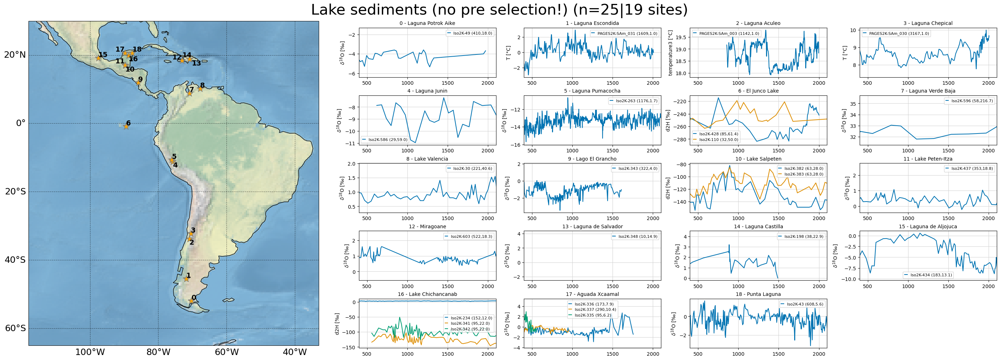

In [112]:
plot_map_ts(data=pages_iso[pages_iso['archiveType']=='lake sediment'],
    title='Lake sediments (no pre selection!)',
    figsize=(28,10),
    gridspec=(5,4),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
       )

### Lake sediment comment

Except for lake Pumacocha, we actually need to rely on the 3 Pages2k lakes. All lake records for central america represent E/P more than d18O of precipitation, which makes it difficult to use them.

Have they been used by LMR and PHYDA? It looks like lake records only came from high latitudes (why were they excluded, if these  lakes were already calibrated to temperature?) For some reasons they have not used them.

**Important things to consider:**
* **seasonality** in the lake sedimentation
* **bioturbation** (The original publication say something about that when they compute the correlation to instrumental temperature). I do not thinkt Pages2k says anything about that.

#### Laguna Escondida (Elbert 2011):
- Biogenic silica flux
    - 7 year filtered data
   
#### Laguna Aculeo (von Gunten 2009):
- reflectance based
- 5 year filter, but also test no filter and 3 year filter

#### Laguna Chepical (de Jong 2013):
- reflectance based
- 3 year filter (also tested unfiltered and 5 year filter, decided to use 3 year filter for the temperature calibration

#### Laguna Pumacocha (Bird et al):
- no calibration. Scan publication more carefully! It has been used by R. Orrison in her EOF study
- not perfectly annual resolution before 1800CE

### Lago El Grancho:
- coarsest resolution (more than 10 years sometimes)

### Lago Plomo
- 5 year

**All lake sediments shall be thus used on an 


In [30]:
lakes

,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,year,minYear,maxYear,paleoData_variableName,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID,paleoData_units,geo_meanElev,paleoData_hasResolution_hasMedianValue,median resol,PSM,seasonality,variable_name,noise_snr,regression_params,regression_params_var
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,
Iso2K-343,lake sediment,Lago El Grancho,10.1130/G33736.1,11.9000,-85.9167,"[2004.0, 1992.0, 1981.0, 1970.0, 1959.0, 1947....",341.00,2004.0,d18O,"[0.29, -0.75, 0.36, -0.03, 1.29, 1.65, 1.81, 0...",NaN,"[{'basis': 'More specifi cally, the ostracod-b...",NaN,E/P,"More specifi cally, the ostracod-based oxygen ...","[NaN, NaN]",Iso2K-343,NaN,NaN,NaN,4.00,inf_weighted,None,d18O,assumed,None,None
Iso2K-263,lake sediment,Laguna Pumacocha,10.1016/j.epsl.2011.08.040,-10.7000,-76.0600,"[2007.0, 2006.0, 2005.0, 2004.0, 2003.0, 2002....",-276.39,2007.0,d18O,"[-12.3, -12.7, -11.9, -13.1, -13.1, -12.4, -12...",NaN,[{'basis': 'd18O.precipitation over tropical S...,December - March (monsoon season),d18O precipitation,d18O.precipitation over tropical South America...,"[NaN, NaN]",Iso2K-263,NaN,NaN,NaN,1.67,inf_weighted,None,d18O,assumed,None,None
PAGES2K-SAm_030,lake sediment,Laguna Chepical,10.5194/cp-9-1921-2013,-32.2667,-70.5000,"[-1161.0, -1160.0, -1159.0, -1158.0, -1157.0, ...",-1161.00,2005.0,tsurf,"[7.7935, 7.8109, 7.8282, 7.8415, 7.8466, 7.839...",reflectance,NaN,-11 -12 1 2,T,air@surface,NaN,PAGES2K-SAm_030,NaN,NaN,NaN,1.00,season,"11,12,1,2",tsurf,assumed,None,None
PAGES2K-SAm_003,lake sediment,Laguna Aculeo,10.1177/0959683609336573,-33.8500,-70.9200,"[856.0, 857.0, 858.0, 859.0, 860.0, 861.0, 862...",856.00,1997.0,tsurf,"[19.166, 19.14, 19.094, 19.028, 18.954, 18.881...",reflectance,NaN,-12 1 2,T,air@surface,NaN,PAGES2K-SAm_003,NaN,NaN,NaN,1.00,season,"12,1,2",tsurf,assumed,None,None
PAGES2K-SAm_031,lake sediment,Laguna Escondida,10.1016/j.palaeo.2012.11.013,-45.5167,-71.8167,"[400.0, 401.0, 402.0, 403.0, 404.0, 405.0, 406...",400.00,2008.0,tsurf,"[-1.4772, -1.4743, -1.4714, -1.497, -1.5418, -...",BSi,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,air@surface,NaN,PAGES2K-SAm_031,NaN,NaN,NaN,1.00,None,Annual,tsurf,assumed,None,None
Lago Plomo,lake sediment,Lago Plomo,10.1016/j.quaint.2015.01.004,-46.9833,-72.8667,"[1384.0, 1385.0, 1386.0, 1387.0, 1388.0, 1389....",1384.00,2001.0,tsurf,"[0.0398, 0.0855, 0.0659, -0.0536, -0.19, -0.26...",NaN,NaN,"9,10,11,12,1,2",NaN,NaN,NaN,Lago Plomo,degrees C,203.0,1.0,1.00,season,"9,10,11,12,1,2",tsurf,assumed,None,None


In [113]:
lakes=pages_iso[pages_iso['ID'].isin(['PAGES2K-SAm_031','PAGES2K-SAm_003','PAGES2K-SAm_030','Iso2K-263','Iso2K-343'])]
lakes['year']=lakes['year'].apply(lambda x: np.array(x))

def apply_function(value):
    # Apply your desired function to each value in the list
    # For example, let's multiply each value by 2
    return 1950-value 


for sel in ['Iso2K-343','Iso2K-263']:
    selected_rows = lakes['ID'] == sel
    # Apply the function to the 'year' column
    lakes.loc[selected_rows, 'year'] =lakes.loc[selected_rows, 'year'].apply(apply_function)
    lakes.loc[selected_rows, 'minYear']=np.min(lakes.loc[selected_rows, 'year'].values[0])
    lakes.loc[selected_rows, 'maxYear']=np.max(lakes.loc[selected_rows, 'year'].values[0])



###ADD LAGO PLOMO
url = "https://www.ncei.noaa.gov/pub/data/paleo/paleolimnology/southamerica/chile/plomo2015temp.txt"
filename = "plomo2015temp.txt"
urllib.request.urlretrieve(url, filename)

###
# Read the file and extract the desired data
year_ad = []
values = []
section_found = False

with open(filename, 'r', encoding='ISO-8859-1') as file:
    for line in file:
        if line.startswith('age_AD	tempanom-SONDJF	tempanom-SONDJF+	tempanom-SONDJF-'):
            section_found = True
            next(file)  # Skip the header line
            #next(file) 
            continue
        if section_found and line.strip() == '':
            break
        if section_found:
            data = line.split()
            year_ad.append(float(data[0]))
            try:
                values.append(float(data[1]))
            except:
                values.append(np.nan)

lat=-46.9833; 
#lon=360-72.8667;
lon=-72.8667;
elev=203  
time=np.array(year_ad);values=np.array(values)

   
# Print the extracted data
#for year, d18o in zip(year_ad, d18o_values):
#    print(f"YearAD: {year}\t d18O (per mil PDB): {d18o}")
time=time[~np.isnan(values)]
values=values[~np.isnan(values)]


assert len(time)==len(values)
dic={'ID':'Lago Plomo','paleoData_variableName':'tsurf','archiveType':'lake sediment','paleoData_units':'degrees C','paleoData_values':values, 'geo_meanElev':elev,
     'geo_meanLat':lat,'geo_meanLon':lon,'geo_siteName':'Lago Plomo',
     'year':time,'minYear':np.min(time),'maxYear':np.max(time),
     'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1])),
    'paleoData_climateInterpretation_seasonality':'9,10,11,12,1,2',
     'pub1_doi':'10.1016/j.quaint.2015.01.004',
    }
df=pd.DataFrame([dic])#.set_index('ID')
df=df.set_index('ID')
df['ID']='Lago Plomo'
lakes=pd.concat([lakes,df]).sort_values('geo_meanLat',ascending=False)

median=[]
for j,l in lakes.iterrows():
    years=l['year']
    resol=np.abs(np.median(years[1:]-years[:-1]))
    median.append(resol)
lakes['median resol']=median

#replace specifc cells
lakes=lakes.replace({
    'temperature':'tsurf',
'temperature3':'tsurf'
})

lakes['PSM']=['inf_weighted','inf_weighted','season','season','None','season'] #None equalt to simply take annual
lakes['seasonality']=['None','None','11,12,1,2','12,1,2','Annual','9,10,11,12,1,2']
lakes['variable_name']=lakes['paleoData_variableName']
lakes['noise_snr']=len(lakes)*['assumed']
lakes['regression_params']=len(lakes)*['None']
lakes['regression_params_var']=len(lakes)*['None']

/tmp/ipykernel_165216/1158272061.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lakes['year']=lakes['year'].apply(lambda x: np.array(x))
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/pandas/core/array_algos/replace.py:86: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  op = lambda x: operator.eq(x, b)


In [114]:
lakes_xr=table_to_xarray(lakes,start=1,end=2015) #I don't cut the proxy db, as it might cause problems
if np.min(lakes_xr['geo_meanLon'])<0:
    lakes_xr['geo_meanLon'] = lakes_xr['geo_meanLon'] % 360
lakes_xr.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes.nc')

In [116]:
lakes_xr

<xarray.DataArray (time: 2015, site: 6)>
array([[     nan,      nan,   9.403 ,      nan,      nan,      nan],
       [     nan, -13.2   ,   9.2884,      nan,      nan,      nan],
       [     nan, -13.5   ,   9.1739,      nan,      nan,      nan],
       ...,
       [     nan,      nan,      nan,      nan,      nan,      nan],
       [     nan,      nan,      nan,      nan,      nan,      nan],
       [     nan,      nan,      nan,      nan,      nan,      nan]])
Coordinates: (12/14)
  * time                    (time) object 0001-01-01 00:00:00 ... 2015-01-01 ...
    archiveType             (site) object 'lake sediment' ... 'lake sediment'
    geo_siteName            (site) object 'Lago El Grancho' ... 'Lago Plomo'
    pub1_doi                (site) object '10.1130/G33736.1' ... '10.1016/j.q...
    geo_meanLat             (site) float64 11.9 -10.7 -32.27 ... -45.52 -46.98
    geo_meanLon             (site) float64 274.1 283.9 289.5 289.1 288.2 287.1
    ...                      ...
    paleoData_variableName  (site) object 'd18O' 'd18O' ... 'tsurf' 'tsurf'
    PSM                     (site) object 'inf_weighted' ... 'season'
    seasonality             (site) object 'None' 'None' ... '9,10,11,12,1,2'
    variable_name           (site) object 'd18O' 'd18O' ... 'tsurf' 'tsurf'
    noise_snr               (site) object 'assumed' 'assumed' ... 'assumed'
    regression_params_var   (site) object 'None' 'None' 'None' ... 'None' 'None'
Dimensions without coordinates: site

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(


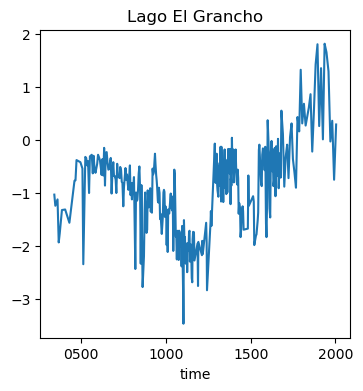

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:359: CFWarning: this date/calendar/year zero convention is not supported by CF
  lower = cftime.num2date(vmin, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:454: CFWarning: this date/calendar/year zero convention is not supported by CF
  return cftime.date2num(ticks, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:228: CFWarning: this date/calendar/year zero convention is not supported by CF
  dt = cftime.num2date(x, self.time_units, calendar=self.calendar)


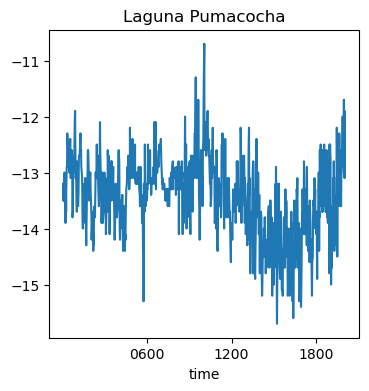

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:359: CFWarning: this date/calendar/year zero convention is not supported by CF
  lower = cftime.num2date(vmin, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:454: CFWarning: this date/calendar/year zero convention is not supported by CF
  return cftime.date2num(ticks, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:228: CFWarning: this date/calendar/year zero convention is not supported by CF
  dt = cftime.num2date(x, self.time_units, calendar=self.calendar)


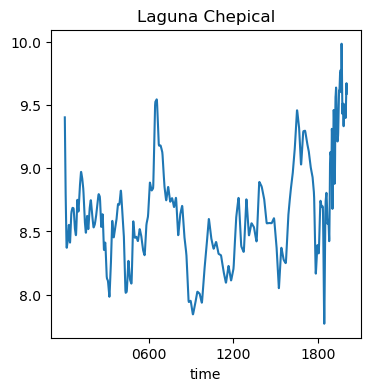

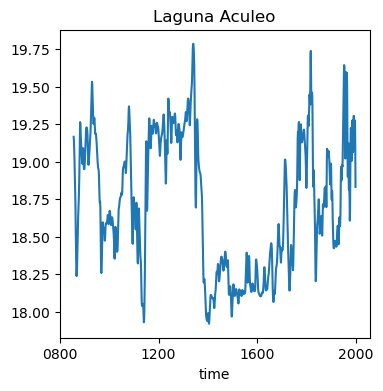

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(


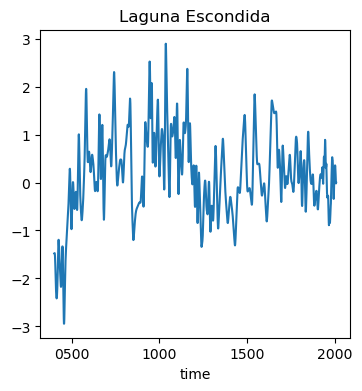

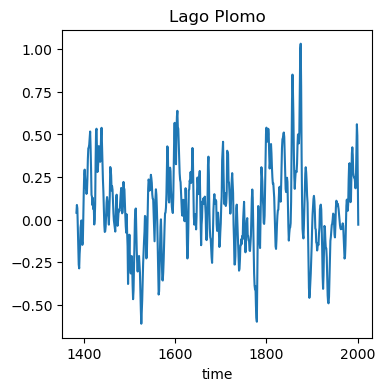

In [118]:
for s in lakes_xr.site:
    plt.figure(figsize=(4,4))
    lakes_xr.sel(site=s).dropna('time').plot()
    plt.title(lakes_xr.sel(site=s)['geo_siteName'].values)
    plt.show()

## Corals and Sclerosponge  (Pages2k/Iso2k)

**Basic PSM principle:** Calibrate its d18O, Sr/Ca or calcification rate to SST changes via a linear regression

Pages2k record correlation to temperature has already been tested. Seasonality importance?

**How far west do I go? (See Sanchez 2021 for state-of-the-art coral PaleoDA)**

**Available model variables: SAT (not SST and SSS)**

PaleoDA studies using corals/sclerosponge
- LMRv1/v2: 
    -  Linear Regression to GISTEMP temperature (annual/JJA/DJF), univariate
- PHYDA: (Did things more sophisticated careful way)
    - d18O: Bivariate regression to sst and sss (?):
        $\delta^{18}O_{coral} = a_1 SST + a_2 SSS$
        Refers to 
        - (Thompson, D. M., Ault, T. R., Evans, M. N., Cole, J. E. & Emile-Geay, J. Comparison of observed and simulated tropical climate
trends using a forward model of coral d18o.) $\Leftarrow$ report that a1=-0.22 is a good fit
        - (Carton, J. A. & Giese, B. S. A reanalysis of ocean climate using simple ocean data assimilation (soda).)
    - non-d18O corals: univariate regression with sst <- Ocean reanalysis that can be used for the regression parameters
- Sara Sanchez 2021:
    - did not use isotope enabled models for d18O_sw: asked her in presentation about that, said it didn't make a difference (d18O_sw quite stable)
     - The problem is probably the lack of sea water d18O observations.
    - uses simple linear regression to delta-sst. mentions this is a simplification, also tested a bivariate regression but fixed the sst parameter and used a ocean reanysis SSS (de Boisseon et al).
        Did not find conclusive if this makes things better (probably the sss temp covariance in the model is also not that well simulated?). They comment also on sea-surface salinity reanalysis products and their quality
    - important study to cite, that in PaleoDA, we can simply regress to sea surface temperature
    - proxy record 25 Pages2k records + 100 that are not part of that. At beginning of 19th century (period of interest of that study) there are only 30-40 records left.
- Dee 2015 (PRYSM):
    $\delta^{18}O= \alpha \Delta T +\Delta \delta^{18}O_{sw}+\epsilon_m$  or  $\delta^{18}O= \alpha \Delta T +\beta \Delta SSS+\epsilon_m$
    but did not test that

- Feng Zhu paper (2022 Nature communications,https://github.com/fzhu2e/lmrvolc): LMR calibration
    - paper extremely short on explaining what they are actually doing, probably uses the same lmr calibration (to sst).
- Okazaki, Shoji, Yoshimura (PSM papers and Isotope-enabled model PaleoDA):
    - 2017: $\delta^18$ O$_{coral}$ = $\delta^18$ O$_{sw}$+ a×SST + b , alpha=-0.22, d18Osw predicted from some other model by Li 2013, 2014 (?). Cite Thompson (see above, which use -0.22, but who actually use a different equation)
    - 2019 Global evaluation: More details on how $\delta^{18}$ O$_{sw}$ is estimated from model by Liu et al. model (psm converted) and proxy values look extremely close, however, it is not clear to what extent the dO_sw model is really needed.
        Fortran code here:https://github.com/ats-okazaki/Okazaki-Yoshimura_2019_JGR, Liu: https://agupubs.onlinelibrary.wiley.com/doi/epdf/10.1002/2014JD021583. Again, if one would use this way more complex model, we would need to investigate its influence on the covariances apart from mean value shifts. In theory it would allow us to reconstruct from corals without the calibration restriction (+ noise assumption)
    -shoji 2022: The same as  in the previous papers, use this liu proxy-syste model.
- Tierney 2015 (Ocean2k): Composite plus scale method, correlation to instrumental target SST

In [202]:
pages_iso[pages_iso['archiveType']=='coral'].sort_values('geo_meanLat')

,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,year,minYear,maxYear,paleoData_variableName,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,
Iso2K-120,coral,"Punta pitt, Isla San Cristobal, Galapagos isla...",10.1029/92PA01825,-0.6667,270.8333,"[1982.5, 1982.25, 1982.0, 1981.75, 1981.5, 198...",1936,1982.5,d18O,"[-3.787, -3.696, -3.785, -3.66, -3.311, -3.645...",NaN,"[{'direction': 'negative', 'inferredMaterial':...",subannual,T_water,Linear least squares regressions of four of th...,"[12-Apr, year]",Iso2K-120
PAGES2K-Ocn_087,coral,Urvina Bay,10.1029/93PA03501,-0.4,268.77,"[1981.0, 1980.0, 1979.0, 1978.0, 1977.0, 1976....",1607,1981,d18O,"[-3.73, -3.86, -4.04, -3.75, -3.86, -4.08, -3....",d18O,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,sea@surface,NaN,PAGES2K-Ocn_087
PAGES2K-Ocn_104,coral,"Secas Island, Panama",10.1029/94JC00360,7.95,278.0,"[1984.5, 1984.44, 1984.38, 1984.33, 1984.27, 1...",1707.75,1984.5,d18O,"[-6.12, -5.85, -5.91, -5.72, -6.18, -6.27, -5....",d18O,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_104
PAGES2K-Ocn_159,coral,Clipperton,10.1016/j.palaeo.2014.07.039,10.2773,250.7869,"[1993.95833267, 1993.87499934, 1993.79166601, ...",1934.875002,1993.958333,Sr_Ca,"[9.391988, 9.361889, 9.319804, 9.269892, 9.237...",Sr/Ca,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_159
PAGES2K-Ocn_119,coral,Clipperton Atoll,10.1029/1999PA000428,10.2773,250.7869,"[1994.04, 1993.96, 1993.87, 1993.79, 1993.71, ...",1893.79,1994.04,d18O,"[-5.69, -5.73, -5.63, -5.68, -5.91, -5.77, -5....",d18O,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_119
PAGES2K-Ocn_163,coral,Clipperton,10.1016/j.palaeo.2014.07.039,10.2773,250.7869,"[1956.79166749, 1956.70833416, 1956.62500083, ...",1874.083333,1956.791667,Sr_Ca,"[8.883191414, 8.889311743, 8.947927134, 8.9058...",Sr/Ca,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_163
PAGES2K-Ocn_162,coral,Clipperton,10.1016/j.palaeo.2014.07.039,10.2773,250.7869,"[1956.79166749, 1956.70833416, 1956.62500083, ...",1874.083333,1956.791667,d18O,"[-5.239650804, -5.283663963, -5.449829794, -5....",d18O,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_162
PAGES2K-Ocn_160,coral,Clipperton,10.1016/j.palaeo.2014.07.039,10.2773,250.7869,"[1993.95833267, 1993.87499934, 1993.79166601, ...",1894.04167,1993.958333,Sr_Ca,"[9.32615813, 9.25179023, 9.17526308, 9.21, 9.2...",Sr/Ca,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_160
PAGES2K-Ocn_161,coral,Clipperton,10.1016/j.palaeo.2014.07.039,10.2773,250.7869,"[1993.95833267, 1993.87499934, 1993.79166601, ...",1941.958335,1993.958333,Sr_Ca,"[9.21206667, 9.16379224, 9.12023017, 9.1386221...",Sr/Ca,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_161


/tmp/ipykernel_165216/3527550519.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plot_map_ts(data=pages_iso[pages_iso['minYear']<=1900][pages_iso['maxYear']>=1000][(pages_iso['archiveType']=='coral') | (pages_iso['archiveType']=='sclerosponge')][pages_iso['paleoData_variableName']=='d18O'],


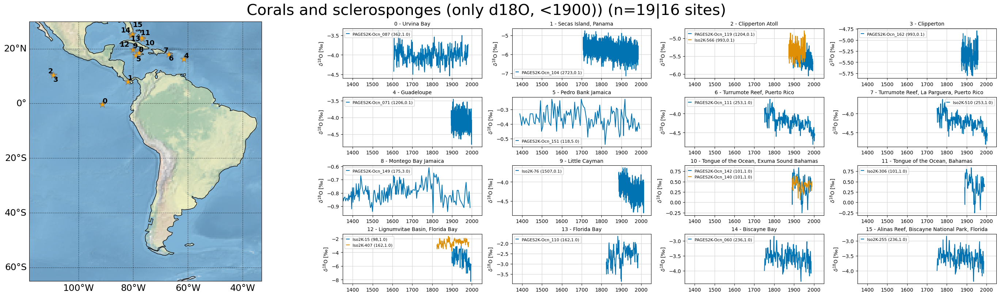

In [119]:
plot_map_ts(data=pages_iso[pages_iso['minYear']<=1900][pages_iso['maxYear']>=1000][(pages_iso['archiveType']=='coral') | (pages_iso['archiveType']=='sclerosponge')][pages_iso['paleoData_variableName']=='d18O'],
    title='Corals and sclerosponges (only d18O, <1900))',
    figsize=(28,8),
    gridspec=(4,4),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    #time_0=[400,2100], #limits
            time_0=[1350,2050], #limits
    #ticks=[500,1000,1500,2000], #limits
            ticks=[1400,1500,1600,1700,1800,1900,2000], #limits
       )

Non-annual Jamaica records (sclerosponges): We could take the temperature calibration formula as presented in the original paper by Haase-Schramm (2003):
https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2002PA000830 The paper says that Sr/Ca represents temperature better.

In [122]:
##sclerosponges
"""
sclero=pages_iso[pages_iso['ID'].isin(['PAGES2K-Ocn_150','PAGES2K-Ocn_152'])]
sclero['paleoData_values']=sclero['paleoData_values'].map(lambda x: (np.array(x).astype('float')-np.nanmean(np.array(x).astype('float')))/(-0.11)) #formula according to paper (what they considered realistic), also in pageseb
#see: https://docs.google.com/spreadsheets/d/1bx9bPISfYLxghvtVcbs9UsJOnEahoDrq9c2rYqzOCfM/edit#gid=592501232
sclero=dataframe_cftime(sclero)
"""

#HOWEVER, these records do not represent sea surface temperature! (See conclusion of the haase schramm paper, thus it doesn't make sense to include them?)
#they are included in pages2k, so what to do, I will only take the one record closer to the surface.
#ce 96 closer to the surface, its the older one -> thus
sclero=pages_iso[pages_iso['ID'].isin(['PAGES2K-Ocn_150'])]
sclero['paleoData_values']=sclero['paleoData_values'].map(lambda x: (np.array(x).astype('float')-np.nanmean(np.array(x).astype('float')))/(-0.11)) #formula according to paper (what they considered realistic), also in pageseb
#see: https://docs.google.com/spreadsheets/d/1bx9bPISfYLxghvtVcbs9UsJOnEahoDrq9c2rYqzOCfM/edit#gid=592501232
#sclero=dataframe_cftime(sclero)

psms=['None'] #None equalt to simply take annual
season=['None']
var=['tsurf']
noise_snr=1*['assumed']
regression_params=1*['None']

data=sclero

#0 for annual, 1 for djf, 2 for jja
#add these columns to corals_calib
data['PSM']=psms
data['seasonality']=season
data['variable_name']=var

sclero=data.copy(deep=True)
sclero['noise_snr']=['None']
sclero['regression_params_a']=['None']
sclero['regression_params_b']=['None']
sclero['regression_params_var']=['None']

sclero=table_to_xarray(sclero)
if np.min(sclero['geo_meanLon'])<0:
    sclero['geo_meanLon'] = sclero['geo_meanLon'] % 360
sclero.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/sclero.nc')

/tmp/ipykernel_165216/3195970728.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sclero['paleoData_values']=sclero['paleoData_values'].map(lambda x: (np.array(x).astype('float')-np.nanmean(np.array(x).astype('float')))/(-0.11)) #formula according to paper (what they considered realistic), also in pageseb
/tmp/ipykernel_165216/3195970728.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PSM']=psms
/tmp/ipykernel_165216/3195970728.py:28: SettingWithCopyWarning: 
A value is trying to be set on a 

In [123]:
"""
data=sclero
data=data[0,:].to_dataframe('meta')
data=data.drop('time',axis=1)
data['Location (Lat,Lon)']=np.round(data['geo_meanLat'].astype(float),1).astype(str)+','+np.round(data['geo_meanLon'].astype(float),1).astype(str)

one = np.max(np.vstack([data['minYear'].values.astype(int), np.zeros(len(data['minYear']))]), axis=0).astype(int).astype('<U32').tolist()
two = data['maxYear'].values.astype(int).astype('<U32').tolist()

# Concatenate the lists with a hyphen
data['Time']= [f"{a}-{b}" for a, b in zip(one,two)]
data=data.rename(columns={'seasonality':'Seasonality','paleoData_variableName':'Proxy variable','geo_siteName':'Site name','noise_snr':'SNR'})

vals=[]
for i in range(data.shape[0]):
    time=sclero.isel(site=i).dropna('time').time.dt.year.values
    vals.append(str(np.median(np.abs(time[1:]-time[:-1])).astype(int))+' (5)')
data['Med. resolution (time scale)']=vals
    
data2=data[['Site name','Location (Lat,Lon)','Time','Med. resolution (time scale)','Proxy variable','PSM','Seasonality','SNR']]
data2
"""


'\ndata=sclero\ndata=data[0,:].to_dataframe(\'meta\')\ndata=data.drop(\'time\',axis=1)\ndata[\'Location (Lat,Lon)\']=np.round(data[\'geo_meanLat\'].astype(float),1).astype(str)+\',\'+np.round(data[\'geo_meanLon\'].astype(float),1).astype(str)\n\none = np.max(np.vstack([data[\'minYear\'].values.astype(int), np.zeros(len(data[\'minYear\']))]), axis=0).astype(int).astype(\'<U32\').tolist()\ntwo = data[\'maxYear\'].values.astype(int).astype(\'<U32\').tolist()\n\n# Concatenate the lists with a hyphen\ndata[\'Time\']= [f"{a}-{b}" for a, b in zip(one,two)]\ndata=data.rename(columns={\'seasonality\':\'Seasonality\',\'paleoData_variableName\':\'Proxy variable\',\'geo_siteName\':\'Site name\',\'noise_snr\':\'SNR\'})\n\nvals=[]\nfor i in range(data.shape[0]):\n    time=sclero.isel(site=i).dropna(\'time\').time.dt.year.values\n    vals.append(str(np.median(np.abs(time[1:]-time[:-1])).astype(int))+\' (5)\')\ndata[\'Med. resolution (time scale)\']=vals\n    \ndata2=data[[\'Site name\',\'Location (La

In [129]:
corals_calib=pages_iso[pages_iso['ID'].isin(['PAGES2K-Ocn_087','PAGES2K-Ocn_104','PAGES2K-Ocn_111','Iso2K-255','PAGES2K-Ocn_065','PAGES2K-Ocn_073','PAGES2K-Ocn_070'])]

## Coral Calibration
* Using Berkeley Earth for Temperature and CRU for Precipitation

In [130]:
be='/home/mchoblet/validation_data/sa_project/upsampled/be.nc' #change time name!, temperature
be=xr.open_dataset(be)
#be['time']=xr.cftime_range('1850',periods=2079,freq='1M',calendar='standard')#['temperature']
be_corals=be.sel(time=slice('1920','2015'))['temperature']

#precipitation data set
cru='/home/mchoblet/validation_data/sa_project/upsampled/cru_prec.nc'
cru=xr.open_dataset(cru)['pre'].sel(time=slice('1950','2015'))
calib_dic_cru={'Annual':mean(cru,4),'DJF':mean(cru,[12,1,2]),'JJA':mean(cru,[6,7,8])}

In [131]:
calib=be_corals
calib_dic={'Annual':mean(calib,4),'DJF':mean(calib,[12,1,2]),'JJA':mean(calib,[6,7,8])}
t_calib=['1920','2015']

#computing consistent anomalies wrt to all calibration variables
for k,v in calib_dic.items():
    calib_dic[k]=v-v.sel(time=slice('1920','2000')).mean('time')

#for k,v in calib_dic_cru.items():
#    calib_dic_cru[k]=v-v.sel(time=slice('1950','2000')).mean('time')

In [132]:
def regioncut(field,lats,lons):
    lat=field.lat
    lon=field.lon
    
    #selection of longitudes
    if lons[0]<lons[1]:
        sel_lat = lat.where( (lat >= lats[0] ) & (lat <= lats[1]), drop=True)
        sel_lon = lon.where( (lon >= lons[0] ) & (lon <= lons[1]), drop=True)
    #cross zero-meridian region option
    else:
        sel_lat = lat.where( (lat >= lats[0] ) & (lat <= lats[1]), drop=True)
        sel_lon_1 = lon.where( (lon >= lons[0] ), drop=True)
        sel_lon_2 = lon.where((lon <= lons[1]), drop=True)
        sel_lon=xr.concat([sel_lon_1,sel_lon_2],dim='lon')
    
    field_m=field.sel(lat=sel_lat,lon=sel_lon)
    return field_m

# Which proxies span the whole last millennium (850-1850CE) and could be used for validation?

In [133]:
proxies={
    'tree':'/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_ann.nc',
    'speleothem':'/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc',
    'lake sediment':'/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes.nc',
    'ice core':'/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc',
    'marine sediment':'/home/mchoblet/paleoda/data/proxy_dbs/paper/marine.nc',
    'sclerosponge':'/home/mchoblet/paleoda/data/proxy_dbs/paper/sclero.nc',
    'coral':'/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_ann.nc',
}

In [134]:
corals_calib.sort_values('geo_meanLat',ascending=False)

,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,year,yearUnits,minYear,maxYear,paleoData_hasResolution_hasMedianValue,paleoData_variableName,paleoData_units,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,,,,
PAGES2K-Ocn_065,coral,Gingerbreads Bahamas,10.1038/ngeo552,25.84,281.38,"[1991.0, 1990.0, 1989.0, 1988.0, 1987.0, 1986....",AD,1552,1991,-1.0,calcification,cm/yr,"[0.166, 0.173, 0.176, 0.125, 0.167, 0.176, 0.1...",calcification,NaN,-12 -11 -10 -9 1 2 3 4 5 6 7 8,T,sea@surface,NaN,PAGES2K-Ocn_065
Iso2K-255,coral,"Alinas Reef, Biscayne National Park, Florida",10.2307/3515246,25.3903,279.8285,"[1986.0, 1985.0, 1984.0, 1983.0, 1982.0, 1981....",AD,1751,1986,-1.0,d18O,permil,"[-3.69, -4.08, -3.64, -3.37, -3.35, -3.57, -3....",NaN,"[{'interpDirection': 'decrease/increase', 'sco...",NaN,P,NaN,"[NaN, NaN]",Iso2K-255
PAGES2K-Ocn_070,coral,Dry Tortugas,10.1002/2013PA002524,24.6,277.7,"[2008.625, 2008.54166666667, 2008.45833333333,...",AD,1733.791667,2008.625,-0.083333,Sr_Ca,mmol/mol,"[8.7956423285, 8.83055918875, 8.88449857625, 8...",Sr/Ca,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_070
PAGES2K-Ocn_073,coral,"Punta Maroma, Mexico",10.1002/2013PA00252,20.83,273.26,"[2009.0, 2008.0, 2007.0, 2006.0, 2005.0, 2004....",AD,1773,2009,-1.0,calcification,mm/yr,"[-1.04186384621649, -1.21565204778387, -0.9503...",calcification,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,sea@surface,NaN,PAGES2K-Ocn_073
PAGES2K-Ocn_111,coral,"Turrumote Reef, Puerto Rico",10.1029/2008PA001598,17.93,293.0,"[2004.0, 2003.0, 2002.0, 2001.0, 2000.0, 1999....",AD,1751,2004,-1.0,d18O,permil,"[-4.57, -4.52, -4.72, -4.69, -4.36, -4.44, -4....",d18O,NaN,-12 -11 -10 -9 -8 -7 1 2 3 4 5 6,T,sea@surface,NaN,PAGES2K-Ocn_111
PAGES2K-Ocn_104,coral,"Secas Island, Panama",10.1029/94JC00360,7.95,278.0,"[1984.5, 1984.44, 1984.38, 1984.33, 1984.27, 1...",AD,1707.75,1984.5,-0.09,d18O,permil,"[-6.12, -5.85, -5.91, -5.72, -6.18, -6.27, -5....",d18O,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_104
PAGES2K-Ocn_087,coral,Urvina Bay,10.1029/93PA03501,-0.4,268.77,"[1981.0, 1980.0, 1979.0, 1978.0, 1977.0, 1976....",AD,1607,1981,-1.0,d18O,permil,"[-3.73, -3.86, -4.04, -3.75, -3.86, -4.08, -3....",d18O,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,sea@surface,NaN,PAGES2K-Ocn_087


In [158]:
proxy_data=corals_calib.sort_values('geo_meanLat')
proxy_data=dataframe_cftime(proxy_data)

#loop over precip, spei and temp calibration
cal_vars=np.zeros((3,len(proxy_data)),dtype='object')
calibs=np.zeros((3,len(proxy_data),4))

t_calib=[['1920','2015'],['1950','2015']]
dicts={'tsurf':calib_dic,'prec':calib_dic_cru}

proxies_subannual=[] #First 3 values are Secas, Second 3 are from Dry Tortugas

for j,(idx,i) in enumerate(proxy_data.iterrows()):
    #create dataarray for proxy
    vals=np.array(i['paleoData_values']).astype('float')
    time=np.array(i['year'])
    sort=np.argsort(time)
    time=time[sort]
    vals=vals[sort]
    proxy=xr.DataArray(vals,dims=('time'),coords=({'time':time}))
    
    #resample proxy annually, fill nan
    if (i['geo_siteName']!='Secas Island, Panama')  & (i['ID']!='PAGES2K-Ocn_070'): #resample proxies later
        proxy=proxy.resample(time='YS').mean()  
        #demean the proxy records with respect to one joint time frame
        proxy=(proxy-proxy.sel(time=slice('1750','1850')).mean('time'))/proxy.sel(time=slice('1750','1850')).std('time')
        proxy_data['paleoData_values'][j]=proxy.dropna('time').values
        
    #cut proxy record
    
    fit_params={}
    #shift=[-1,0] #shift the calibration year either by -1 or 0 (due to the fact that proxy year might mismatch by one. Thought also about +1, but I don't think it fits).
    shift=[0]
    for ii,kk in enumerate(['Annual','DJF','JJA']):
        psl=[]
        fit_params=[]
        vals_l=[]
        proxy_l=[]
        
        for jj,(var,calib_d) in enumerate(dicts.items()):
            proxy0=proxy.copy(deep=True)
            
            
            
            #select calibration values for nearby gridcell
            try:
                c=calib_d[kk].sel(latitude=xr.DataArray(i['geo_meanLat']),longitude=xr.DataArray(i['geo_meanLon']),method='nearest')
            except:
                c=calib_d[kk].sel(lat=xr.DataArray(i['geo_meanLat']),lon=xr.DataArray(i['geo_meanLon']),method='nearest')
            c=c.resample(time='YS').mean()
            c=c.sel(time=slice(t_calib[jj][0],t_calib[jj][1]))
            
            
            if len(c[~np.isnan(c.values)])<5:
                #something is wrong then
                #import pdb
                #pdb.set_trace()
                continue
            
            #secas island and  subannually resolved
            if (i['geo_siteName']=='Secas Island, Panama')  | (i['ID']=='PAGES2K-Ocn_070'):
                #import pdb
                #pdb.set_trace()
                if ii==0:
                    proxy0=mean(proxy0,4)
                elif ii==1:
                    proxy0=mean(proxy0,[12,1,2])
                else:
                    proxy0=mean(proxy0,[6,7,8])
                proxy0=(proxy0-proxy0.sel(time=slice('1750','1850')).mean('time'))/proxy0.sel(time=slice('1750','1850')).std('time')
                
                if jj==0:
                    #print(i['geo_siteName'])
                    proxies_subannual.append(proxy0)
            
                
            
            proxy0=proxy0.sel(time=slice(t_calib[jj][0],t_calib[jj][1])) 
                
            #reindex proxy to fill nans at the end
            proxy0=proxy0.resample(time='YS').mean()
            corrs=[]
            ps=[]
            lis=[]
            vals=[]
            proxy_vals=[]
            #compute correlations for shifts
            for t_shift in shift:
                c2=c.shift(time=t_shift)
                proxy2=proxy0.reindex(time=c2['time'])
                proxy2=proxy2.resample(time='YS').mean() #needed to fill some nans eventually

                #check for nans in the calibration data and proxy
                proxy2=proxy2[~np.isnan(c2)]
                c2=c2[~np.isnan(c2)]
                c2=c2[~np.isnan(proxy2)]
                proxy2=proxy2[~np.isnan(proxy2)]

                slope, intercept, r, p, se=stats.linregress(c2.values,proxy2.values)
                #got the error wrong initialy, se is not the error i'm looking for!
                #I need the variance of the residuals, thus
                err=np.mean((proxy2.values-c2.values*slope-intercept)**2)
                li=[r,p,slope,intercept,len(c2.values),err]

                corrs.append(r)
                lis.append(li)
                vals.append(c2.values)
                proxy_vals.append(proxy2.values)
                
                ps.append(xskillscore.pearson_r_eff_p_value(proxy2,c2).values.tolist()) #compute effective p value

            #for each season, select the better correlation values according to the smaller p-value
            iii=np.argmin(ps)
            psl.append(ps[iii])
            #print(idx,kk,ii)
            fit_params.append(lis[iii])
            vals_l.append(vals[iii])
            proxy_l.append(proxy_vals[iii])
            
        #find best match
        iii=np.argmin(psl)
        a=fit_params[iii][2]
        b=fit_params[iii][3]
        r=fit_params[iii][0]
        var=fit_params[iii][-1]
        """
        plt.scatter(proxy_l[iii],vals_l[iii])
        plt.xlabel('proxy')
        plt.ylabel('calib')
        plt.show()
        """
        snr=np.abs(r)/(1-np.abs(r)**2)
        calibs[ii,j,:]=[a,b,snr,var]
        cal_vars[ii,j]=list(dicts.keys())[iii]
        print(i['geo_siteName'], fit_params[iii][0],snr,list(dicts.keys())[iii])
        
#precipitation apparently useful, but cutting the subannua proxies brings some important signal to noise benefit

psms=['linear']*len(corals_calib)
season=['None']*len(corals_calib) #seasonality comes from specif reconstruction
var=['tsurf']*len(corals_calib) #all reconstructions yield best fit to temperature, so just setting it like that
#0 for annual, 1 for djf, 2 for jja
#add these columns to corals_calib
proxy_data['PSM']=psms
proxy_data['seasonality']=season
proxy_data['variable_name']=var

#if np.min(proxy_data['geo_meanLon'])<0:
#    proxy_data['geo_meanLon'] = proxy_data['geo_meanLon'] % 360


#specif data arrays for the different seasons
corals_calib_ann=proxy_data.copy(deep=True)
corals_calib_djf=proxy_data.copy(deep=True)
corals_calib_jja=proxy_data.copy(deep=True)

#add subannual records 
#print(corals_calib_ann.loc['PAGES2K-Ocn_104','year'])
corals_calib_ann.loc['PAGES2K-Ocn_104','year']=xr.CFTimeIndex(proxies_subannual[0].time.values)
corals_calib_ann.loc['PAGES2K-Ocn_104','paleoData_values']=proxies_subannual[0].values
corals_calib_ann.loc['PAGES2K-Ocn_070','year']=xr.CFTimeIndex(proxies_subannual[3].time.values)
corals_calib_ann.loc['PAGES2K-Ocn_070','paleoData_values']=proxies_subannual[3].values
#print(corals_calib_ann.loc['PAGES2K-Ocn_104','year'])

#add subannual records 
corals_calib_djf.loc['PAGES2K-Ocn_104','year']=xr.CFTimeIndex(proxies_subannual[1].time.values)
corals_calib_djf.loc['PAGES2K-Ocn_104','paleoData_values']=proxies_subannual[1].values
corals_calib_djf.loc['PAGES2K-Ocn_070','year']=xr.CFTimeIndex(proxies_subannual[4].time.values)
corals_calib_djf.loc['PAGES2K-Ocn_070','paleoData_values']=proxies_subannual[4].values

#add subannual records 
corals_calib_jja.loc['PAGES2K-Ocn_104','year']=xr.CFTimeIndex(proxies_subannual[2].time.values)
corals_calib_jja.loc['PAGES2K-Ocn_104','paleoData_values']=proxies_subannual[2].values
corals_calib_jja.loc['PAGES2K-Ocn_070','year']=xr.CFTimeIndex(proxies_subannual[5].time.values)
corals_calib_jja.loc['PAGES2K-Ocn_070','paleoData_values']=proxies_subannual[5].values

#add annual
corals_calib_ann['noise_snr']=calibs[0,:,2]
corals_calib_ann['regression_params_a']=calibs[0,:,0]
corals_calib_ann['regression_params_b']=calibs[0,:,1]
corals_calib_ann['regression_params_var']=calibs[0,:,3]

#add djf
corals_calib_djf['seasonality']=['12,1,2']*len(corals_calib)
corals_calib_djf['noise_snr']=calibs[1,:,2]
corals_calib_djf['regression_params_a']=calibs[1,:,0]
corals_calib_djf['regression_params_b']=calibs[1,:,1]
corals_calib_djf['regression_params_var']=calibs[1,:,3]

#add jja
corals_calib_jja['seasonality']=['6,7,8']*len(corals_calib)
corals_calib_jja['noise_snr']=calibs[2,:,2]
corals_calib_jja['regression_params_a']=calibs[2,:,0]
corals_calib_jja['regression_params_b']=calibs[2,:,1]
corals_calib_jja['regression_params_var']=calibs[1,:,3]

#convert times properly (i don't know why that doesn't work above for the two subannaul records) the paleoData_values are changed properly, I have checked that)
corals_calib_ann.loc[:,'year']=corals_calib_ann.loc[:,'year'].apply(lambda x: xr.CFTimeIndex(x))
corals_calib_djf.loc[:,'year']=corals_calib_djf.loc[:,'year'].apply(lambda x: xr.CFTimeIndex(x))
corals_calib_jja.loc[:,'year']=corals_calib_jja.loc[:,'year'].apply(lambda x: xr.CFTimeIndex(x))

corals_calib_ann=table_to_xarray(corals_calib_ann)
corals_calib_djf=table_to_xarray(corals_calib_djf)
corals_calib_jja=table_to_xarray(corals_calib_jja)
corals_calib_djf.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_djf.nc')
corals_calib_jja.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_jja.nc')
corals_calib_ann.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_ann.nc')

Urvina Bay -0.4652203202976129 0.5937188617288285 tsurf
Urvina Bay -0.3120782989677775 0.34575208499700844 tsurf
Urvina Bay -0.39475893057792577 0.46763221613191663 tsurf
Secas Island, Panama -0.23142688246835869 0.2445231517085149 tsurf
Secas Island, Panama -0.23348135543921475 0.24694309875515813 tsurf
Secas Island, Panama -0.22587825370632486 0.23802239064761793 tsurf
Turrumote Reef, Puerto Rico -0.47581469727703807 0.6150652369851668 tsurf
Turrumote Reef, Puerto Rico -0.3930860861591064 0.4649247037021385 tsurf
Turrumote Reef, Puerto Rico -0.48209421151004717 0.6280660825409958 tsurf
Punta Maroma, Mexico -0.5288334582375794 0.7341491540748719 tsurf
Punta Maroma, Mexico -0.358904302934604 0.41197126909001547 tsurf
Punta Maroma, Mexico -0.40487127295675784 0.4842498744303692 tsurf
Dry Tortugas -0.3718990576797419 0.43159208863658827 tsurf
Dry Tortugas -0.5935235426935895 0.9163134671005574 tsurf
Dry Tortugas -0.3254150114171718 0.3639561190407288 tsurf
Alinas Reef, Biscayne National 

In [137]:
"""
data0=corals_calib_ann.sortby('geo_meanLat',ascending=False)
data=data0[0,:].to_dataframe('meta')
data=data.drop('time',axis=1)
data['Location (Lat,Lon)']=np.round(data['geo_meanLat'].astype(float),1).astype(str)+','+np.round(data['geo_meanLon'].astype(float),1).astype(str)

one = np.max(np.vstack([data['minYear'].values.astype(int), np.zeros(len(data['minYear']))]), axis=0).astype(int).astype('<U32').tolist()
two = data['maxYear'].values.astype(int).astype('<U32').tolist()

# Concatenate the lists with a hyphen
data['Time']= [f"{a}-{b}" for a, b in zip(one,two)]
data=data.rename(columns={'seasonality':'Seasonality','paleoData_variableName':'Proxy variable','geo_siteName':'Site name','noise_snr':'SNR'})

vals=[]
for i in range(data.shape[0]):
    time=data0.isel(site=i).dropna('time').time.dt.year.values
    vals.append(str(np.median(np.abs(time[1:]-time[:-1])).astype(int))+' (1)')
data['Med. resolution (time scale)']=vals
    
data2=data[['Site name','Location (Lat,Lon)','Time','Med. resolution (time scale)','Proxy variable','PSM','Seasonality','SNR']]
data2
"""

'\ndata0=corals_calib_ann.sortby(\'geo_meanLat\',ascending=False)\ndata=data0[0,:].to_dataframe(\'meta\')\ndata=data.drop(\'time\',axis=1)\ndata[\'Location (Lat,Lon)\']=np.round(data[\'geo_meanLat\'].astype(float),1).astype(str)+\',\'+np.round(data[\'geo_meanLon\'].astype(float),1).astype(str)\n\none = np.max(np.vstack([data[\'minYear\'].values.astype(int), np.zeros(len(data[\'minYear\']))]), axis=0).astype(int).astype(\'<U32\').tolist()\ntwo = data[\'maxYear\'].values.astype(int).astype(\'<U32\').tolist()\n\n# Concatenate the lists with a hyphen\ndata[\'Time\']= [f"{a}-{b}" for a, b in zip(one,two)]\ndata=data.rename(columns={\'seasonality\':\'Seasonality\',\'paleoData_variableName\':\'Proxy variable\',\'geo_siteName\':\'Site name\',\'noise_snr\':\'SNR\'})\n\nvals=[]\nfor i in range(data.shape[0]):\n    time=data0.isel(site=i).dropna(\'time\').time.dt.year.values\n    vals.append(str(np.median(np.abs(time[1:]-time[:-1])).astype(int))+\' (1)\')\ndata[\'Med. resolution (time scale)\']=v

# Tree rings calibration

- calibrate with temperature (1920-2015), spei (1950-2015), precipitation (1950-2015)

In [138]:
spei_12_th='/home/mchoblet/validation_data/sa_project/spei12.nc'

In [139]:
be='/home/mchoblet/validation_data/sa_project/upsampled/be.nc' #change time name!, temperature
be=xr.open_dataset(be)
#be['time']=xr.cftime_range('1850',periods=2079,freq='1M',calendar='standard')#['temperature']
be=be.sel(time=slice('1920','2015'))['temperature']
calib_dic={'Annual':mean(be,4),'DJF':mean(be,[12,1,2]),'JJA':mean(be,[6,7,8])}

In [143]:
"""
SPEI DATASET COMPUTED PREVIOUSLY FROM HADCRUT DATA (SEE SPEI NOTEBOOK)
"""

spei_ann=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/spei_ann.nc').sel(time=slice('1920','2015'))
spei_jja=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/spei_jja.nc').sel(time=slice('1920','2015'))
spei_djf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/spei_djf.nc').sel(time=slice('1920','2015'))

calib_dic_spei={'Annual':spei_ann['spei'],'DJF':spei_djf['spei'],'JJA':spei_jja['spei']}

for k,v in calib_dic_spei.items():
    calib_dic_spei[k]=v-v.sel(time=slice('1950','2000')).mean('time')

In [141]:
"""
spei_12_pm='/home/mchoblet/validation_data/sa_project/SPEI_12.nc'
spei=xr.open_dataset(spei_12_pm)['spei'].sel(time=slice('1900','2015'))
#for some stupid reason, the calculation of spei for the specific seasonal means take
#ages (its the coarsen.sum function that causes problems

#i compute it once and then allways call it here
calib_dic_spei={'Annual':mean(spei,4),'DJF':mean(spei,[12,1,2]),'JJA':mean(spei,[6,7,8])}
calib_dic_spei['Annual'].to_netcdf('/home/mchoblet/validation_data/sa_project/spei_ann')
calib_dic_spei['JJA'].to_netcdf('/home/mchoblet/validation_data/sa_project/spei_jja')
calib_dic_spei['DJF'].to_netcdf('/home/mchoblet/validation_data/sa_project/spei_djf')
"""

"\nspei_12_pm='/home/mchoblet/validation_data/sa_project/SPEI_12.nc'\nspei=xr.open_dataset(spei_12_pm)['spei'].sel(time=slice('1900','2015'))\n#for some stupid reason, the calculation of spei for the specific seasonal means take\n#ages (its the coarsen.sum function that causes problems\n\n#i compute it once and then allways call it here\ncalib_dic_spei={'Annual':mean(spei,4),'DJF':mean(spei,[12,1,2]),'JJA':mean(spei,[6,7,8])}\ncalib_dic_spei['Annual'].to_netcdf('/home/mchoblet/validation_data/sa_project/spei_ann')\ncalib_dic_spei['JJA'].to_netcdf('/home/mchoblet/validation_data/sa_project/spei_jja')\ncalib_dic_spei['DJF'].to_netcdf('/home/mchoblet/validation_data/sa_project/spei_djf')\n"

In [142]:
#precipitation data set
cru='/home/mchoblet/validation_data/sa_project/upsampled/cru_prec.nc'
cru=xr.open_dataset(cru)['pre'].sel(time=slice('1950','2015'))
calib_dic_cru={'Annual':mean(cru,4),'DJF':mean(cru,[12,1,2]),'JJA':mean(cru,[6,7,8])}

In [144]:
pages_trees=pages_iso[pages_iso['archiveType']=='tree']

proxy_data=pages_trees
proxy_data=dataframe_cftime(proxy_data)
pages_trees=proxy_data

if np.mean(proxy_data['geo_meanLon'])<0:
    print('Convert longitude to 0 ... 360')
    proxy_data['geo_meanLon']=proxy_data['geo_meanLon']%360
    
#loop over precip, spei and temp calibration
cal_vars=np.zeros((3,len(proxy_data)),dtype='object')
calibs=np.zeros((3,len(proxy_data),4))

t_calib=[['1920','2015'],['1950','2015'],['1950','2015']]
dicts={'tsurf':calib_dic,'spei':calib_dic_spei,'prec':calib_dic_cru}

for j,(idx,i) in enumerate(proxy_data.iterrows()):
    #create dataarray for proxy
    vals=np.array(i['paleoData_values']).astype('float')
    time=np.array(i['year'])
    sort=np.argsort(time)
    time=time[sort]
    vals=vals[sort]
    proxy=xr.DataArray(vals,dims=('time'),coords=({'time':time}))
    #resample proxy annually, fill nan
    proxy=proxy.resample(time='YS').mean()
    #cut proxy record
    #demean the proxy records with respect to one joint time frame
    proxy=proxy-proxy.sel(time=slice('1750','1850')).mean('time')
    
    fit_params={}
    shift=[-1,0] #shift the calibration year either by -1 or 0 (due to the fact that proxy year might mismatch by one. Thought also about +1, but I don't think it fits).
    for ii,kk in enumerate(['Annual','DJF','JJA']):
        
        
        psl=[]
        fit_params=[]
        vals_l=[]
        proxy_l=[]
        
        for jj,(var,calib_d) in enumerate(dicts.items()):
            proxy=proxy.sel(time=slice(t_calib[jj][0],t_calib[jj][1])) 
            #select calibration values for nearby gridcell
            try:
                c=calib_d[kk].sel(latitude=xr.DataArray(i['geo_meanLat']),longitude=xr.DataArray(i['geo_meanLon']),method='nearest')
            except:
                c=calib_d[kk].sel(lat=xr.DataArray(i['geo_meanLat']),lon=xr.DataArray(i['geo_meanLon']),method='nearest')
                
            c=c.resample(time='YS').mean()
            c=c.sel(time=slice(t_calib[jj][0],t_calib[jj][1]))
            
            if len(c[~np.isnan(c.values)])<5:
                #something is wrong then
                import pdb
                pdb.set_trace()
            
            #reindex proxy to fill nans at the end
            proxy=proxy.resample(time='YS').mean()
            corrs=[]
            ps=[]
            lis=[]
            vals=[]
            proxy_vals=[]
            #compute correlations for shifts
            for t_shift in shift:
                c2=c.shift(time=t_shift)
                proxy2=proxy.reindex(time=c2['time'])
                proxy2=proxy2.resample(time='YS').mean() #needed to fill some nans eventually

                #check for nans in the calibration data and proxy
                proxy2=proxy2[~np.isnan(c2)]
                c2=c2[~np.isnan(c2)]
                c2=c2[~np.isnan(proxy2)]
                proxy2=proxy2[~np.isnan(proxy2)]

                slope, intercept, r, p, se=stats.linregress(c2.values,proxy2.values)
                #got the error wrong initialy, se is not the error i'm looking for!
                #I need the variance of the residuals, thus
                err=np.mean((proxy2.values-c2.values*slope-intercept)**2)
                li=[r,p,slope,intercept,len(c2.values),err]

                corrs.append(r)
                lis.append(li)
                vals.append(c2.values)
                proxy_vals.append(proxy2.values)
                
                ps.append(xskillscore.pearson_r_eff_p_value(proxy2,c2).values.tolist()) #compute effective p value

            #for each season, select the better correlation values according to the smaller p-value
            iii=np.argmin(ps)
            psl.append(ps[iii]) #append best p value
            #print(idx,kk,ii)
            fit_params.append(lis[iii])
            vals_l.append(vals[iii])
            proxy_l.append(proxy_vals[iii])
            
        #find best match
        iii=np.argmin(psl)
        a=fit_params[iii][2]
        b=fit_params[iii][3]
        r=fit_params[iii][0]
        var=fit_params[iii][-1]
        """
        plt.scatter(proxy_l[iii],vals_l[iii])
        plt.xlabel('proxy')
        plt.ylabel('calib')
        plt.show()
        """
        snr=np.abs(r)/(1-np.abs(r)**2)
        calibs[ii,j,:]=[a,b,snr,var]
        cal_vars[ii,j]=list(dicts.keys())[iii]
        print(i['geo_siteName'], np.round(fit_params[iii][0],2),np.round(snr,2),list(dicts.keys())[iii])
        print(np.round(fit_params[iii][0],2),np.round(fit_params[iii][1],2))
        """
        plt.scatter(vals_l[iii],proxy_l[iii])
        plt.plot(vals_l[iii],vals_l[iii]*a+b,ls='--',c='blue')        
        plt.xlabel('calibration')
        plt.ylabel('proxy')
        plt.show()
        """
data=pages_trees

psms=['linear']*len(data)
season=['None']*len(data)
var=['tsurf']*len(data)
#0 for annual, 1 for djf, 2 for jja
#add these columns to corals_calib
pages_trees['PSM']=psms
pages_trees['seasonality']=season

#add annual
pages_trees_ann=pages_trees.copy(deep=True)
pages_trees_ann['variable_name']=cal_vars[0,:]
pages_trees_ann['noise_snr']=calibs[0,:,2]
pages_trees_ann['regression_params_a']=calibs[0,:,0]
pages_trees_ann['regression_params_b']=calibs[0,:,1]
pages_trees_ann['regression_params_var']=calibs[0,:,3]

#add djf
pages_trees_djf=pages_trees.copy(deep=True)
pages_trees_djf['variable_name']=cal_vars[1,:]
pages_trees_djf['seasonality']=['12,1,2']*len(data)
pages_trees_djf['noise_snr']=calibs[1,:,2]
pages_trees_djf['regression_params_a']=calibs[1,:,0]
pages_trees_djf['regression_params_b']=calibs[1,:,1]
pages_trees_djf['regression_params_var']=calibs[0,:,3]

#add jja
pages_trees_jja=pages_trees.copy(deep=True)
pages_trees_jja['variable_name']=cal_vars[2,:]
pages_trees_jja['seasonality']=['6,7,8']*len(data)
pages_trees_jja['noise_snr']=calibs[2,:,2]
pages_trees_jja['regression_params_a']=calibs[2,:,0]
pages_trees_jja['regression_params_b']=calibs[2,:,1]
pages_trees_jja['regression_params_var']=calibs[0,:,3]

Central Andes composite 15 0.32 0.35 prec
0.32 0.04
Central Andes composite 15 0.32 0.35 tsurf
0.32 0.04
Central Andes composite 15 0.25 0.26 prec
0.25 0.11
Central Andes composite 11 -0.24 0.25 tsurf
-0.24 0.04
Central Andes composite 11 -0.36 0.41 tsurf
-0.36 0.02
Central Andes composite 11 -0.29 0.31 prec
-0.29 0.05
Central Andes composite 9 -0.36 0.41 tsurf
-0.36 0.0
Central Andes composite 9 -0.1 0.1 prec
-0.1 0.44
Central Andes composite 9 -0.21 0.22 tsurf
-0.21 0.14
Central Andes composite 6 0.19 0.19 spei
0.19 0.16
Central Andes composite 6 0.2 0.2 tsurf
0.2 0.17
Central Andes composite 6 0.16 0.16 spei
0.16 0.24
Cienega de Nuestra Senora de Guadalupe 0.45 0.56 spei
0.45 0.0
Cienega de Nuestra Senora de Guadalupe -0.4 0.48 tsurf
-0.4 0.01
Cienega de Nuestra Senora de Guadalupe 0.55 0.79 spei
0.55 0.0


# Same for breitenmoser

In [148]:
proxy_data=trees_breit_small
#proxy_data=dataframe_cftime(proxy_data)

if np.mean(proxy_data['geo_meanLon'])<0:
    print('Convert longitude to 0 ... 360')
    proxy_data['geo_meanLon']=proxy_data['geo_meanLon']%360

#loop over precip, spei and temp calibration
cal_vars=np.zeros((3,len(proxy_data)),dtype='object')
calibs=np.zeros((3,len(proxy_data),4))

t_calib=[['1920','2015'],['1950','2015'],['1950','2015']]
dicts={'tsurf':calib_dic,'spei':calib_dic_spei,'prec':calib_dic_cru}

print('Site','Corr','SNR','variable')
for j,(idx,i) in enumerate(proxy_data.iterrows()):
    #create dataarray for proxy
    vals=np.array(i['paleoData_values']).astype('float')
    time=np.array(i['year'])
    sort=np.argsort(time)
    time=time[sort]
    vals=vals[sort]
    proxy=xr.DataArray(vals,dims=('time'),coords=({'time':time}))
    #resample proxy annually, fill nan
    proxy=proxy.resample(time='YS').mean()
    #cut proxy record
    #demean the proxy records with respect to one joint time frame
    proxy=proxy-proxy.sel(time=slice('1750','1850')).mean('time')
    
    fit_params={}
    shift=[-1,0] #shift the calibration year either by -1 or 0 (due to the fact that proxy year might mismatch by one. Thought also about +1, but I don't think it fits).
    for ii,kk in enumerate(['Annual','DJF','JJA']):
        
        
        psl=[]
        fit_params=[]
        vals_l=[]
        proxy_l=[]
        
        for jj,(var,calib_d) in enumerate(dicts.items()):
            proxy=proxy.sel(time=slice(t_calib[jj][0],t_calib[jj][1])) 
            #select calibration values for nearby gridcell
            try:
                c=calib_d[kk].sel(latitude=xr.DataArray(i['geo_meanLat']),longitude=xr.DataArray(i['geo_meanLon']),method='nearest')
            except:
                c=calib_d[kk].sel(lat=xr.DataArray(i['geo_meanLat']),lon=xr.DataArray(i['geo_meanLon']),method='nearest')
                
            c=c.resample(time='YS').mean()
            c=c.sel(time=slice(t_calib[jj][0],t_calib[jj][1]))
            
            if len(c[~np.isnan(c.values)])<5:
                #something is wrong then
                break
                #import pdb
                #pdb.set_trace()
            
            #reindex proxy to fill nans at the end
            proxy=proxy.resample(time='YS').mean()
            corrs=[]
            ps=[]
            lis=[]
            vals=[]
            proxy_vals=[]
            #compute correlations for shifts
            for t_shift in shift:
                c2=c.shift(time=t_shift)
                proxy2=proxy.reindex(time=c2['time'])
                proxy2=proxy2.resample(time='YS').mean() #needed to fill some nans eventually

                #check for nans in the calibration data and proxy
                proxy2=proxy2[~np.isnan(c2)]
                c2=c2[~np.isnan(c2)]
                c2=c2[~np.isnan(proxy2)]
                proxy2=proxy2[~np.isnan(proxy2)]
                
                slope, intercept, r, p, se=stats.linregress(c2.values,proxy2.values)
                #got the error wrong initialy, se is not the error i'm looking for!
                #I need the variance of the residuals, thus
                err=np.mean((proxy2.values-c2.values*slope-intercept)**2)
                li=[r,p,slope,intercept,len(c2.values),err]
                
                

                corrs.append(r)
                lis.append(li)
                vals.append(c2.values)
                proxy_vals.append(proxy2.values)
                
                ps.append(xskillscore.pearson_r_eff_p_value(proxy2,c2).values.tolist()) #compute effective p value

            #for each season, select the better correlation values according to the smaller p-value
            iii=np.argmin(ps)
            psl.append(ps[iii])
            #print(idx,kk,ii)
            fit_params.append(lis[iii])
            vals_l.append(vals[iii])
            proxy_l.append(proxy_vals[iii])
            
        #find best match
        iii=np.argmin(psl)
        a=fit_params[iii][2]
        b=fit_params[iii][3]
        r=fit_params[iii][0]
        var=fit_params[iii][-1]
        """
        plt.scatter(proxy_l[iii],vals_l[iii])
        plt.xlabel('proxy')
        plt.ylabel('calib')
        plt.show()
        """
        snr=np.abs(r)/(1-np.abs(r)**2)
        calibs[ii,j,:]=[a,b,snr,var]
        cal_vars[ii,j]=list(dicts.keys())[iii]
        if ii==0:
            #print annual calibration
            print(i['geo_siteName'], np.round(fit_params[iii][0],4),np.round(snr,4),list(dicts.keys())[iii])
            
            
data=proxy_data

psms=['linear']*len(data)
season=['None']*len(data)
var=cal_vars[0,:]
#0 for annual, 1 for djf, 2 for jja
#add these columns to corals_calib
trees_breit_small['PSM']=psms
trees_breit_small['seasonality']=season
#trees_breit_small['variable_name']=var

#add annual
trees_breit_small_ann=trees_breit_small.copy(deep=True)
trees_breit_small_ann['variable_name']=cal_vars[0,:]
trees_breit_small_ann['noise_snr']=calibs[0,:,2]
trees_breit_small_ann['regression_params_a']=calibs[0,:,0]
trees_breit_small_ann['regression_params_b']=calibs[0,:,1]
trees_breit_small_ann['regression_params_var']=calibs[0,:,3]

#add djf
trees_breit_small_djf=trees_breit_small.copy(deep=True)
trees_breit_small_djf['variable_name']=cal_vars[1,:]
trees_breit_small_djf['seasonality']=['12,1,2']*len(data)
trees_breit_small_djf['noise_snr']=calibs[1,:,2]
trees_breit_small_djf['regression_params_a']=calibs[1,:,0]
trees_breit_small_djf['regression_params_b']=calibs[1,:,1]
trees_breit_small_djf['regression_params_var']=calibs[0,:,3]

#add jja
trees_breit_small_jja=trees_breit_small.copy(deep=True)
trees_breit_small_jja['variable_name']=cal_vars[2,:]
trees_breit_small_jja['seasonality']=['6,7,8']*len(data)
trees_breit_small_jja['noise_snr']=calibs[2,:,2]
trees_breit_small_jja['regression_params_a']=calibs[2,:,0]
trees_breit_small_jja['regression_params_b']=calibs[2,:,1]
trees_breit_small_jja['regression_params_var']=calibs[0,:,3]

Site Corr SNR variable
0 -0.2491 0.2655 tsurf
1 0.7564 1.7679 spei
8 -0.098 0.099 tsurf
13 -0.2854 0.3107 tsurf
16 -0.1544 0.1581 tsurf
18 -0.214 0.2242 prec
20 0.6915 1.3251 spei
21 -0.2012 0.2097 tsurf
35 0.3222 0.3595 spei
36 -0.2707 0.2921 tsurf
39 -0.1141 0.1156 tsurf
40 0.6373 1.0732 spei
46 -0.491 0.647 prec
48 0.3579 0.4105 spei
57 -0.3153 0.3501 tsurf
59 0.7496 1.711 spei
64 -0.3997 0.4758 tsurf
70 0.5554 0.8031 spei
71 0.1521 0.1557 tsurf
72 0.5609 0.8185 spei
79 0.2488 0.2653 tsurf
82 0.6449 1.1042 spei
85 -0.1755 0.1811 tsurf
86 0.3497 0.3984 tsurf
89 0.3174 0.353 prec
90 0.5916 0.91 spei
92 -0.2938 0.3216 tsurf
93 0.2583 0.2767 spei
95 -0.218 0.2289 spei
101 0.4121 0.4964 spei
103 -0.4083 0.49 prec
104 -0.1888 0.1958 tsurf
107 -0.0369 0.0369 tsurf
114 0.3234 0.3612 spei
116 0.2233 0.235 prec
118 0.2954 0.3236 tsurf
121 0.342 0.3873 spei
124 0.2433 0.2586 spei
130 0.3172 0.3527 spei
133 -0.3402 0.3847 tsurf
136 0.3658 0.4223 tsurf
138 -0.3095 0.3423 tsurf


/tmp/ipykernel_165216/1275301879.py:126: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trees_breit_small['PSM']=psms
/tmp/ipykernel_165216/1275301879.py:127: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trees_breit_small['seasonality']=season


# Additional Tree rings 

- South American drought atlas (Mariano Morales). 'https://www.cr2.cl/download/sada-allcrn1400-2000-fmt/?wpdmdl=26173'
- Altiplano record 
- 389 records
- 200 year record from peruvian andes 

**SADA**
- To download the file: Open in browser, then control+s (wget or via python doesn't work)

First line:
['SA', 'inp.rw', 'CEMI', '1836', '2005','-16','13','-61','39','Inpa',
 '[02JUN20-2315]']
(last element 02JUN... only at very beginning of line)

- then: [inp.rw  1836  1179  1069  1146  1209]

- the lines with the data always have kind of .


Structure: 
header: 10 columns (tree type, file name, ?, start year, end year, Latitude, Latitude, Longitude, Longitude, Site name
then: file name, decade, 10 values.
non existent values either -9999 or empty.

In [152]:
path='/home/mchoblet/paleoda/data/proxy_dbs/allcrn1400_2000_fmt.txt'
firsts=[]
proxies=[]
meta_data=[]
with open(path,'r') as f:  
    proxy_l=[]
    dates_l=[]
    for ii,line in enumerate(f):
        words=line.split()
        if len(words)>0: #skip empty lines that are inside that
            #distinguish if its a first line or a last line
            if '.' in words[1]:
                #the name
                if ii==0:
                    name=words[9]
                else:
                    name=words[9:]
                lat=float(words[5]+'.'+words[6])
                lon=float(words[7]+'.'+words[8])
                originalfile=words[1]
                
                i=0
            elif '.' in words[0]:
                num_vals=len(words)-2 # first one file, second start year
                if i==0:
                    start=words[1]
                    values=[]
                i=1
                #dates=xr.cftime_range(start=words[1],freq='YS',periods=num_vals)
                vals=words[2:]

                #if vals[-1]='-9999': #end of this one proxy
                #    vals[-1]=np.nan        
                
                values.append(vals)
                if vals[-1]=='-9999': #end of this one proxy
                    dates=xr.cftime_range(start=start,end=str(int(words[1])+num_vals-1),freq='YS')
                    values=[float(item) for sublist in values for item in sublist]
                    assert len(dates)==len(values)
                    
                    #sort out the -9999 (nan values)
                    dates=dates[np.array(values)!=-9999]
                    values_a=np.array(values)
                    values=values_a[np.array(values)!=-9999]
                    
                    proxies.append([dates,values])
                    minYear=float(start); maxYear=float(str(int(words[1])+num_vals-1)) #these are not always correclty stated
                    meta=[name,lat,lon,minYear,maxYear,originalfile]
                    meta_data.append(meta)                    
                    i=0

        else:
            pass

df_list=[]
for j,p in enumerate(proxies):
    dic={'ID':j,'paleoData_variableName':'trw','archiveType':'tree','paleoData_units':'None','paleoData_values':p[1],'geo_meanLat':meta_data[j][1],
     'geo_meanLon':meta_data[j][2],'geo_siteName':" ".join(meta_data[j][0]),'year':p[0],'minYear':meta_data[j][3],'maxYear':meta_data[j][4],
     'paleoData_hasResolution_hasMedianValue':1}
    df_list.append(pd.DataFrame([dic]))
df=pd.concat(df_list)
df=df[(df['maxYear']-df['minYear'])>200]

#exclude the longer phyda records
df=df[~df['geo_siteName'].isin(['Paso Tromen','Horqueta inferior','Horqueta inferior','Rio Frias','Rio Alerce','La Esperanza','Horqueta Superior','Rio Motoco','Rio Cisne','Rio Alejandro','Puerto Cafe'])]

#add more records? (although i'm not sure if they are not already in phyda. they only go until 1150CE anyway, so not super super interesting)

df_sada=df


# More NOAA treerings? Replace the publicly available longer time series
#- all in same noaa format
#- use the normal standardized chronology

import urllib

paths=['https://www.ncei.noaa.gov/pub/data/paleo/treering/chronologies/southamerica/chil012-noaa.crn',
       'https://www.ncei.noaa.gov/pub/data/paleo/treering/chronologies/southamerica/arge006-noaa.crn',
       'https://www.ncei.noaa.gov/pub/data/paleo/treering/chronologies/southamerica/arge119a-noaa.crn',
       'https://www.ncei.noaa.gov/pub/data/paleo/treering/chronologies/southamerica/arge015-noaa.crn',
       'https://www.ncei.noaa.gov/pub/data/paleo/treering/chronologies/southamerica/arge013-noaa.crn',
       'https://www.ncei.noaa.gov/pub/data/paleo/treering/chronologies/southamerica/arge116-noaa.crn']

names=[
'Piedra del Aguila',
'Chenque Pehuen',
'Paso del Arco',
'Primeros Pinos',
'Lonco Luan',
'Lanin',
]
# Site_Name: #for name
# Northernmost_Latitude:
# Southernmost_Latitude: 
# Earliest_Year:
# Most_Recent_Year:
#age_CE, trsgi

for i,p in enumerate(paths):
    #with open(p,'r') as f:  
    time=[]
    val=[]
    
    i=0
    skip_line=False
    data=urllib.request.urlopen(p)
    for line in data:
        #print line
        #for ii,line in enumerate(f):
        decoded_line=line.decode('utf-8')

        if decoded_line.startswith('#'):
            skip_line = True
            continue 
        if skip_line:
            skip_line = False 
            continue    
        if skip_line==False:
            words=decoded_line.split()
            time.append(words[0])
            val.append(float(words[1]))
        #if 'Site_Name' in bubu:
        #name=" ".join(bubu.split()[2:])
    dates=xr.cftime_range(start=str(time[0]),freq='YS',periods=len(time))
    df_sada.loc[df_sada['geo_siteName']==names[i],'paleoData_values'][0]=val
    df_sada.loc[df_sada['geo_siteName']==names[i],'year'][0]=dates
    
df_sada=convert_lon(df_sada)

Data longitudes are in -180 to 180, convert to 0 - 360


In [153]:
proxy_data=df_sada
#proxy_data=dataframe_cftime(proxy_data)

if np.mean(proxy_data['geo_meanLon'])<0:
    print('Convert longitude to 0 ... 360')
    proxy_data['geo_meanLon']=proxy_data['geo_meanLon']%360

#loop over precip, spei and temp calibration
cal_vars=np.zeros((3,len(proxy_data)),dtype='object')
calibs=np.zeros((3,len(proxy_data),4))

t_calib=[['1920','2015'],['1950','2015'],['1950','2015']]
dicts={'tsurf':calib_dic,'spei':calib_dic_spei,'prec':calib_dic_cru}

for j,(idx,i) in enumerate(proxy_data.iterrows()):
    #create dataarray for proxy
    vals=np.array(i['paleoData_values']).astype('float')
    time=np.array(i['year'])
    sort=np.argsort(time)
    time=time[sort]
    vals=vals[sort]
    proxy=xr.DataArray(vals,dims=('time'),coords=({'time':time}))
    #resample proxy annually, fill nan
    proxy=proxy.resample(time='YS').mean()
    #cut proxy record
    #demean the proxy records with respect to one joint time frame
    proxy=proxy-proxy.sel(time=slice('1750','1850')).mean('time') 
    fit_params={}
    shift=[-1,0] #shift the calibration year either by -1 or 0 (due to the fact that proxy year might mismatch by one. Thought also about +1, but I don't think it fits).
    for ii,kk in enumerate(['Annual','DJF','JJA']):
        
        
        psl=[]
        fit_params=[]
        vals_l=[]
        proxy_l=[]
        
        for jj,(var,calib_d) in enumerate(dicts.items()):
            proxy=proxy.sel(time=slice(t_calib[jj][0],t_calib[jj][1])) 
            #select calibration values for nearby gridcell
            try:
                c=calib_d[kk].sel(latitude=xr.DataArray(i['geo_meanLat']),longitude=xr.DataArray(i['geo_meanLon']),method='nearest')
            except:
                c=calib_d[kk].sel(lat=xr.DataArray(i['geo_meanLat']),lon=xr.DataArray(i['geo_meanLon']),method='nearest')
                
            c=c.resample(time='YS').mean()
            c=c.sel(time=slice(t_calib[jj][0],t_calib[jj][1]))
            
            if len(c[~np.isnan(c.values)])<15:
                print('No ',var,' calibration for record ',i['geo_siteName'],'coords (lat/lon): ' ,i['geo_meanLat'], i['geo_meanLon'])
            else:
                #reindex proxy to fill nans at the end
                proxy=proxy.resample(time='YS').mean()
                corrs=[]
                ps=[]
                lis=[]
                vals=[]
                proxy_vals=[]
                #compute correlations for shifts
                for t_shift in shift:
                    c2=c.shift(time=t_shift)
                    proxy2=proxy.reindex(time=c2['time'])
                    proxy2=proxy2.resample(time='YS').mean() #needed to fill some nans eventually

                    #check for nans in the calibration data and proxy
                    proxy2=proxy2[~np.isnan(c2)]
                    c2=c2[~np.isnan(c2)]
                    c2=c2[~np.isnan(proxy2)]
                    proxy2=proxy2[~np.isnan(proxy2)]

                    slope, intercept, r, p, se=stats.linregress(c2.values,proxy2.values)
                    #got the error wrong initialy, se is not the error i'm looking for!
                    #I need the variance of the residuals, thus
                    err=np.mean((proxy2.values-c2.values*slope-intercept)**2)
                    li=[r,p,slope,intercept,len(c2.values),err]
                    
                    
                    corrs.append(r)
                    lis.append(li)
                    vals.append(c2.values)
                    proxy_vals.append(proxy2.values)

                    ps.append(xskillscore.pearson_r_eff_p_value(proxy2,c2).values.tolist()) #compute effective p value

                #for each season, select the better correlation values according to the smaller p-value
                iii=np.argmin(ps)
                psl.append(ps[iii])
                #print(idx,kk,ii)
                fit_params.append(lis[iii])
                vals_l.append(vals[iii])
                proxy_l.append(proxy_vals[iii])
            
        #find best match
        iii=np.argmin(psl)
        a=fit_params[iii][2]
        b=fit_params[iii][3]
        r=fit_params[iii][0]
        var=fit_params[iii][-1]
        """
        plt.scatter(proxy_l[iii],vals_l[iii])
        plt.xlabel('proxy')
        plt.ylabel('calib')
        plt.show()
        """
        snr=np.abs(r)/(1-np.abs(r)**2)
        calibs[ii,j,:]=[a,b,snr,var]
        cal_vars[ii,j]=list(dicts.keys())[iii]
        #if ii==0:
            #print annual calibration
        print(i['geo_siteName'], np.round(fit_params[iii][0],4),np.round(snr,4),list(dicts.keys())[iii])
        
df_sada=proxy_data

data=df_sada

psms=['linear']*len(data)
season=['None']*len(data)
var=cal_vars[0,:]
#0 for annual, 1 for djf, 2 for jja
#add these columns to corals_calib
data['PSM']=psms
data['seasonality']=season
#data['variable_name']=var

#add annual
df_sada_ann=data.copy(deep=True)
df_sada_ann['variable_name']=cal_vars[0,:]
df_sada_ann['noise_snr']=calibs[0,:,2]
df_sada_ann['regression_params_a']=calibs[0,:,0]
df_sada_ann['regression_params_b']=calibs[0,:,1]
df_sada_ann['regression_params_var']=calibs[0,:,3]

#add djf
df_sada_djf=data.copy(deep=True)
df_sada_djf['variable_name']=cal_vars[1,:]
df_sada_djf['seasonality']=['12,1,2']*len(data)
df_sada_djf['noise_snr']=calibs[1,:,2]
df_sada_djf['regression_params_a']=calibs[1,:,0]
df_sada_djf['regression_params_b']=calibs[1,:,1]
df_sada_djf['regression_params_var']=calibs[0,:,3]

#add jja
df_sada_jja=data.copy(deep=True)
df_sada_jja['variable_name']=cal_vars[2,:]
df_sada_jja['seasonality']=['6,7,8']*len(data)
df_sada_jja['noise_snr']=calibs[2,:,2]
df_sada_jja['regression_params_a']=calibs[2,:,0]
df_sada_jja['regression_params_b']=calibs[2,:,1]
df_sada_jja['regression_params_var']=calibs[0,:,3]

Purupi 0.3314 0.3723 prec
Purupi 0.1951 0.2028 prec
Purupi -0.1441 0.1472 prec
Cerro Capitan -0.2915 0.3185 prec
Cerro Capitan 0.3165 0.3517 tsurf
Cerro Capitan 0.2982 0.3273 spei
Frente Sabaya 0.3679 0.4255 spei
Frente Sabaya 0.3907 0.4611 tsurf
Frente Sabaya 0.4245 0.5177 spei
Volcan Granada + Cerro Negro 0.4228 0.5148 spei
Volcan Granada + Cerro Negro -0.3614 0.4157 tsurf
Volcan Granada + Cerro Negro 0.5084 0.6857 spei
Volcan Guallatire_D -0.6012 0.9416 prec
Volcan Guallatire_D -0.5923 0.9123 prec
Volcan Guallatire_D -0.5028 0.6728 spei
Ja Condori+Cnic+serke+huari -0.5758 0.8613 spei
Ja Condori+Cnic+serke+huari -0.5281 0.7323 spei
Ja Condori+Cnic+serke+huari -0.5299 0.7367 spei
Nasahuento -0.3468 0.3941 prec
Nasahuento -0.3411 0.386 tsurf
Nasahuento -0.4391 0.5439 tsurf
Cerro Ramada -0.4304 0.5283 prec
Cerro Ramada 0.4843 0.6328 tsurf
Cerro Ramada 0.3947 0.4675 tsurf
Cerro Soniquera 0.3498 0.3986 spei
Cerro Soniquera 0.3058 0.3373 spei
Cerro Soniquera 0.3919 0.463 spei
Taipicollo -0

Lago Escondido 0.3883 0.4572 tsurf
Lago Escondido 0.3838 0.4501 prec
Lago Escondido 0.2942 0.322 tsurf
Lago Yehuin -0.224 0.2358 spei
Lago Yehuin 0.2673 0.2878 prec
Lago Yehuin 0.3696 0.4281 prec
Ea. Maria Cristina 0.315 0.3497 tsurf
Ea. Maria Cristina 0.4491 0.5626 prec
Ea. Maria Cristina 0.1747 0.1801 tsurf
Monte Grande Magallanes 0.3548 0.406 tsurf
Monte Grande Magallanes 0.2771 0.3001 tsurf
Monte Grande Magallanes 0.2196 0.2307 tsurf
Paso Cordoba -0.485 0.6342 tsurf
Paso Cordoba -0.3082 0.3406 tsurf
Paso Cordoba -0.4242 0.5172 tsurf
Peninsula Brunswick 0.305 0.3363 tsurf
Peninsula Brunswick 0.1018 0.1029 prec
Peninsula Brunswick -0.3797 0.4437 prec
Rio Claro 0.4317 0.5306 tsurf
Rio Claro -0.2801 0.3039 tsurf
Rio Claro 0.2166 0.2272 prec
No  spei  calibration for record  Rio Malenguena coords (lat/lon):  -54.31 293.9
No  prec  calibration for record  Rio Malenguena coords (lat/lon):  -54.31 293.9
Rio Malenguena -0.1535 0.1572 tsurf
No  spei  calibration for record  Rio Malenguena co

No  spei  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
No  prec  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
Bahia Crossley Isla Estados 0.0517 0.0518 tsurf
No  spei  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
No  prec  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
Bahia Crossley Isla Estados 0.2463 0.2623 tsurf
No  spei  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
No  prec  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
Bahia Crossley Isla Estados 0.2008 0.2092 tsurf
No  spei  calibration for record  Bahia del Buen Suceso coords (lat/lon):  -54.5 294.88
No  prec  calibration for record  Bahia del Buen Suceso coords (lat/lon):  -54.5 294.88
Bahia del Buen Suceso 0.2311 0.2441 tsurf
No  spei  calibration for record  Bahia del Buen Suceso coords (lat/lon): 

Santa Isabel 0.2864 0.3121 prec
Santa Isabel -0.3374 0.3807 tsurf
Ciprecito -0.4152 0.5017 tsurf
Ciprecito -0.3128 0.3467 tsurf
Ciprecito -0.3465 0.3938 tsurf
Laja -0.3843 0.4509 tsurf
Laja -0.2119 0.2219 spei
Laja -0.1669 0.1717 spei
Matancilla 0.1467 0.15 spei
Matancilla -0.2045 0.2135 tsurf
Matancilla 0.1892 0.1962 spei
Los Mayos 0.3197 0.356 prec
Los Mayos 0.2018 0.2103 prec
Los Mayos 0.2345 0.2481 spei
Quebrada los Helados 0.3798 0.4439 tsurf
Quebrada los Helados 0.2174 0.2282 spei
Quebrada los Helados 0.4331 0.5331 spei
Rio Clarillo 0.3274 0.3667 tsurf
Rio Clarillo 0.3171 0.3526 prec
Rio Clarillo 0.2179 0.2288 prec
San Gabriel 0.3697 0.4282 spei
San Gabriel 0.3138 0.348 spei
San Gabriel 0.3708 0.4299 spei
Uriola este 0.3014 0.3316 prec
Uriola este 0.3326 0.374 prec
Uriola este 0.3602 0.4139 spei
Uriola Oeste 0.4307 0.5288 spei
Uriola Oeste 0.4331 0.533 spei
Uriola Oeste 0.3972 0.4717 spei
Vizcacha 0.3785 0.4418 spei
Vizcacha 0.3079 0.3402 spei
Vizcacha 0.372 0.4318 spei
Ralco 0.1

# Rest trees

# Altiplano 2013 record

- The altiplano record is kind of a composite out of records that seem to be in SADA and some which don't seem to be in the SAD 
- attributing the location is not obvious, as several locations involved. Thus, I will simply compute the mean location.

In [235]:
lon=np.mean([69+4/60,68+27/60,68+55/60,67+34/60,67+17/60,66+35/60])
lon=int(lon)+(lon-int(lon))*3/5
lon=-lon
lat=np.mean([18+28/60,18+56/60,19+6/60,19+22/60,21+30/60,22+32/60])
lat=int(lat)+(lat-int(lat))*3/5
lat=-lat

path='/home/mchoblet/paleoda/data/proxy_dbs/Altiplano_Precipitation_reconstruction.xls'
name='South/central Altiplano record (Morales et al 2012, CP)'

df=pd.read_excel(path,sheet_name='Tree-ring Composite chronology',header=4)
dic={'ID':name,'paleoData_variableName':'trw','archiveType':'tree','paleoData_units':'None','paleoData_values':df['standard chronology'].values,'geo_meanLat':lat,
     'geo_meanLon':lon,'geo_siteName':"Southern/Central Altiplano",'year':df['year'].values,'minYear':np.min(df['year'].values),'maxYear':np.max(df['year'].values),
     'paleoData_hasResolution_hasMedianValue':1}
df1=pd.DataFrame([dic])

df1=dataframe_cftime(df1)

# Northern Altiplano 389 reconstruction

In [236]:
path='/home/mchoblet/paleoda/data/proxy_dbs/assets_1_crnreglags_PCs.xls'

df=pd.read_excel(path,header=3)
time=df['year'].values
values=df['crnNeSf'].values

name='Northern Altiplano (Morales et al 2023, CP)'

lon=np.mean([69+39/60,69+45/60,69+28/60])
lon=int(lon)+(lon-int(lon))*3/5
lon=-lon
lat=np.mean([17+24/60,17+34/60,17+51/60])
lat=int(lat)+(lat-int(lat))*3/5
lat=-lat

dic={'ID':name,'paleoData_variableName':'trw','archiveType':'tree','paleoData_units':'None','paleoData_values':values,'geo_meanLat':lat,
     'geo_meanLon':lon,'geo_siteName':"Northern Altiplano",'year':time,'minYear':np.min(time),'maxYear':np.max(time),
     'paleoData_hasResolution_hasMedianValue':1}
df2=pd.DataFrame([dic])
df2=dataframe_cftime(df2)

# 200 year western amazon record 
(https://www.cr2.cl/datos-dendro-amazonas-peru/

Locations in supplement

In [237]:
path='/home/mchoblet/paleoda/data/proxy_dbs/Peru_crns.txt'

lon=np.mean([74+16/60,74+14/60,76+20/60,74+14/60])
lon=int(lon)+(lon-int(lon))*3/5
lon=-lon
lat=np.mean([10+46/60,11+45/60,11+18/60,11+45/60])
lat=int(lat)+(lat-int(lat))*3/5
lat=-lat

#last column must be 'std'. skip 3 lines
# dont take last ad first to last column

# first  column: len10: master+year
#len>10: master + year + first value (last four)

#skip value 9990. replace by nan
# if length of word =5: Take last 4
# if len(word)=6: Take last 4

#finally only take>200 year records
with open(path,'r') as f:  
    values_l=[]
    years=[]
    proxies_l=[]
    
    i=0
    for ii,line in enumerate(f):
        words=line.split()
        if len(words)>0:
            if 'std' in words[-1]:
                if 'missing' in words:
                    if i==0:
                        vals_l=[]
                    else:
                        i+=1
                else:
                    year=float(words[0][6:10])
                    years.append(year)
                    values=[]
                    if len(words[0])<=10:
                        for w in words[1:-2]:
                            if len(w)>4:
                                w=w[-4:]
                            if len(w)>2:
                                if '9990' not in w:
                                    values.append(w)
                    else:
                        for w in words[1:-2]:
                            if len(w)>4:
                                w=w[-4:]
                            if len(w)>2:
                                if '9990' not in w:
                                    values.append(w)
                        if '9990' not in words[0][10:]:
                            values.insert(0,words[0][10:])
                    values_l.append(values)
                    
                    if words[-3]=='09990': #end of this one proxy
                        values=[float(item) for sublist in values_l for item in sublist]
                        values_l=[]
                        start=np.min(years)
                        dates=xr.cftime_range(start=str(int(start)),end=str(int(start+len(values)-1)),freq='YS')
                        i=0
                        years=[]
                        assert len(dates)==len(values)
                        #sort out the -9999 (nan values)
                        values=np.array(values)
                        #dates=dates[values_a!=9990]
                        #values=values_a[np.array(values_a)!=9990]
                        
                        if dates[-1].year-dates[0].year>200:
                        
                            proxies_l.append([dates,values])
                        
                        #minYear=float(start)
                        #maxYear=float(str(int(words[1])+num_vals-1)) #these are not always correclty stated
                    
                        #meta_data.append(meta)                    
                        #i=0

#find me               
#finally only two time series
name='Humanes fuente et al.'
time_1=[y.year for y in proxies_l[0][0]]
time=proxies_l[0][0]
dic={'ID':name,'paleoData_variableName':'trw','archiveType':'tree','paleoData_units':'None','paleoData_values':proxies_l[0][1],'geo_meanLat':lat,
     'geo_meanLon':lon,'geo_siteName':"Peruvian Andes",'year':time,'minYear':np.min(time_1),'maxYear':np.max(time_1),
     'paleoData_hasResolution_hasMedianValue':1}
df3=pd.DataFrame([dic])

time_1=[y.year for y in proxies_l[1][0]]
time=proxies_l[1][0]
dic={'ID':name,'paleoData_variableName':'trw','archiveType':'tree','paleoData_units':'None','paleoData_values':proxies_l[1][1],'geo_meanLat':lat,
     'geo_meanLon':lon,'geo_siteName':"Peruvian Andes",'year':time,'minYear':np.min(time_1),'maxYear':np.max(time_1),
     'paleoData_hasResolution_hasMedianValue':1}
df4=pd.DataFrame([dic])



# Calibration of wood d18O record

In [238]:
perito=pages_iso[pages_iso['archiveType']=='wood'][pages_iso['minYear']<=1810]
perito=dataframe_cftime(perito)

/tmp/ipykernel_285490/1044808171.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  perito=pages_iso[pages_iso['archiveType']=='wood'][pages_iso['minYear']<=1810]


In [239]:
df1,df2,df3,df4,perito=[convert_lon(d) for d in [df1,df2,df3,df4,perito]]

Data longitudes are in -180 to 180, convert to 0 - 360
Data longitudes are in -180 to 180, convert to 0 - 360
Data longitudes are in -180 to 180, convert to 0 - 360
Data longitudes are in -180 to 180, convert to 0 - 360
('Data has right longitudes, mean:', 289.9, ' min:', 289.88)
Dont do anything


In [240]:
rest_trees=pd.concat([df1,df2,df3,df4,perito])

## joint tree dataset that is calibrated at once
- demean all proxy records over period 1750 - 1850, standardize variance

In [285]:
import pandas as pd
pd.options.mode.chained_assignment = None 

In [303]:
#dataset 1: pages2k
pages_trees=pages_iso[pages_iso['archiveType']=='tree']
all_trees=pd.concat([df_sada,trees_breit_small,rest_trees,pages_trees])

#do the calibration at once
proxy_data=all_trees

#loop over precip, spei and temp calibration
cal_vars=np.zeros((3,len(proxy_data)),dtype='object')
calibs=np.zeros((3,len(proxy_data),4))

t_calib=[['1920','2015'],['1950','2015'],['1950','2015']]
dicts={'tsurf':calib_dic,'spei':calib_dic_spei,'prec':calib_dic_cru}

for j,(idx,i) in enumerate(proxy_data.iterrows()):
    #create dataarray for proxy
    vals=np.array(i['paleoData_values']).astype('float')
    time=np.array(i['year'])
    sort=np.argsort(time)
    time=time[sort]
    vals=vals[sort]
    proxy=xr.DataArray(vals,dims=('time'),coords=({'time':time}))
    #resample proxy annually, fill nan
    l=len(proxy.dropna('time'))
    proxy=proxy.resample(time='YS').mean()
    #if len(proxy)!=l:
    #    import pdb
    #    pdb.set_trace()
    #cut proxy record, demean and standardize
    proxy=(proxy-proxy.sel(time=slice('1750','1850')).mean('time'))/proxy.sel(time=slice('1750','1850')).std('time')
    proxy_data['paleoData_values'].iloc[j]=proxy.dropna('time').values
    
    fit_params={}
    shift=[-1,0] #shift the calibration year either by -1 or 0 (due to the fact that proxy year might mismatch by one. Thought also about +1, but I don't think it fits).
    for ii,kk in enumerate(['Annual','DJF','JJA']):
        psl=[]
        fit_params=[]
        vals_l=[]
        proxy_l=[]
        for jj,(var,calib_d) in enumerate(dicts.items()):
            proxy=proxy.sel(time=slice(t_calib[jj][0],t_calib[jj][1])) 
            #select calibration values for nearby gridcell
            try:
                c=calib_d[kk].sel(latitude=xr.DataArray(i['geo_meanLat']),longitude=xr.DataArray(i['geo_meanLon']),method='nearest')
            except:
                c=calib_d[kk].sel(lat=xr.DataArray(i['geo_meanLat']),lon=xr.DataArray(i['geo_meanLon']),method='nearest')
            c=c.resample(time='YS').mean(); c=c.sel(time=slice(t_calib[jj][0],t_calib[jj][1]))
            if len(c[~np.isnan(c.values)])<15: 
                print('No ',var,' calibration for record ',i['geo_siteName'],'coords (lat/lon): ' ,i['geo_meanLat'], i['geo_meanLon']);
                #continue
                break
            else:
                #reindex proxy to fill nans at the end
                proxy=proxy.resample(time='YS').mean()
                corrs=[]
                ps=[]
                lis=[]
                vals=[]
                proxy_vals=[]
                #compute correlations for shifts
                for t_shift in shift:
                    c2=c.shift(time=t_shift)
                    proxy2=proxy.reindex(time=c2['time'])
                    proxy2=proxy2.resample(time='YS').mean() #needed to fill some nans eventually

                    #check for nans in the calibration data and proxy
                    proxy2=proxy2[~np.isnan(c2)]
                    c2=c2[~np.isnan(c2)]
                    c2=c2[~np.isnan(proxy2)]
                    proxy2=proxy2[~np.isnan(proxy2)]

                    slope, intercept, r, p, se=stats.linregress(c2.values,proxy2.values)
                    #got the error wrong initialy, se is not the error i'm looking for!
                    #I need the variance of the residuals, thus
                    err=np.mean((proxy2.values-c2.values*slope-intercept)**2)
                    li=[r,p,slope,intercept,len(c2.values),err]
                    corrs.append(r)
                    lis.append(li)
                    vals.append(c2.values)
                    proxy_vals.append(proxy2.values)
                    ps.append(xskillscore.pearson_r_eff_p_value(proxy2,c2).values.tolist()) #compute effective p value
                #for each season, select the better correlation values according to the smaller p-value
                iii=np.argmin(ps)
                psl.append(ps[iii])
                #print(idx,kk,ii)
                fit_params.append(lis[iii])
                vals_l.append(vals[iii])
                proxy_l.append(proxy_vals[iii])
        
        #print('time shift', shift[iii])
        #find best match
        iii=np.argmin(psl)
        a=fit_params[iii][2]
        b=fit_params[iii][3]
        r=fit_params[iii][0]
        var=fit_params[iii][-1]
        """
        plt.scatter(proxy_l[iii],vals_l[iii])
        plt.xlabel('proxy')
        plt.ylabel('calib')
        plt.show()
        """
        #print(i['geo_siteName'],'a:', np.round(fit_params[iii][0],2),'snr:',np.round(snr,2),'var:',list(dicts.keys())[iii])
        """
        print(np.round(a,2),np.round(b,2))
        
        plt.scatter(vals_l[iii],proxy_l[iii])
        plt.plot(vals_l[iii],vals_l[iii]*a+b,ls='--',c='blue')        
        plt.xlabel('calibration')
        plt.ylabel('proxy')
        plt.show()
        """
        snr=np.abs(r)/(1-np.abs(r)**2)
        calibs[ii,j,:]=[a,b,snr,var]
        cal_vars[ii,j]=list(dicts.keys())[iii]
        #if ii==0:
            #print annual calibration
        #print(i['geo_siteName'], np.round(fit_params[iii][0],4),np.round(snr,4),list(dicts.keys())[iii])
        
all_trees=proxy_data
        
psms=['linear']*len(proxy_data)
season=['None']*len(proxy_data)
var=cal_vars[0,:]
#0 for annual, 1 for djf, 2 for jja
#add these columns to corals_calib
all_trees['PSM']=psms
all_trees['seasonality']=season
#rest_trees['variable_name']=var

#add annual
all_trees_ann=all_trees.copy(deep=True)
all_trees_ann['noise_snr']=calibs[0,:,2]
all_trees_ann['variable_name']=cal_vars[0,:]
all_trees_ann['regression_params_a']=calibs[0,:,0]
all_trees_ann['regression_params_b']=calibs[0,:,1]
all_trees_ann['regression_params_var']=calibs[0,:,3]

#add djf
all_trees_djf=all_trees.copy(deep=True)
all_trees_djf['seasonality']=['12,1,2']*len(proxy_data)
all_trees_djf['noise_snr']=calibs[1,:,2]
all_trees_djf['variable_name']=cal_vars[1,:]
all_trees_djf['regression_params_a']=calibs[1,:,0]
all_trees_djf['regression_params_b']=calibs[1,:,1]
all_trees_djf['regression_params_var']=calibs[1,:,3]

#add jja
all_trees_jja=all_trees.copy(deep=True)
all_trees_jja['seasonality']=['6,7,8']*len(proxy_data)
all_trees_jja['noise_snr']=calibs[2,:,2]
all_trees_jja['variable_name']=cal_vars[2,:]
all_trees_jja['regression_params_a']=calibs[2,:,0]
all_trees_jja['regression_params_b']=calibs[2,:,1]
all_trees_jja['regression_params_var']=calibs[2,:,3]

No  spei  calibration for record  Rio Malenguena coords (lat/lon):  -54.31 293.9
No  spei  calibration for record  Rio Malenguena coords (lat/lon):  -54.31 293.9
No  spei  calibration for record  Rio Malenguena coords (lat/lon):  -54.31 293.9
No  spei  calibration for record  Rio Moat coords (lat/lon):  -54.54 293.45
No  spei  calibration for record  Rio Moat coords (lat/lon):  -54.54 293.45
No  spei  calibration for record  Rio Moat coords (lat/lon):  -54.54 293.45
No  spei  calibration for record  Puerto Parry coords (lat/lon):  -54.5 295.78
No  spei  calibration for record  Puerto Parry coords (lat/lon):  -54.5 295.78
No  spei  calibration for record  Puerto Parry coords (lat/lon):  -54.5 295.78
No  spei  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
No  spei  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
No  spei  calibration for record  Bahia Crossley Isla Estados coords (lat/lon):  -54.42 295.6
No  spei  

In [305]:
#convert to xarray
all_trees_djf=table_to_xarray(all_trees_djf)
all_trees_jja=table_to_xarray(all_trees_jja)
all_trees_ann=table_to_xarray(all_trees_ann)

In [306]:
all_trees_djf.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_djf.nc')
all_trees_jja.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_jja.nc')
all_trees_ann.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_ann.nc')

# Create collections for the different seasons/calibrations

In [165]:
all_trees_djf=pd.concat([df_sada_djf,trees_breit_small_djf,rest_trees_djf,pages_trees_djf])
all_trees_djf=table_to_xarray(all_trees_djf)
all_trees_jja=pd.concat([df_sada_jja,trees_breit_small_jja,rest_trees_jja,pages_trees_jja])
all_trees_jja=table_to_xarray(all_trees_jja)
all_trees_ann=pd.concat([df_sada_ann,trees_breit_small_ann,rest_trees_ann,pages_trees_ann])
all_trees_ann=table_to_xarray(all_trees_ann)

"""
if np.min(all_trees_ann['geo_meanLon'])<0:
    all_trees_ann['geo_meanLon'] = all_trees_ann['geo_meanLon'] % 360
if np.min(all_trees_djf['geo_meanLon'])<0:
    all_trees_djf['geo_meanLon'] = all_trees_djf['geo_meanLon'] % 360
if np.min(all_trees_jja['geo_meanLon'])<0:
    all_trees_jja['geo_meanLon'] = all_trees_jja['geo_meanLon'] % 360
"""

"\nif np.min(all_trees_ann['geo_meanLon'])<0:\n    all_trees_ann['geo_meanLon'] = all_trees_ann['geo_meanLon'] % 360\nif np.min(all_trees_djf['geo_meanLon'])<0:\n    all_trees_djf['geo_meanLon'] = all_trees_djf['geo_meanLon'] % 360\nif np.min(all_trees_jja['geo_meanLon'])<0:\n    all_trees_jja['geo_meanLon'] = all_trees_jja['geo_meanLon'] % 360\n"

In [164]:
proxy_data=rest_trees
#proxy_data=dataframe_cftime(proxy_data)

if np.mean(proxy_data['geo_meanLon'])<0:
    print('Convert longitude to 0 ... 360')
    proxy_data['geo_meanLon']=proxy_data['geo_meanLon']%360

#loop over precip, spei and temp calibration
cal_vars=np.zeros((3,len(proxy_data)),dtype='object')
calibs=np.zeros((3,len(proxy_data),4))

t_calib=[['1920','2015'],['1950','2015'],['1950','2015']]
dicts={'tsurf':calib_dic,'spei':calib_dic_spei,'prec':calib_dic_cru}

for j,(idx,i) in enumerate(proxy_data.iterrows()):
    #create dataarray for proxy
    vals=np.array(i['paleoData_values']).astype('float')
    time=np.array(i['year'])
    sort=np.argsort(time)
    time=time[sort]
    vals=vals[sort]
    proxy=xr.DataArray(vals,dims=('time'),coords=({'time':time}))
    #resample proxy annually, fill nan
    proxy=proxy.resample(time='YS').mean()
    #cut proxy record
    #demean the proxy records with respect to one joint time frame
    proxy=proxy-proxy.sel(time=slice('1750','1850')).mean('time')
    
    fit_params={}
    shift=[-1,0] #shift the calibration year either by -1 or 0 (due to the fact that proxy year might mismatch by one. Thought also about +1, but I don't think it fits).
    for ii,kk in enumerate(['Annual','DJF','JJA']):
        
        
        psl=[]
        fit_params=[]
        vals_l=[]
        proxy_l=[]
        
        for jj,(var,calib_d) in enumerate(dicts.items()):
            proxy=proxy.sel(time=slice(t_calib[jj][0],t_calib[jj][1])) 
            #select calibration values for nearby gridcell
            try:
                c=calib_d[kk].sel(latitude=xr.DataArray(i['geo_meanLat']),longitude=xr.DataArray(i['geo_meanLon']),method='nearest')
            except:
                c=calib_d[kk].sel(lat=xr.DataArray(i['geo_meanLat']),lon=xr.DataArray(i['geo_meanLon']),method='nearest')
                
            c=c.resample(time='YS').mean()
            c=c.sel(time=slice(t_calib[jj][0],t_calib[jj][1]))
            
            if len(c[~np.isnan(c.values)])<15:
                print('No ',var,' calibration for record ',i['geo_siteName'],'coords (lat/lon): ' ,i['geo_meanLat'], i['geo_meanLon'])
            else:
                #reindex proxy to fill nans at the end
                proxy=proxy.resample(time='YS').mean()
                corrs=[]
                ps=[]
                lis=[]
                vals=[]
                proxy_vals=[]
                #compute correlations for shifts
                for t_shift in shift:
                    c2=c.shift(time=t_shift)
                    proxy2=proxy.reindex(time=c2['time'])
                    proxy2=proxy2.resample(time='YS').mean() #needed to fill some nans eventually

                    #check for nans in the calibration data and proxy
                    proxy2=proxy2[~np.isnan(c2)]
                    c2=c2[~np.isnan(c2)]
                    c2=c2[~np.isnan(proxy2)]
                    proxy2=proxy2[~np.isnan(proxy2)]

                    slope, intercept, r, p, se=stats.linregress(c2.values,proxy2.values)
                    #got the error wrong initialy, se is not the error i'm looking for!
                    #I need the variance of the residuals, thus
                    err=np.mean((proxy2.values-c2.values*slope-intercept)**2)
                    li=[r,p,slope,intercept,len(c2.values),err]

                    corrs.append(r)
                    lis.append(li)
                    vals.append(c2.values)
                    proxy_vals.append(proxy2.values)

                    ps.append(xskillscore.pearson_r_eff_p_value(proxy2,c2).values.tolist()) #compute effective p value

                #for each season, select the better correlation values according to the smaller p-value
                iii=np.argmin(ps)
                psl.append(ps[iii])
                #print(idx,kk,ii)
                fit_params.append(lis[iii])
                vals_l.append(vals[iii])
                proxy_l.append(proxy_vals[iii])
        
        print('time shift', iii)
            
        #find best match
        iii=np.argmin(psl)
        a=fit_params[iii][2]
        b=fit_params[iii][3]
        r=fit_params[iii][0]
        var=fit_params[iii][-1]
        """
        plt.scatter(proxy_l[iii],vals_l[iii])
        plt.xlabel('proxy')
        plt.ylabel('calib')
        plt.show()
        """
        print(i['geo_siteName'], np.round(fit_params[iii][0],2),np.round(snr,2),list(dicts.keys())[iii])
        """
        print(np.round(a,2),np.round(b,2))
        
        plt.scatter(vals_l[iii],proxy_l[iii])
        plt.plot(vals_l[iii],vals_l[iii]*a+b,ls='--',c='blue')        
        plt.xlabel('calibration')
        plt.ylabel('proxy')
        plt.show()
        """
        snr=np.abs(r)/(1-np.abs(r)**2)
        calibs[ii,j,:]=[a,b,snr,var]
        cal_vars[ii,j]=list(dicts.keys())[iii]
        #if ii==0:
            #print annual calibration
        #print(i['geo_siteName'], np.round(fit_params[iii][0],4),np.round(snr,4),list(dicts.keys())[iii])
        
rest_trees=proxy_data


data=rest_trees

psms=['linear']*len(data)
season=['None']*len(data)
var=cal_vars[0,:]
#0 for annual, 1 for djf, 2 for jja
#add these columns to corals_calib
rest_trees['PSM']=psms
rest_trees['seasonality']=season
#rest_trees['variable_name']=var

#add annual
rest_trees_ann=rest_trees.copy(deep=True)
rest_trees_ann['noise_snr']=calibs[0,:,2]
rest_trees_ann['variable_name']=cal_vars[0,:]
rest_trees_ann['regression_params_a']=calibs[0,:,0]
rest_trees_ann['regression_params_b']=calibs[0,:,1]
rest_trees_ann['regression_params_var']=calibs[0,:,3]

#add djf
rest_trees_djf=rest_trees.copy(deep=True)
rest_trees_djf['seasonality']=['12,1,2']*len(data)
rest_trees_djf['noise_snr']=calibs[1,:,2]
rest_trees_djf['variable_name']=cal_vars[1,:]
rest_trees_djf['regression_params_a']=calibs[1,:,0]
rest_trees_djf['regression_params_b']=calibs[1,:,1]
rest_trees_djf['regression_params_var']=calibs[0,:,3]

#add jja
rest_trees_jja=rest_trees.copy(deep=True)
rest_trees_jja['seasonality']=['6,7,8']*len(data)
rest_trees_jja['noise_snr']=calibs[2,:,2]
rest_trees_jja['variable_name']=cal_vars[2,:]
rest_trees_jja['regression_params_a']=calibs[2,:,0]
rest_trees_jja['regression_params_b']=calibs[2,:,1]
rest_trees_jja['regression_params_var']=calibs[0,:,3]

Convert longitude to 0 ... 360
time shift 1
Southern/Central Altiplano 0.47 0.27 spei
time shift 1
Southern/Central Altiplano -0.3 0.6 tsurf
time shift 1
Southern/Central Altiplano 0.54 0.33 spei
time shift 1
Northern Altiplano -0.42 0.77 prec
time shift 1
Northern Altiplano -0.39 0.52 prec
time shift 0
Northern Altiplano -0.27 0.45 spei
time shift 1
Peruvian Andes -0.25 0.29 tsurf
time shift 1
Peruvian Andes 0.24 0.26 spei
time shift 1
Peruvian Andes -0.32 0.26 tsurf
time shift 1
Peruvian Andes -0.2 0.36 prec
time shift 1
Peruvian Andes -0.3 0.21 prec
time shift 1
Peruvian Andes 0.19 0.33 prec
time shift 1
Perito Moreno -0.41 0.19 prec
time shift 1
Perito Moreno -0.46 0.49 prec
time shift 0
Perito Moreno -0.38 0.58 spei


# More Data analysis that is not relevant for the final product.

### Location 6 and 7 + 10 and 11 actually show the same records!

/tmp/ipykernel_1397885/400805853.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plot_map_ts(data=pages_iso[pages_iso['minYear']<=1900][pages_iso['maxYear']>=1000][(pages_iso['archiveType']=='coral') | (pages_iso['archiveType']=='sclerosponge')][pages_iso['paleoData_variableName']!='d18O'],


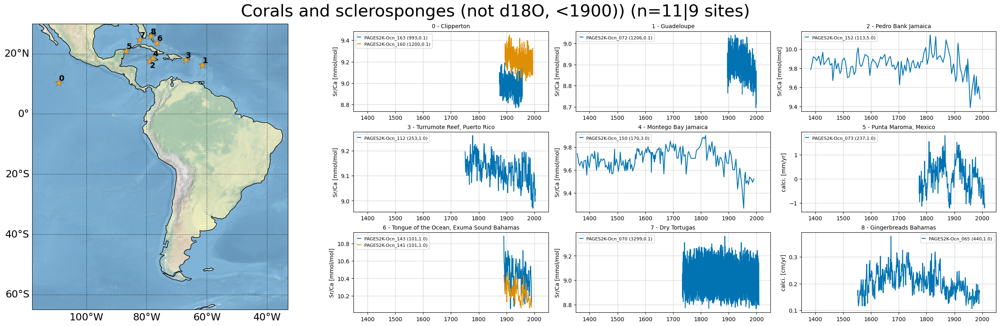

In [30]:
plot_map_ts(data=pages_iso[pages_iso['minYear']<=1900][pages_iso['maxYear']>=1000][(pages_iso['archiveType']=='coral') | (pages_iso['archiveType']=='sclerosponge')][pages_iso['paleoData_variableName']!='d18O'],
    title='Corals and sclerosponges (not d18O, <1900))',
    figsize=(25,8),
    gridspec=(3,3),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    #time_0=[400,2100], #limits
            time_0=[1350,2050], #limits
    #ticks=[500,1000,1500,2000], #limits
            ticks=[1400,1500,1600,1700,1800,1900,2000], #limits
       )

In [40]:
pages_iso[pages_iso['minYear']<=1800][pages_iso['maxYear']>=1000][(pages_iso['archiveType']=='coral') | (pages_iso['archiveType']=='sclerosponge')][pages_iso['paleoData_variableName']!='d18O']

/tmp/ipykernel_2486/558080535.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pages_iso[pages_iso['minYear']<=1800][pages_iso['maxYear']>=1000][(pages_iso['archiveType']=='coral') | (pages_iso['archiveType']=='sclerosponge')][pages_iso['paleoData_variableName']!='d18O']


,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,year,minYear,maxYear,paleoData_variableName,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,
PAGES2K-Ocn_152,sclerosponge,Pedro Bank Jamaica,10.1029/2002PA000830,17.5333,-78.95,"[1992.0, 1987.0, 1982.0, 1979.0, 1977.0, 1974....",1384,1992,Sr_Ca,"[9.479, 9.611, 9.534, 9.714, nan, 9.517, nan, ...",Sr/Ca,NaN,-12 -11 -10 -9 -8 1 2 3 4 5 6 7,T,sea@surface,NaN,PAGES2K-Ocn_152
PAGES2K-Ocn_112,coral,"Turrumote Reef, Puerto Rico",10.1029/2008PA001598,17.93,-67.0,"[2004.0, 2003.0, 2002.0, 2001.0, 2000.0, 1999....",1751,2004,Sr_Ca,"[9.024, 9.048, 8.997, 9.021, 9.103, 9.091, 9.1...",Sr/Ca,NaN,-12 -11 -10 -9 -8 -7 1 2 3 4 5 6,T,sea@surface,NaN,PAGES2K-Ocn_112
PAGES2K-Ocn_150,sclerosponge,Montego Bay Jamaica,10.1029/2002PA000830,18.4667,-77.95,"[1991.0, 1986.0, 1982.0, 1976.0, 1975.0, 1971....",1356,1991,Sr_Ca,"[9.525, 9.494, 9.52, nan, 9.54, 9.4745, 9.509,...",Sr/Ca,NaN,-12 -11 -10 -9 -8 1 2 3 4 5 6 7,T,sea@surface,NaN,PAGES2K-Ocn_150
PAGES2K-Ocn_073,coral,"Punta Maroma, Mexico",10.1002/2013PA00252,20.83,-86.74,"[2009.0, 2008.0, 2007.0, 2006.0, 2005.0, 2004....",1773,2009,calcification,"[-1.04186384621649, -1.21565204778387, -0.9503...",calcification,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,sea@surface,NaN,PAGES2K-Ocn_073
PAGES2K-Ocn_070,coral,Dry Tortugas,10.1002/2013PA002524,24.6,-82.3,"[2008.625, 2008.54166666667, 2008.45833333333,...",1733.791667,2008.625,Sr_Ca,"[8.7956423285, 8.83055918875, 8.88449857625, 8...",Sr/Ca,NaN,N/A (subannually resolved),T,sea@surface,NaN,PAGES2K-Ocn_070
PAGES2K-Ocn_065,coral,Gingerbreads Bahamas,10.1038/ngeo552,25.84,-78.62,"[1991.0, 1990.0, 1989.0, 1988.0, 1987.0, 1986....",1552,1991,calcification,"[0.166, 0.173, 0.176, 0.125, 0.167, 0.176, 0.1...",calcification,NaN,-12 -11 -10 -9 1 2 3 4 5 6 7 8,T,sea@surface,NaN,PAGES2K-Ocn_065


## Marine sediments

- Most are precalibrated to temperature (I will have to think about an SNR for the longer time scales)
- they have a very low resolution, and often they are not recent because of unclear effects in recent layering (in contrast to other type of proxy records, see below for the temp12k records, where this is very clear)

**PSM:**
- proxy records usually interpreted as surface temperature (seasonality not important?)
- See Tierney LGM Paper for calibration of the non-surf temp records

Stack created out of Gulf of Mexico record: https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2009GL040445 (stack not published). Paper also interesting for comparison to other proxy records from that region (including corals)


**Idea: Screen Temp 12k database for more marine sediments (there should be more next to Peru and Brazil iirc)

/tmp/ipykernel_1397885/3881858613.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plot_map_ts(data=pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']=='temperature'],


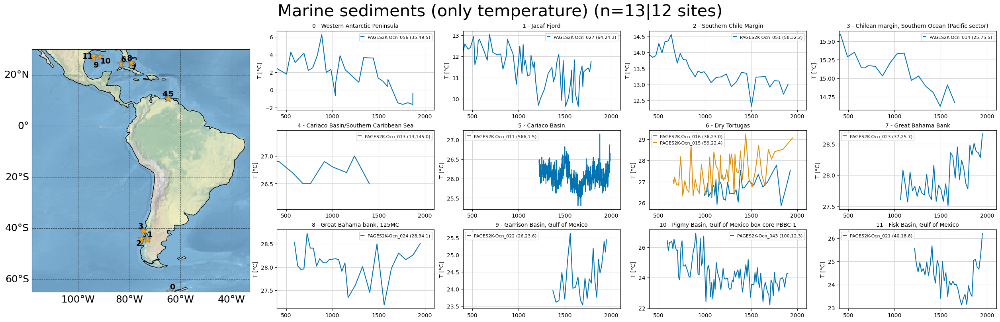

In [33]:
plot_map_ts(data=pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']=='temperature'],
    title='Marine sediments (only temperature)',
    figsize=(25,8),
    gridspec=(3,4),
    width_ratios=(1,3),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
       )

In [267]:
pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']=='temperature']

/tmp/ipykernel_8433/2886468718.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']=='temperature']


,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,geo_meanElev,year,yearUnits,minYear,maxYear,paleoData_hasResolution_hasMedianValue,paleoData_variableName,paleoData_units,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,,,,,
PAGES2K-Ocn_056,marine sediment,Western Antarctic Peninsula,10.1038/nature09751,-64.87,-64.2,-1011.0,"[1870.0, 1870.0, 1816.0, 1761.0, 1707.0, 1600....",AD,-78.18,1870.45,-49.5,temperature,degC,"[-0.42, -1.66, -1.46, -1.65, -1.47, 0.35, 1.18...",TEX86,NaN,9 10 11,T,sea@surface,NaN,PAGES2K-Ocn_056
PAGES2K-Ocn_027,marine sediment,Jacaf Fjord,10.1016/j.yqres.2009.06.010,-44.33,-72.97,-510.0,"[1784.11, 1767.82, 1759.68, 1751.53, 1702.67, ...",AD,211.87,1873.68,-24.27,temperature,degC,"[11.76, 11.27, 11.39, 11.46, 11.27, 10.57, 11....",alkenone,NaN,9 10 11,T,sea@surface,NaN,PAGES2K-Ocn_027
PAGES2K-Ocn_051,marine sediment,Southern Chile Margin,10.1016/j.quascirev.2006.12.008,-44.15,-75.16,-1169.0,"[1900.5, 1851.1, 1801.6, 1752.1, 1702.6, 1653....",AD,-167.5,1988.46,-32.2,temperature,degC,"[13.01, 12.7, 13.11, 13.12, 12.92, 13.25, 13.2...",alkenone,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_051
PAGES2K-Ocn_014,marine sediment,"Chilean margin, Southern Ocean (Pacific sector)",10.1029/2001PA000727,-41.0,-74.45,-852.0,"[1650.0, 1572.0, 1494.0, 1416.0, 1338.0, 1260....",AD,-5721.25,1929.473684,-75.5,temperature,degC,"[14.67, 14.91, 14.62, 14.81, 14.89, 15.03, 14....",alkenone,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_014
PAGES2K-Ocn_013,marine sediment,Cariaco Basin/Southern Caribbean Sea,10.1126/science.1088470,10.7,-64.94,-790.0,"[1399.0, 1239.0, 1153.0, 1005.0, 913.0, 763.0,...",AD,-158,1645,-145.0,temperature,degC,"[26.5, 27.0, 26.7, 26.8, 26.9, 26.5, 26.5, 26....",foram Mg/Ca,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,sea@surface,NaN,PAGES2K-Ocn_013
PAGES2K-Ocn_011,marine sediment,Cariaco Basin,10.1029/2007pa001427,10.77,-64.77,-450.0,"[1990.0, 1989.0, 1987.209, 1986.54233, 1985.87...",AD,1221.041513,1990,-1.479699,temperature,degC,"[26.4854731244649, 26.448379862496, 26.6554955...",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_011
PAGES2K-Ocn_016,marine sediment,Dry Tortugas,10.1029/2005PA001218,24.33,-83.26,-547.0,"[1925.2, 1875.6, 1826.0, 1776.0, 1727.0, 1677....",AD,995,1925.2,-23.0,temperature,degC,"[27.54, 26.67, 25.87, 27.78, 27.39, 26.98, 26....",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_016
PAGES2K-Ocn_023,marine sediment,Great Bahama Bank,10.1029/2005PA001218,24.58,-79.26,-531.0,"[1950.0, 1927.48, 1904.96, 1882.44, 1859.92, 1...",AD,1065,1950,-25.68,temperature,degC,"[28.66, 28.28, 28.36, 28.38, 28.51, 28.32, 28....",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_023
PAGES2K-Ocn_015,marine sediment,Dry Tortugas,10.1029/2005PA001218,24.59,-83.58,-530.0,"[1949.0, 1844.19, 1756.84, 1721.91, 1686.97, 1...",AD,658.84,1949,-22.42,temperature,degC,"[29.06, 28.52, 28.42, 28.06, 28.53, 26.8, 27.3...",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_015


,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,year,minYear,maxYear,paleoData_variableName,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,
PAGES2K-Ocn_011,marine sediment,Cariaco Basin,10.1029/2007pa001427,10.77,-64.77,"[1990.0, 1989.0, 1987.209, 1986.54233, 1985.87...",1221.041513,1990,temperature,"[26.4854731244649, 26.448379862496, 26.6554955...",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_011


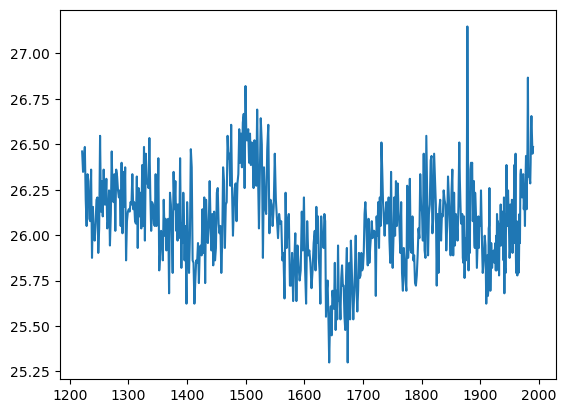

In [36]:
idx='PAGES2K-Ocn_011'
years=np.array(pages_iso[pages_iso['ID']==idx]['year'][0])
display(pages_iso[pages_iso['ID']==idx])
plt.plot(years,pages_iso[pages_iso['ID']==idx]['paleoData_values'][0])

13.205050505050506


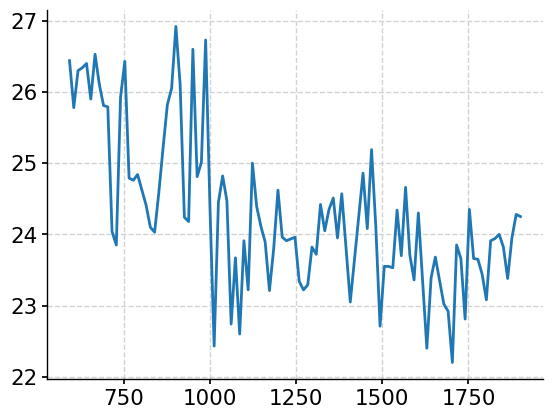

In [284]:
idx='PAGES2K-Ocn_043'
years=np.array(pages_iso[pages_iso['ID']==idx]['year'][0])
print(np.mean(np.abs(years[:-1]-years[1:])))
plt.plot(years,pages_iso[pages_iso['ID']==idx]['paleoData_values'][0])

In [266]:
pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']=='temperature']

/tmp/ipykernel_8433/2886468718.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']=='temperature']


,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,geo_meanElev,year,yearUnits,minYear,maxYear,paleoData_hasResolution_hasMedianValue,paleoData_variableName,paleoData_units,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,,,,,
PAGES2K-Ocn_056,marine sediment,Western Antarctic Peninsula,10.1038/nature09751,-64.87,-64.2,-1011.0,"[1870.0, 1870.0, 1816.0, 1761.0, 1707.0, 1600....",AD,-78.18,1870.45,-49.5,temperature,degC,"[-0.42, -1.66, -1.46, -1.65, -1.47, 0.35, 1.18...",TEX86,NaN,9 10 11,T,sea@surface,NaN,PAGES2K-Ocn_056
PAGES2K-Ocn_027,marine sediment,Jacaf Fjord,10.1016/j.yqres.2009.06.010,-44.33,-72.97,-510.0,"[1784.11, 1767.82, 1759.68, 1751.53, 1702.67, ...",AD,211.87,1873.68,-24.27,temperature,degC,"[11.76, 11.27, 11.39, 11.46, 11.27, 10.57, 11....",alkenone,NaN,9 10 11,T,sea@surface,NaN,PAGES2K-Ocn_027
PAGES2K-Ocn_051,marine sediment,Southern Chile Margin,10.1016/j.quascirev.2006.12.008,-44.15,-75.16,-1169.0,"[1900.5, 1851.1, 1801.6, 1752.1, 1702.6, 1653....",AD,-167.5,1988.46,-32.2,temperature,degC,"[13.01, 12.7, 13.11, 13.12, 12.92, 13.25, 13.2...",alkenone,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_051
PAGES2K-Ocn_014,marine sediment,"Chilean margin, Southern Ocean (Pacific sector)",10.1029/2001PA000727,-41.0,-74.45,-852.0,"[1650.0, 1572.0, 1494.0, 1416.0, 1338.0, 1260....",AD,-5721.25,1929.473684,-75.5,temperature,degC,"[14.67, 14.91, 14.62, 14.81, 14.89, 15.03, 14....",alkenone,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_014
PAGES2K-Ocn_013,marine sediment,Cariaco Basin/Southern Caribbean Sea,10.1126/science.1088470,10.7,-64.94,-790.0,"[1399.0, 1239.0, 1153.0, 1005.0, 913.0, 763.0,...",AD,-158,1645,-145.0,temperature,degC,"[26.5, 27.0, 26.7, 26.8, 26.9, 26.5, 26.5, 26....",foram Mg/Ca,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,sea@surface,NaN,PAGES2K-Ocn_013
PAGES2K-Ocn_011,marine sediment,Cariaco Basin,10.1029/2007pa001427,10.77,-64.77,-450.0,"[1990.0, 1989.0, 1987.209, 1986.54233, 1985.87...",AD,1221.041513,1990,-1.479699,temperature,degC,"[26.4854731244649, 26.448379862496, 26.6554955...",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_011
PAGES2K-Ocn_016,marine sediment,Dry Tortugas,10.1029/2005PA001218,24.33,-83.26,-547.0,"[1925.2, 1875.6, 1826.0, 1776.0, 1727.0, 1677....",AD,995,1925.2,-23.0,temperature,degC,"[27.54, 26.67, 25.87, 27.78, 27.39, 26.98, 26....",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_016
PAGES2K-Ocn_023,marine sediment,Great Bahama Bank,10.1029/2005PA001218,24.58,-79.26,-531.0,"[1950.0, 1927.48, 1904.96, 1882.44, 1859.92, 1...",AD,1065,1950,-25.68,temperature,degC,"[28.66, 28.28, 28.36, 28.38, 28.51, 28.32, 28....",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_023
PAGES2K-Ocn_015,marine sediment,Dry Tortugas,10.1029/2005PA001218,24.59,-83.58,-530.0,"[1949.0, 1844.19, 1756.84, 1721.91, 1686.97, 1...",AD,658.84,1949,-22.42,temperature,degC,"[29.06, 28.52, 28.42, 28.06, 28.53, 26.8, 27.3...",foram Mg/Ca,NaN,NaN,NaN,NaN,NaN,PAGES2K-Ocn_015


In [43]:
idx='PAGES2K-Ocn_011'
cariaco=pages_iso[pages_iso['ID']==idx]

cariaco['variable_name']=['tsurf']
cariaco['PSM']=['season'] #None equalt to simply take annual
cariaco['seasonality']=['3,4,5']

cariaco['noise_snr']=['assumed']
cariaco['regression_params_a']=['None']
cariaco['regression_params_b']=['None']
cariaco['regression_params_var']=['None']

cariaco=table_to_xarray(cariaco)
if np.min(cariaco['geo_meanLon']<0):
    cariaco['geo_meanLon']=cariaco['geo_meanLon']%360
#cariaco.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/marine.nc')


data=cariaco
data=data[0,:].to_dataframe('meta')
data=data.drop('time',axis=1)
data['Location (Lat,Lon)']=np.round(data['geo_meanLat'].astype(float),1).astype(str)+','+np.round(data['geo_meanLon'].astype(float),1).astype(str)

one = np.max(np.vstack([data['minYear'].values.astype(int), np.zeros(len(data['minYear']))]), axis=0).astype(int).astype('<U32').tolist()
two = data['maxYear'].values.astype(int).astype('<U32').tolist()

# Concatenate the lists with a hyphen
data['Time']= [f"{a}-{b}" for a, b in zip(one,two)]
data=data.rename(columns={'seasonality':'Seasonality','paleoData_variableName':'Proxy variable','geo_siteName':'Site name','noise_snr':'SNR'})

vals=[]
for i in range(data.shape[0]):
    time=cariaco.isel(site=i).dropna('time').time.dt.year.values
    vals.append(str(np.median(np.abs(time[1:]-time[:-1])).astype(int))+' (1)')
data['Med. resolution (time scale)']=vals
    
data2=data[['Site name','Location (Lat,Lon)','Time','Med. resolution (time scale)','Proxy variable','PSM','Seasonality','SNR']]
data2


/tmp/ipykernel_25696/756284524.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cariaco['variable_name']=['tsurf']
/tmp/ipykernel_25696/756284524.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cariaco['PSM']=['season'] #None equalt to simply take annual
/tmp/ipykernel_25696/756284524.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

,Site name,"Location (Lat,Lon)",Time,Med. resolution (time scale),Proxy variable,PSM,Seasonality,SNR
site,,,,,,,,
0,Cariaco Basin,"10.8,295.2",1221-1990,1 (5),temperature,season,"3,4,5",assumed


In [ ]:
cariaco

### Record selection:

- Cariaco basein for sure.
- Fisk Basin, Gulf of Mexico (which one?)
-  Bahamas, dry tortugas, which one?
- Chilean margin records are not close enough

## Non temperature calibrate record

- PSM-Idea: There are the Tierney Bayesian PSMs (I have never really looked into them), however it is not sure to what extend it is worth using them due to the coarse resolution (and the small number of recrods for the second half of the last millennium)

/tmp/ipykernel_1397885/323326454.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plot_map_ts(data=pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']!='temperature'],


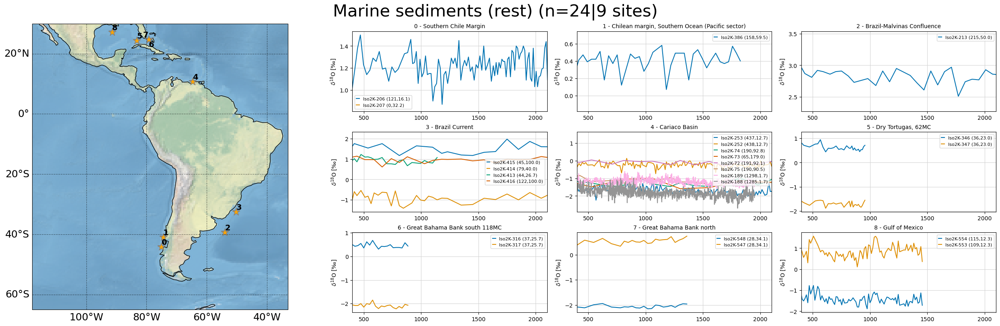

In [35]:
plot_map_ts(data=pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']!='temperature'],
    title='Marine sediments (rest)',
    figsize=(25,8),
    gridspec=(3,3),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
       )

In [36]:
pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']!='temperature']

/tmp/ipykernel_1397885/477484402.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pages_iso[pages_iso['archiveType']=='marine sediment'][pages_iso['paleoData_variableName']!='temperature']


,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,geo_meanElev,year,yearUnits,minYear,maxYear,paleoData_hasResolution_hasMedianValue,paleoData_variableName,paleoData_units,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,,,,,
Iso2K-206,marine sediment,Southern Chile Margin,10.1016/j.quascirev.2006.12.008,-44.15,-75.16,-1169.0,"[-38.46, -19.23, 0.0, 24.74, 49.47, 74.21, 98....",AD,-38.46,2116.5,16.09,d18O,permil,"[0.9, 1.08, 0.84, 0.84, 0.89, 1.12, 1.27, 1.04...",NaN,"[{'basis': 'NaN', 'interpDirection': 'decrease...",annual mean,temperature/d18Osw,NaN,"[NaN, NaN]",Iso2K-206
Iso2K-207,marine sediment,Southern Chile Margin,10.1016/j.quascirev.2006.12.008,-44.15,-75.16,-1169.0,"[1900.5, 1851.1, 1801.6, 1752.1, 1702.6, 1653....",AD,-38.46,2116.5,32.2,d18O,permil,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,[{'basis': 'To estimate the paleosalinity (S; ...,annual mean,S,To estimate the paleosalinity (S; psu) from th...,"[NaN, NaN]",Iso2K-207
Iso2K-386,marine sediment,"Chilean margin, Southern Ocean (Pacific sector)",10.1029/2001PA000727,-41.0,-74.45,-852.0,"[1826.8421, 1792.6316, 1758.42105, 1724.2105, ...",AD,-5732.75,1826.8421,-59.5122,d18O,permil,"[0.4, 0.49, 0.57, 0.39, 0.37, 0.39, 0.49, 0.41...",NaN,"[{'basis': 'NaN', 'interpDirection': 'decrease...",annual mean,temperature/d18Osw,NaN,"[NaN, NaN]",Iso2K-386
Iso2K-213,marine sediment,Brazil-Malvinas Confluence,10.1002/2014PA002677,-39.3017,-53.965,-3620.0,"[270.0, 330.0, 380.0, 430.0, 490.0, 540.0, 590...",AD,270,11329,50.0,d18O,permil,"[2.74, 2.87, 3.03, 2.87, 2.81, 2.92, 2.9, 2.86...",NaN,"[{'basis': 'NaN', 'interpDirection': 'decrease...",annual mean,temperature/d18Osw,NaN,"[NaN, NaN]",Iso2K-213
Iso2K-415,marine sediment,Brazil Current,10.1002/2014PA002677,-32.5052,-50.2427,-657.0,"[-15.0, 0.0, 14.0, 28.0, 42.0, 56.0, 70.0, 110...",AD,-15,13919,100.0,d18O,permil,"[nan, nan, nan, 1.113, nan, nan, nan, 1.4, nan...",NaN,"[{'basis': 'NaN', 'interpDirection': 'positive...",NaN,S,NaN,"[NaN, NaN]",Iso2K-415
Iso2K-414,marine sediment,Brazil Current,10.1002/2014PA002677,-32.5052,-50.2427,-657.0,"[-15.0, 0.0, 14.0, 28.0, 42.0, 56.0, 70.0, 110...",AD,-15,13919,40.0,d18O,permil,"[nan, nan, nan, -1.13, -0.905, -0.563, -0.819,...",NaN,"[{'basis': 'Urey, H. C. 1948. Oxygen isotopes ...",not applicable (always),T_water,"Urey, H. C. 1948. Oxygen isotopes in nature an...","[NaN, NaN]",Iso2K-414
Iso2K-413,marine sediment,Brazil Current,10.1002/2014PA002677,-32.5052,-50.2427,-657.0,"[-15.0, 0.0, 14.0, 28.0, 42.0, 56.0, 70.0, 110...",AD,-15,13919,26.666667,d18O,permil,"[0.881, 0.794, 0.979, 1.105, 1.09, 1.152, 0.94...",NaN,"[{'basis': 'Urey, H. C. 1948. Oxygen isotopes ...",not applicable (always),T_water,"Urey, H. C. 1948. Oxygen isotopes in nature an...","[NaN, NaN]",Iso2K-413
Iso2K-416,marine sediment,Brazil Current,10.1002/2014PA002677,-32.5052,-50.2427,-657.0,"[-15.0, 0.0, 14.0, 28.0, 42.0, 56.0, 70.0, 110...",AD,-15,13919,100.0,d18O,permil,"[nan, 0.83, nan, nan, nan, nan, 0.9, nan, 1.0,...",NaN,"[{'basis': 'NaN', 'interpDirection': 'decrease...",annual mean,temperature/d18Osw,NaN,"[NaN, NaN]",Iso2K-416
Iso2K-253,marine sediment,Cariaco Basin,10.1029/2003GL017959,10.6667,-64.7,-366.0,"[150.44, 165.32, 180.2, 195.08, 209.96, 224.84...",AD,150.44,6156.96,12.66,d18O,permil,"[-1.57, -1.64, -1.66, -1.49, -1.75, -1.62, -1....",NaN,"[{'basis': 'NaN', 'interpDirection': 'decrease...",annual mean,temperature/d18Osw,NaN,"[NaN, NaN]",Iso2K-253


## Wood d18O 

### PSM
- probably okazaki is a good reference, but probably its difficult. See the original papers for how they calibrated/interpreted things
- seasonality important ? No lag effect, annual values?

Representation of local precipitation/temperature/d18O of precipitation? Mixed effect of precipitation d18O and temperature dependent fractionation.
In the tropics this effect should be not that important? (also due to increased relative humidity)

**Perito Moreno (Grießinger et al 2018):**
- summer temperature correlation/precipitation correlation (annual). Did some backtrajectory analysis (westerlies)

**Puerto Maldonado Peru (Ballantyne et al 2011):**
- seems like a comprehensive review paper at the same time

**To-Do: Understand creation of wood-18O**

/tmp/ipykernel_1397885/1190520335.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plot_map_ts(data=pages_iso[pages_iso['archiveType']=='wood'][pages_iso['minYear']<=1900],


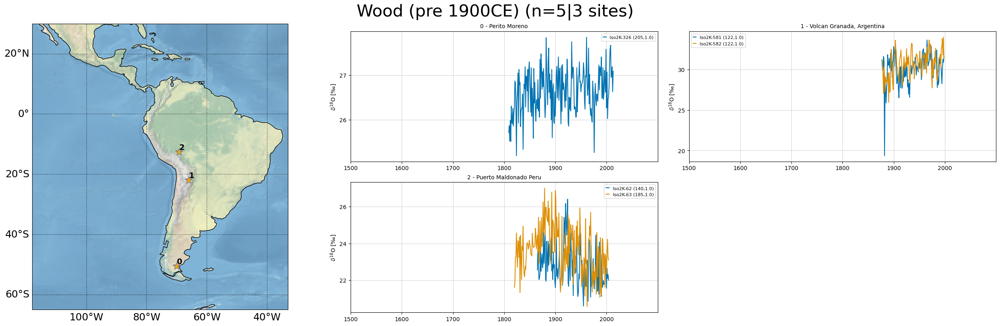

In [37]:
plot_map_ts(data=pages_iso[pages_iso['archiveType']=='wood'][pages_iso['minYear']<=1900],
    title='Wood (pre 1900CE)',
    figsize=(25,8),
    gridspec=(2,2),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[1500,2100], #limits
    ticks=[1500,1600,1700,1800,1900,2000], #limits
       )

In [41]:
pages_iso[pages_iso['archiveType']=='wood'][pages_iso['minYear']<=1810]

/tmp/ipykernel_2486/630692747.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pages_iso[pages_iso['archiveType']=='wood'][pages_iso['minYear']<=1850]


,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,year,minYear,maxYear,paleoData_variableName,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,
Iso2K-326,wood,Perito Moreno,10.3389/feart.2018.00027,-50.5167,-70.1167,"[1809.0, 1810.0, 1811.0, 1812.0, 1813.0, 1814....",1809,2013,d18O,"[25.72, 25.87, 25.52, 25.99, 25.52, 26.31, 25....",cellulose,"[{'variable': 'd18O', 'direction': 'positive',...",Austral summer (Oct-Jan),d18O,NaN,"[NaN, NaN]",Iso2K-326
Iso2K-62,wood,Puerto Maldonado Peru,10.1175/2010EI277.1,-12.6,-69.2,"[1820.0, 1821.0, 1822.0, 1823.0, 1824.0, 1825....",1820,2004,d18O,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,[{'basis': 'A multi-proxy record spanning 180 ...,Jan,P_amount,A multi-proxy record spanning 180 years from C...,"[NaN, NaN]",Iso2K-62
Iso2K-63,wood,Puerto Maldonado Peru,10.1175/2010EI277.1,-12.6,-69.2,"[1820.0, 1821.0, 1822.0, 1823.0, 1824.0, 1825....",1820,2004,d18O,"[21.62, 21.86, 23.25, 23.26, 24.57, 23.54, 22....",NaN,[{'basis': 'A multi-proxy record spanning 180 ...,Jan,Precipitation amount,A multi-proxy record spanning 180 years from C...,"[NaN, NaN]",Iso2K-63


# Ice core
Illimani also an option
James Ross island only in deuterium (Mulvaney et al 2012 also uses a simple conversion formula)

/tmp/ipykernel_1397885/2651661591.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plot_map_ts(data=pages_iso[pages_iso['archiveType']=='glacier ice'][pages_iso['minYear']<=1900],


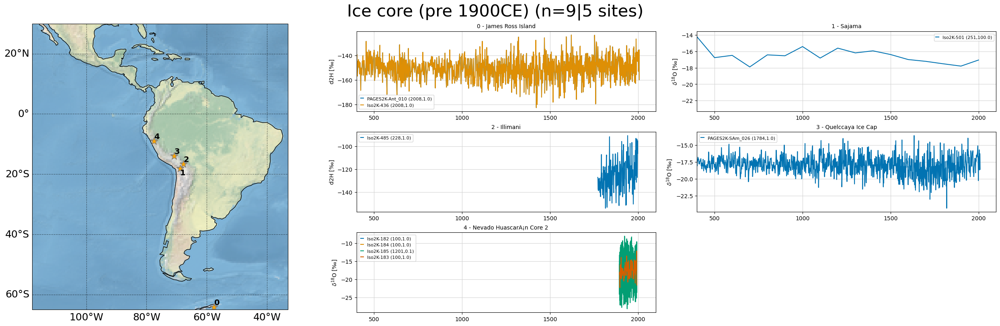

In [40]:
plot_map_ts(data=pages_iso[pages_iso['archiveType']=='glacier ice'][pages_iso['minYear']<=1900],
    title='Ice core (pre 1900CE)',
    figsize=(25,8),
    gridspec=(3,2),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
       )

In [41]:
pages_iso[pages_iso['archiveType']=='glacier ice'][pages_iso['minYear']<=1900]

/tmp/ipykernel_1397885/1459210383.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pages_iso[pages_iso['archiveType']=='glacier ice'][pages_iso['minYear']<=1900]


,archiveType,geo_siteName,pub1_doi,geo_meanLat,geo_meanLon,geo_meanElev,year,yearUnits,minYear,maxYear,paleoData_hasResolution_hasMedianValue,paleoData_variableName,paleoData_units,paleoData_values,paleoData_proxy,paleoData_interpretation,paleoData_climateInterpretation_seasonality,paleoData_climateInterpretation_variable,paleoData_climateInterpretation_variableDetail,paleoData_climateInterpretation_integrationTime,ID
ID,,,,,,,,,,,,,,,,,,,,,
PAGES2K-Ant_010,glacier ice,James Ross Island,10.1038/ngeo1787,-64.2017,-57.685,1542.0,"[2007.0, 2006.0, 2005.0, 2004.0, 2003.0, 2002....",AD,0,2007,-1.0,dD,permil,"[-159.865625, -135.4879, -147.5209, -144.8555,...",dD,NaN,1 2 3 4 5 6 7 8 9 10 11 12,T,air@condensationLevel,NaN,PAGES2K-Ant_010
Iso2K-436,glacier ice,James Ross Island,"10.1038/nature11391, 10.1038/ngeo1787",-64.2,-57.69,1542.0,"[2007.0, 2006.0, 2005.0, 2004.0, 2003.0, 2002....",AD,0,2007,-1.0,d2H,permil,"[-159.865625, -135.487857142857, -147.52089285...",NaN,[{'basis': 'correlation to meteorological data...,annual,T,"correlation to meteorological data, ERA-Interi...","[NaN, NaN]",Iso2K-436
Iso2K-501,glacier ice,Sajama,10.1126/science.282.5395.1858,-18.1,-68.9,6542.0,"[2000.0, 1900.0, 1800.0, 1700.0, 1600.0, 1500....",AD,-23101,2000,-100.0,d18O,permil,"[-17.06, -17.8, -17.52, -17.22, -17.0, -16.39,...",NaN,"[{'interpDirection': 'positive', 'scope': 'cli...",annual,T,NaN,"[NaN, NaN]",Iso2K-501
Iso2K-485,glacier ice,Illimani,10.1029/2002GL014870,-16.62,-67.77,6350.0,"[1998.0, 1997.0, 1996.0, 1995.0, 1994.0, 1993....",AD,1771,1998,-1.0,d2H,permil,"[-106.1, -95.0, -124.2, -127.1, -93.7, -117.7,...",NaN,"[{'interpDirection': 'NaN', 'scope': 'climate'...",annual,source region,Comparison with general circulation model resu...,"[NaN, NaN]",Iso2K-485
PAGES2K-SAm_026,glacier ice,Quelccaya Ice Cap,10.1126/science.1234210,-13.9333,-70.8333,5670.0,"[2009.0, 2008.0, 2007.0, 2006.0, 2005.0, 2004....",AD,226,2009,-1.0,d18O,permil,"[-18.5905, -16.3244, -16.2324, -17.0112, -18.6...",d18O,NaN,winter,T,air@condensationLevel,NaN,PAGES2K-SAm_026
Iso2K-182,glacier ice,Nevado HuascarA¡n Core 2,10.1126/science.269.5220.46,-9.0,-77.5,6048.0,"[1993.0, 1992.0, 1991.0, 1990.0, 1989.0, 1988....",AD,1894,1993,-1.0,d18O,permil,"[-17.83, -12.81, -16.82, -14.63, -18.07, -16.4...",NaN,"[{'interpDirection': 'positive', 'scope': 'cli...",thermal year (Aug-Jul) (but 80% of precipitati...,T,Simple d18O-temperature relations used in pola...,"[NaN, NaN]",Iso2K-182
Iso2K-184,glacier ice,Nevado HuascarA¡n Core 2,10.1126/science.269.5220.46,-9.0,-77.5,6048.0,"[1993.0, 1992.0, 1991.0, 1990.0, 1989.0, 1988....",AD,1894,1993,-1.0,d18O,permil,"[-14.91, -14.42, -17.35, -14.79, -18.97, -15.2...",NaN,"[{'interpDirection': 'positive', 'scope': 'cli...",thermal year (Aug-Jul) (but 80% of precipitati...,T,Simple d18O-temperature relations used in pola...,"[NaN, NaN]",Iso2K-184
Iso2K-185,glacier ice,Nevado HuascarA¡n Core 2,10.1126/science.269.5220.46,-9.0,-77.5,6048.0,"[1993.5, 1993.417, 1993.333, 1993.25, 1993.167...",AD,1894,1993,-0.083,d18O,permil,"[-21.0, -23.63, -22.29, -20.69, -22.47, -21.95...",NaN,"[{'interpDirection': 'positive', 'scope': 'cli...",annual,T,Simple d18O-temperature relations used in pola...,"[NaN, NaN]",Iso2K-185
Iso2K-183,glacier ice,Nevado HuascarA¡n Core 2,10.1126/science.269.5220.46,-9.0,-77.5,6048.0,"[1993.0, 1992.0, 1991.0, 1990.0, 1989.0, 1988....",AD,1894,1993,-1.0,d18O,permil,"[-21.58, -12.18, -16.77, -14.94, -17.58, -16.6...",NaN,"[{'interpDirection': 'positive', 'scope': 'cli...",annual calendar year (but 80% of precipitation...,T,Simple d18O-temperature relations used in pola...,"[NaN, NaN]",Iso2K-183


In [14]:
deuterium=pages_iso[pages_iso['ID'].isin(['PAGES2K-Ant_010','Iso2K-485'])]
deuterium['paleoData_values']=deuterium['paleoData_values'].apply(lambda x: np.array(x))
deuterium['paleoData_values']=deuterium['paleoData_values'].apply(lambda x: x/8)   ##NOTE THAT  I have simply converted the value by dividing by 8! (GMWL is a fair assumption)
quel=pages_iso[pages_iso['ID'].isin(['PAGES2K-SAm_026'])]

glacier_ice=pd.concat([deuterium,quel])
glacier_ice['paleoData_variableName']=glacier_ice['paleoData_variableName'].replace({'d2H':'d18O','dD':'d18O'})

psms=['inf_weighted','inf_weighted','inf_weighted'] #None equalt to simply take annual
season=['None','None','None'] #this is also kind of the question
#var='paleoData_variable_name'
noise_snr=len(glacier_ice)*['assumed']

glacier_ice['variable_name']=['d18O']*3
glacier_ice['PSM']=psms #None equalt to simply take annual
glacier_ice['seasonality']=season

glacier_ice['noise_snr']=['assumed']*len(glacier_ice)
glacier_ice['regression_params_a']=['None']*len(glacier_ice)
glacier_ice['regression_params_b']=['None']*len(glacier_ice)
glacier_ice['regression_params_var']=['None']*len(glacier_ice)

glacier_ice=table_to_xarray(glacier_ice)
if np.min(glacier_ice['geo_meanLon'])<0:
    glacier_ice['geo_meanLon'] = glacier_ice['geo_meanLon'] % 360


glacier_ice.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc')


/tmp/ipykernel_89874/2675453233.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deuterium['paleoData_values']=deuterium['paleoData_values'].apply(lambda x: np.array(x))
/tmp/ipykernel_89874/2675453233.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deuterium['paleoData_values']=deuterium['paleoData_values'].apply(lambda x: x/8)   ##NOTE THAT  I have simply converted the value by dividing by 8! (GMWL is a fair assumption)


In [15]:
data0=glacier_ice.sortby('geo_meanLat',ascending=False)
data=data0[0,:].to_dataframe('meta')
data=data.drop('time',axis=1)
data['Location (Lat,Lon)']=np.round(data['geo_meanLat'].astype(float),1).astype(str)+','+np.round(data['geo_meanLon'].astype(float),1).astype(str)

one = np.max(np.vstack([data['minYear'].values.astype(int), np.zeros(len(data['minYear']))]), axis=0).astype(int).astype('<U32').tolist()
two = data['maxYear'].values.astype(int).astype('<U32').tolist()

# Concatenate the lists with a hyphen
data['Time']= [f"{a}-{b}" for a, b in zip(one,two)]
data=data.rename(columns={'seasonality':'Seasonality','paleoData_variableName':'Proxy variable','geo_siteName':'Site name','noise_snr':'SNR'})

vals=[]
for i in range(data.shape[0]):
    time=data0.isel(site=i).dropna('time').time.dt.year.values
    vals.append(str(np.median(np.abs(time[1:]-time[:-1])).astype(int))+' (1)')
data['Med. resolution (time scale)']=vals
    
data2=data[['Site name','Location (Lat,Lon)','Time','Med. resolution (time scale)','Proxy variable','PSM','Seasonality','SNR']]
data2


,Site name,"Location (Lat,Lon)",Time,Med. resolution (time scale),Proxy variable,PSM,Seasonality,SNR
site,,,,,,,,
0,Quelccaya Ice Cap,"-13.9,289.2",226-2009,1 (1),d18O,inf_weighted,None,assumed
1,Illimani,"-16.6,292.2",1771-1998,1 (1),d18O,inf_weighted,None,assumed
2,James Ross Island,"-64.2,302.3",0-2007,1 (1),d18O,inf_weighted,None,assumed


In [17]:
glacier_ice

<xarray.DataArray (time: 2000, site: 3)>
array([[-18.88125 ,        nan,        nan],
       [-18.4     ,        nan,        nan],
       [-17.86875 ,        nan,        nan],
       ...,
       [-17.805975, -13.2625  , -17.8063  ],
       [-17.17985 ,        nan, -20.2535  ],
       [-17.803275,        nan, -17.0399  ]])
Coordinates: (12/16)
  * time                    (time) object 0001-01-01 00:00:00 ... 2000-01-01 ...
    archiveType             (site) object 'glacier ice' ... 'glacier ice'
    geo_siteName            (site) object 'James Ross Island' ... 'Quelccaya ...
    pub1_doi                (site) object '10.1038/ngeo1787' ... '10.1126/sci...
    geo_meanLat             (site) object -64.2017 -16.62 -13.9333
    geo_meanLon             (site) object 302.315 292.23 289.1667
    ...                      ...
    PSM                     (site) object 'inf_weighted' ... 'inf_weighted'
    seasonality             (site) object 'None' 'None' 'None'
    noise_snr               (site) object 'assumed' 'assumed' 'assumed'
    regression_params_a     (site) object 'None' 'None' 'None'
    regression_params_b     (site) object 'None' 'None' 'None'
    regression_params_var   (site) object 'None' 'None' 'None'
Dimensions without coordinates: site

In [391]:
import pandas as pd
pd.options.mode.chained_assignment = None

## Tree rings (Pages2k and Breitenmoser dataset)

Resolution: Always annual, some times longer gaps

### PSM
- temperature and PDSI calibration (how to compute the latter? -> Ask Nathan if unclear)
- compare the LMRv2 and PHYDA approach. 
**LMRv2:**

**PHYDA:**


- How to deal with missing growth seasonality info? According to LMRv2, there is metadata for that, which is not part of Nathans data.

**Plots**: Plot old tree rings and newer ones separately, adjust plotting script to make things clearer

**Calibration**: Compare to this file https://www.atmos.uw.edu/~hakim/LMR/proxy_dashboards/dashboards_Tree_Rings.pdf (does not include the pdsi calibration?)

pdsi dataset: https://psl.noaa.gov/data/gridded/data.pdsi.html
https://climate-indices.readthedocs.io/en/latest/,  see here concretely what the the code does (https://github.com/monocongo/climate_indices/blob/master/src/climate_indices/palmer.py)

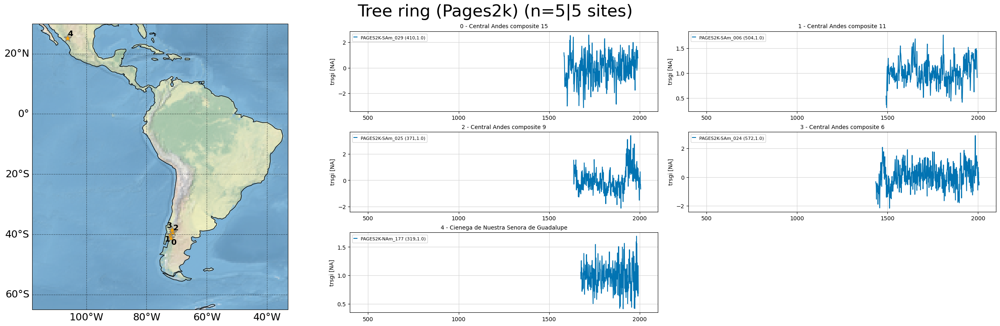

In [43]:
plot_map_ts(data=pages_iso[pages_iso['archiveType']=='tree'],
    title='Tree ring (Pages2k)',
    figsize=(25,8),
    gridspec=(3,2),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
       )

Text(0.5, 1.0, 'Histogram of "minYear" for tree rings from Breitenmoser dataset')

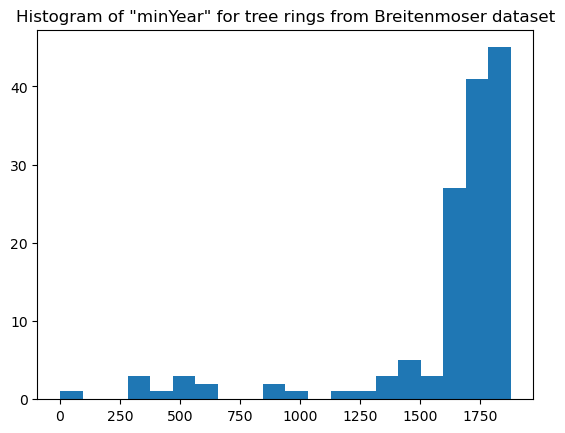

In [57]:
plt.hist(trees_breit['minYear'],bins=20)
plt.title('Histogram of "minYear" for tree rings from Breitenmoser dataset')

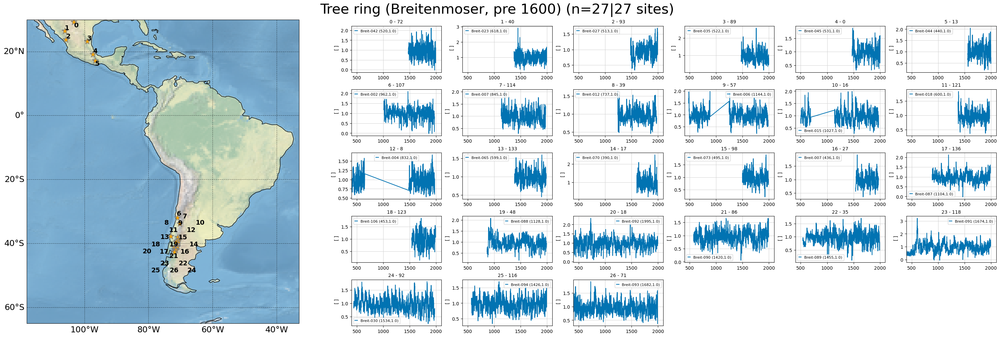

In [46]:
plot_map_ts(data=trees_breit[trees_breit['minYear']<=1600].sort_values('geo_meanLat',ascending=False),
    title='Tree ring (Breitenmoser, pre 1600)',
    figsize=(30,10),
    gridspec=(5,6),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
    #annotate=False
    annotate=True
       )

Text(0.5, 1.0, 'Histogram of "minYear" for tree rings from Breitenmoser dataset')

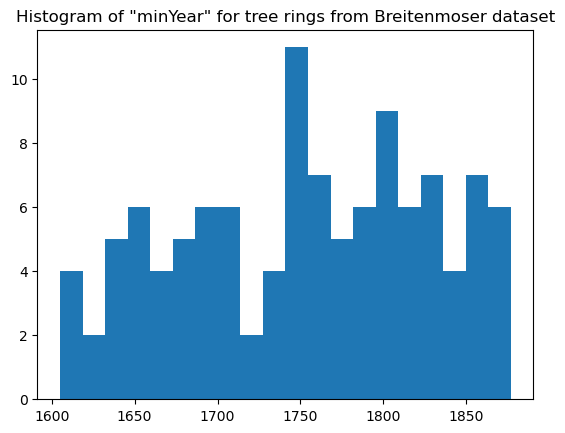

In [47]:
plt.hist(trees_breit['minYear'][trees_breit['minYear']>1600],bins=20)
plt.title('Histogram of "minYear" for tree rings from Breitenmoser dataset')

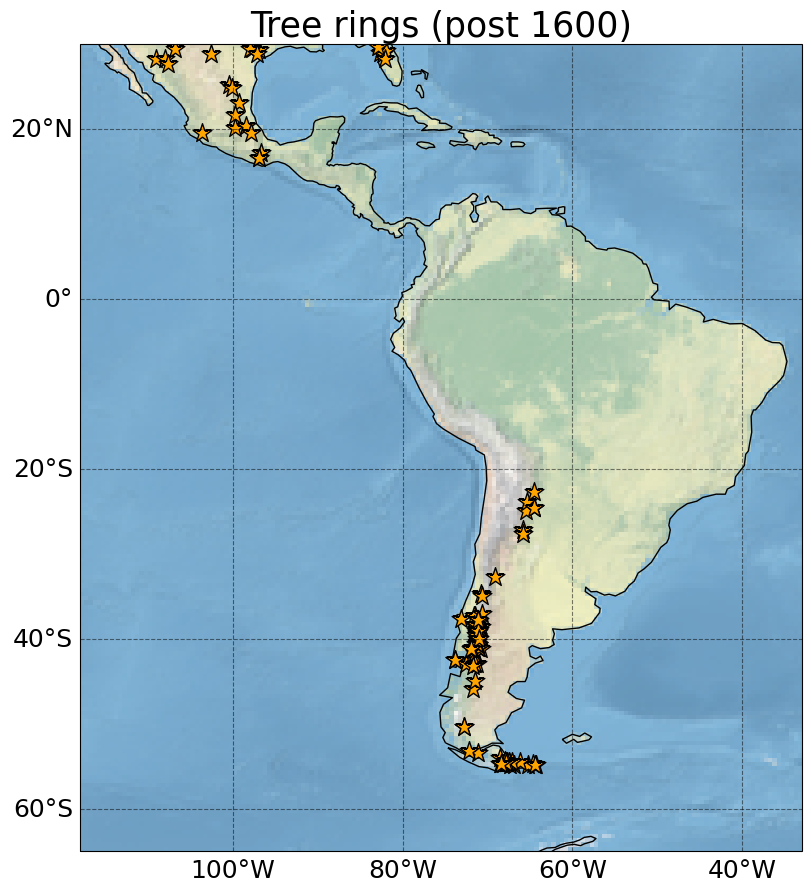

In [48]:
plot_map(trees_breit[trees_breit['minYear']>1600],annotate=False,edgecolors='black', title='Tree rings (post 1600)')

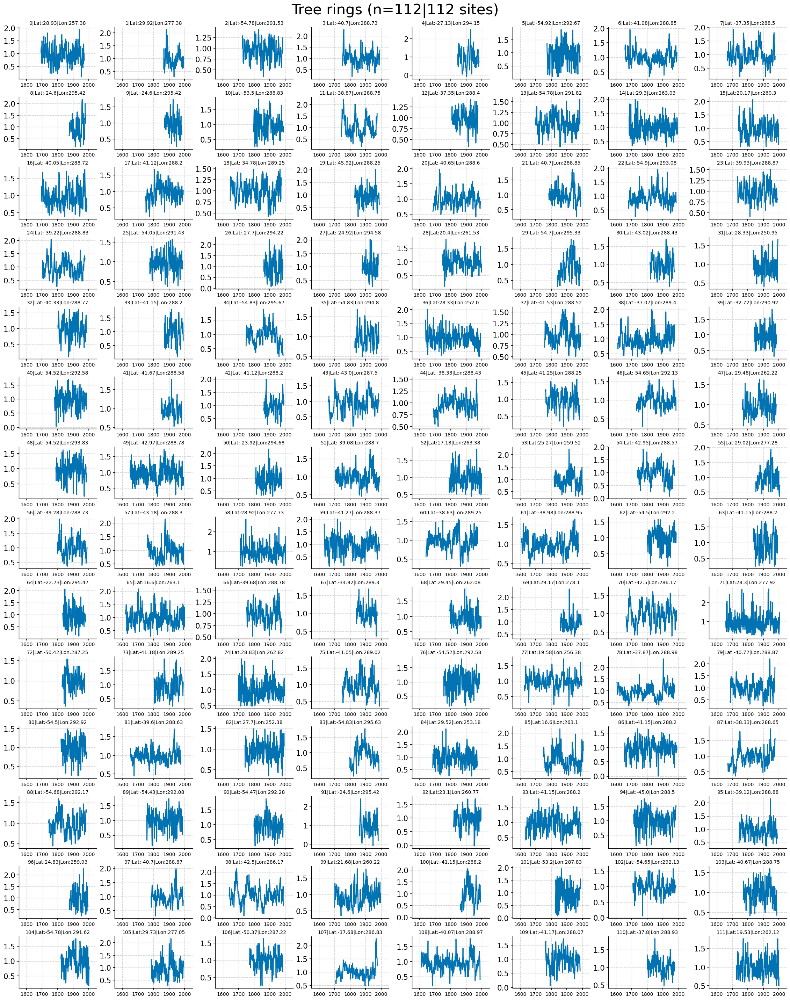

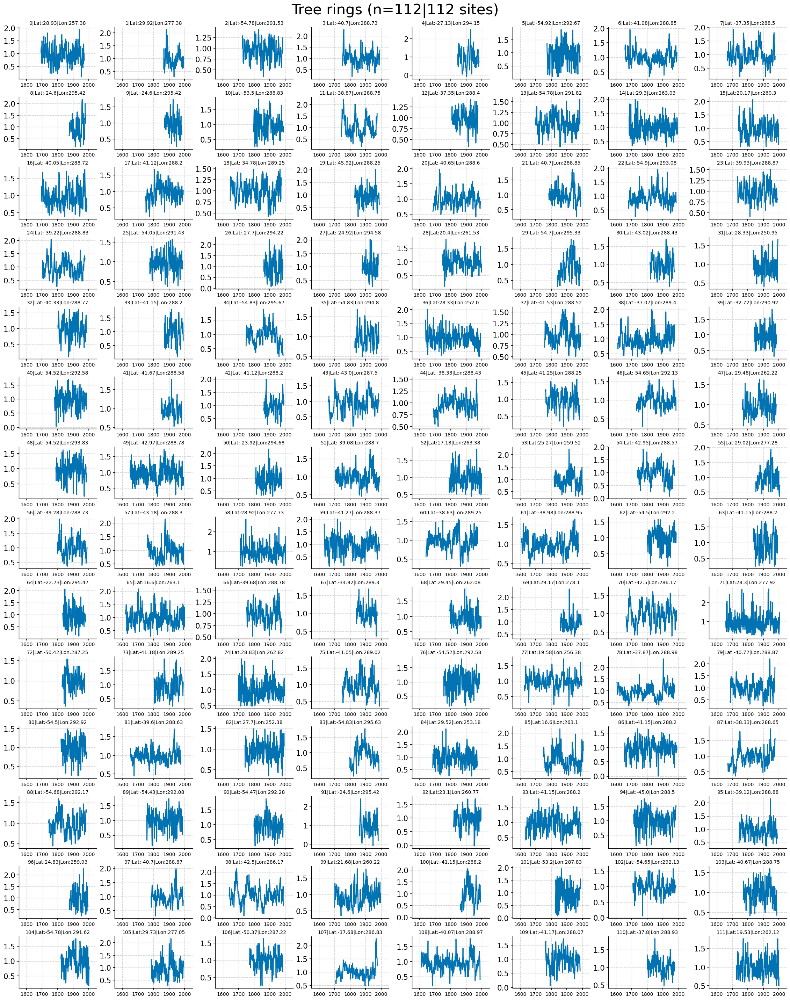

In [294]:
plot_ts(data=trees_breit[trees_breit['minYear']>1600])

# Temp 12k database (Finally not used)

References for loading:

https://www.ncei.noaa.gov/pub/data/paleo/reconstructions/climate12k/temperature/version1.0.0/LoadData.md

https://github.com/LinkedEarth/notebooks/tree/master/PAGES2k

In [415]:
path='/home/mchoblet/south_america/proxies/temp12k/Temp12k_v1_0_0.pkl'
#T12k = pickle.load(open(path,"rb"))
T12k =pd.read_pickle(path)['TS']

In [493]:
col_str=['archiveType','geo_siteName','geo_meanLat','geo_meanLon','geo_meanElev','pub1_doi','minYear','maxYear','paleoData_hasResolution_hasMeanValue','paleoData_hasResolution_hasMedianValue','age','ageUnits','paleoData_variableName','paleoData_units',
'paleoData_temperature12kUncertainty','paleoData_values','dataSetName']

In [525]:
ts_list=T12k
df_tmp = pd.DataFrame(index=range(len(ts_list)), columns=col_str)
# loop over the timeseries and pick those for global temperature analysis
i = 0                                                                                                                
for ts in ts_list:
    #import pdb
    #pdb.set_trace()
#    if 'paleoData_useInGlobalTemperatureAnalysis' in ts.keys() and \
#        ts['paleoData_useInGlobalTemperatureAnalysis'] == 'TRUE':
    for name in col_str:                                                                                         
        try:
            df_tmp.loc[i, name] = ts[name]                                                                       
        except:
            df_tmp.loc[i, name] = np.nan                                                                         
    i += 1
df = df_tmp.dropna(how='all').sort_values('geo_meanLat')

#only select temperature record
df=df[(df['geo_meanLat']<30) & (df['geo_meanLat']>-65) & (df['geo_meanLon']<-20) & (df['geo_meanLon']>-110)][df['paleoData_variableName']=='temperature']
df['age']=df['age'].apply(lambda x: 1950-np.array(x).astype(float))
df['year']=df['age']
df['ID']=df['dataSetName']

/tmp/ipykernel_974496/1219973987.py:19: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df=df[(df['geo_meanLat']<30) & (df['geo_meanLat']>-65) & (df['geo_meanLon']<-20) & (df['geo_meanLon']>-110)][df['paleoData_variableName']=='temperature']


In [529]:
# recalculate median resolution since 500CE (just to be sure to not loose any records
def helper(x):
    time=x[x>500]
    try:
        return np.abs(np.median(x[:-1]-x[1:]))
    except:
        return np.nan
    
df['median_resol_lm']=df['age'].apply(lambda x: helper(x))


df_lm=df[df['minYear']<1100]#[df['median_resol_lm']<100]
# df[df['minYear']<1100][df['paleoData_hasResolution_hasMedianValue'].astype('float')<100]#.drop_duplicates('geo_siteName')
df_lm['paleoData_hasResolution_hasMedianValue']=df['median_resol_lm']

/tmp/ipykernel_974496/1502153681.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_lm['paleoData_hasResolution_hasMedianValue']=df['median_resol_lm']


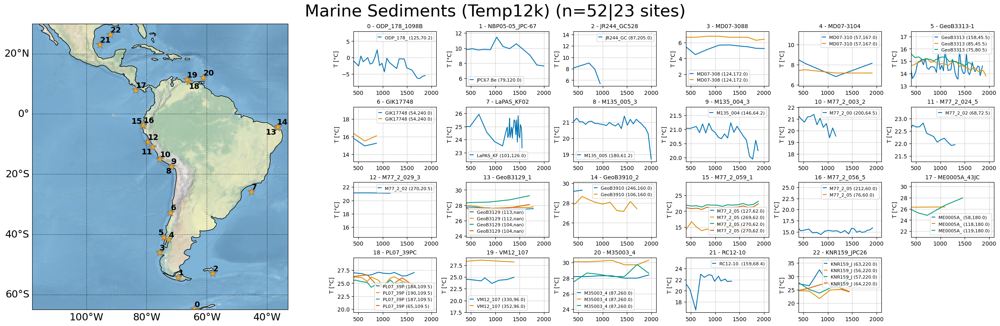

In [578]:
plot_map_ts(data=df_lm[df_lm['archiveType']=='MarineSediment'],
    title='Marine Sediments (Temp12k)',
    figsize=(25,8),
    gridspec=(4,6),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
        label_lim=8,
       )

In [532]:
df_lm[df_lm['archiveType']=='MarineSediment']

,archiveType,geo_siteName,geo_meanLat,geo_meanLon,geo_meanElev,pub1_doi,minYear,maxYear,paleoData_hasResolution_hasMeanValue,paleoData_hasResolution_hasMedianValue,age,ageUnits,paleoData_variableName,paleoData_units,paleoData_temperature12kUncertainty,paleoData_values,dataSetName,year,ID,median_resol_lm
3533,MarineSediment,ODP_178_1098B,-64.8619,-64.208,-1010.0,10.1038/nature09751,79.55,11768.52,94.265887,70.180,"[1870.45, 1815.66, 1761.21, 1707.1, 1599.88, 1...",BP,temperature,degC,2.9,"[-5.48178798170809, -5.7192897828569, -6.38809...",ODP_178_1098B.Shevenell.2011,"[1870.45, 1815.66, 1761.21, 1707.1, 1599.88, 1...",ODP_178_1098B.Shevenell.2011,70.180
1863,MarineSediment,NBP05-05_JPC-67,-54.3199,-69.4632,-297.0,10.1016/j.quascirev.2017.10.029,-45,14330,172.897436,120.000,"[1995.0, 1853.0, 1711.0, 1571.0, 1431.0, 1294....",BP,temperature,degC,1.7,"[7.644, 7.772, 9.06, 9.841, 10.579, 9.932, 10....",JPC67.Bertrand.2017,"[1995.0, 1853.0, 1711.0, 1571.0, 1431.0, 1294....",JPC67.Bertrand.2017,120.000
1876,MarineSediment,JR244_GC528,-53.013,-58.0405,-598.0,10.1073/pnas.1511252113,1000,25440,284.186047,205.000,"[950.0, 840.0, 720.0, 160.0, -150.0, -510.0, -...",BP,temperature,degC,1.7,"[5.39107619815123, 7.92574493741744, 9.0096163...",JR244_GC528.Roberts.2016,"[950.0, 840.0, 720.0, 160.0, -150.0, -510.0, -...",JR244_GC528.Roberts.2016,205.000
2788,MarineSediment,MD07-3088,-46.0667,-75.6833,-1536.0,10.1002/jqs.3082,-58,21617,176.219512,172.000,"[2008.0, 1840.0, 1668.0, 1488.0, 1294.0, 1083....",Calibrated,temperature,degC,3,"[5.23926033912635, 5.26894770496361, 5.4583335...",MD07-3088.Montade.2019,"[2008.0, 1840.0, 1668.0, 1488.0, 1294.0, 1083....",MD07-3088.Montade.2019,172.000
2792,MarineSediment,MD07-3088,-46.0667,-75.6833,-1536.0,10.1002/jqs.3082,-58,21617,176.219512,172.000,"[2008.0, 1840.0, 1668.0, 1488.0, 1294.0, 1083....",Calibrated,temperature,degC,NA,"[6.4, 6.275, 6.65, 6.65, 6.65, 6.775, 6.775, 6...",MD07-3088.Montade.2019,"[2008.0, 1840.0, 1668.0, 1488.0, 1294.0, 1083....",MD07-3088.Montade.2019,172.000
2801,MarineSediment,MD07-3104,-41.7111,-72.7781,-326.0,10.1002/jqs.3082,39,12941,230.392857,167.000,"[1911.0, 1166.0, 531.0, 82.0, -251.0, -390.0, ...",Calibrated,temperature,degC,3,"[8.14638542957365, 6.82537515553701, 8.1385019...",MD07-3104.Montade.2019,"[1911.0, 1166.0, 531.0, 82.0, -251.0, -390.0, ...",MD07-3104.Montade.2019,167.000
2805,MarineSediment,MD07-3104,-41.7111,-72.7781,-326.0,10.1002/jqs.3082,39,12941,230.392857,167.000,"[1911.0, 1166.0, 531.0, 82.0, -251.0, -390.0, ...",Calibrated,temperature,degC,NA,"[7.175, 7.175, 7.5, 7.225, 7.175, 7.5, 7.375, ...",MD07-3104.Montade.2019,"[1911.0, 1166.0, 531.0, 82.0, -251.0, -390.0, ...",MD07-3104.Montade.2019,167.000
1125,MarineSediment,GeoB3313-1,-41.0,-74.3,-852.0,10.1029/2001PA000727,283.255,6989.938,43.808917,45.500,"[1937.0, 1889.0, 1865.0, 1843.0, 1819.0, 1795....",cal years BP,temperature,degC,2.1,"[nan, nan, 14.61749381, 14.20435528, 13.832890...",GeoB33131.Lamy.2002,"[1937.0, 1889.0, 1865.0, 1843.0, 1819.0, 1795....",GeoB33131.Lamy.2002,45.500
1124,MarineSediment,GeoB3313-1,-41.0,-74.3,-852.0,10.1029/2001PA000727,283.255,6989.938,82.619048,45.500,"[1937.0, 1889.0, 1865.0, 1843.0, 1819.0, 1795....",cal years BP,temperature,degC,1.7,"[13.80961328, 14.19280334, nan, 14.31391596, n...",GeoB33131.Lamy.2002,"[1937.0, 1889.0, 1865.0, 1843.0, 1819.0, 1795....",GeoB33131.Lamy.2002,45.500
1116,MarineSediment,GeoB3313-1,-41.0,-74.3,-852.0,10.1029/2001PA000727,283.255,6989.938,90.630851,80.511,"[1666.745, 1586.234, 1505.723, 1425.213, 1344....",BP,temperature,degC,NA,"[14.67, 14.91, 14.62, 14.81, 14.89, 15.03, 14....",GeoB33131.Lamy.2002,"[1666.745, 1586.234, 1505.723, 1425.213, 1344....",GeoB33131.Lamy.2002,80.511


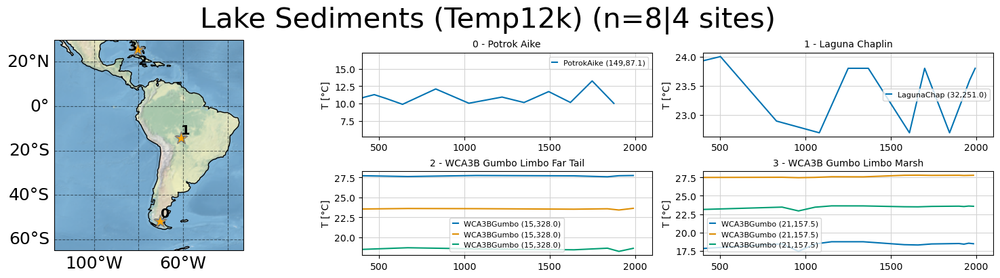

In [579]:
plot_map_ts(data=df_lm[df_lm['archiveType']=='LakeSediment'],
    title='Lake Sediments (Temp12k)',
    figsize=(15,4),
    gridspec=(2,2),
    width_ratios=(1,2),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
        label_lim=10,
       )

In [536]:
df_lm[df_lm['archiveType']=='LakeSediment']

,archiveType,geo_siteName,geo_meanLat,geo_meanLon,geo_meanElev,pub1_doi,minYear,maxYear,paleoData_hasResolution_hasMeanValue,paleoData_hasResolution_hasMedianValue,age,ageUnits,paleoData_variableName,paleoData_units,paleoData_temperature12kUncertainty,paleoData_values,dataSetName,year,ID,median_resol_lm
3752,LakeSediment,Potrok Aike,-51.96,-70.38,113.0,10.1016/j.ecolind.2012.06.017,73.356,15315.9,102.990162,87.105,"[1876.644, 1749.287, 1621.931, 1494.575, 1350....",BP,temperature,degC,NA,"[10.006, 13.265, 10.146, 11.722, 10.14, 10.928...",PotrokAike.Massaferro.2013,"[1876.644, 1749.287, 1621.931, 1494.575, 1350....",PotrokAike.Massaferro.2013,87.105
2202,LakeSediment,Laguna Chaplin,-14.4667,-61.0667,225.0,10.1130/G24784A.1,-44,15144,489.935484,251.000,"[1994.0, 1962.0, 1844.0, 1698.0, 1609.0, 1368....",Calibrated,temperature,degC,2.1,"[23.8, 23.6, 22.7, 23.8, 22.7, 23.8, 23.8, 22....",LagunaChaplin.Punyasena.2008,"[1994.0, 1962.0, 1844.0, 1698.0, 1609.0, 1368....",LagunaChaplin.Punyasena.2008,251.000
4885,LakeSediment,WCA3B Gumbo Limbo Far Tail,25.7747,-80.5056,5.0,10.1016/S0034-6667(00)00042-7,-40,4653,335.214286,328.000,"[1990.0, 1906.0, 1839.0, 1643.0, 1070.0, 669.0...",yr 14C BP,temperature,degC,2,"[27.757, 27.729, 27.6, 27.714, 27.757, 27.629,...",WCA3BGumboLimboFarTail.Willard.2001,"[1990.0, 1906.0, 1839.0, 1643.0, 1070.0, 669.0...",WCA3BGumboLimboFarTail.Willard.2001,328.000
4887,LakeSediment,WCA3B Gumbo Limbo Far Tail,25.7747,-80.5056,5.0,10.1016/S0034-6667(00)00042-7,-40,4653,335.214286,328.000,"[1990.0, 1906.0, 1839.0, 1643.0, 1070.0, 669.0...",yr 14C BP,temperature,degC,2.1,"[23.636, 23.425, 23.58, 23.527, 23.594, 23.614...",WCA3BGumboLimboFarTail.Willard.2001,"[1990.0, 1906.0, 1839.0, 1643.0, 1070.0, 669.0...",WCA3BGumboLimboFarTail.Willard.2001,328.000
4886,LakeSediment,WCA3B Gumbo Limbo Far Tail,25.7747,-80.5056,5.0,10.1016/S0034-6667(00)00042-7,-40,4653,335.214286,328.000,"[1990.0, 1906.0, 1839.0, 1643.0, 1070.0, 669.0...",yr 14C BP,temperature,degC,3,"[18.614, 18.229, 18.629, 18.429, 18.543, 18.68...",WCA3BGumboLimboFarTail.Willard.2001,"[1990.0, 1906.0, 1839.0, 1643.0, 1070.0, 669.0...",WCA3BGumboLimboFarTail.Willard.2001,328.000
4892,LakeSediment,WCA3B Gumbo Limbo Marsh,25.7789,-80.5111,5.0,10.1016/S0034-6667(00)00042-7,-34,4324,217.9,157.500,"[1984.0, 1956.0, 1928.0, 1899.0, 1739.0, 1659....",yr 14C BP,temperature,degC,3,"[18.457, 18.529, 18.4, 18.486, 18.429, 18.286,...",WCA3BGumboLimboMarsh.Willard.2001,"[1984.0, 1956.0, 1928.0, 1899.0, 1739.0, 1659....",WCA3BGumboLimboMarsh.Willard.2001,157.500
4891,LakeSediment,WCA3B Gumbo Limbo Marsh,25.7789,-80.5111,5.0,10.1016/S0034-6667(00)00042-7,-34,4324,217.9,157.500,"[1984.0, 1956.0, 1928.0, 1899.0, 1739.0, 1659....",yr 14C BP,temperature,degC,2,"[27.8, 27.786, 27.771, 27.8, 27.786, 27.814, 2...",WCA3BGumboLimboMarsh.Willard.2001,"[1984.0, 1956.0, 1928.0, 1899.0, 1739.0, 1659....",WCA3BGumboLimboMarsh.Willard.2001,157.500
4893,LakeSediment,WCA3B Gumbo Limbo Marsh,25.7789,-80.5111,5.0,10.1016/S0034-6667(00)00042-7,-34,4324,217.9,157.500,"[1984.0, 1956.0, 1928.0, 1899.0, 1739.0, 1659....",yr 14C BP,temperature,degC,2.1,"[23.568, 23.601, 23.535, 23.584, 23.552, 23.49...",WCA3BGumboLimboMarsh.Willard.2001,"[1984.0, 1956.0, 1928.0, 1899.0, 1739.0, 1659....",WCA3BGumboLimboMarsh.Willard.2001,157.500


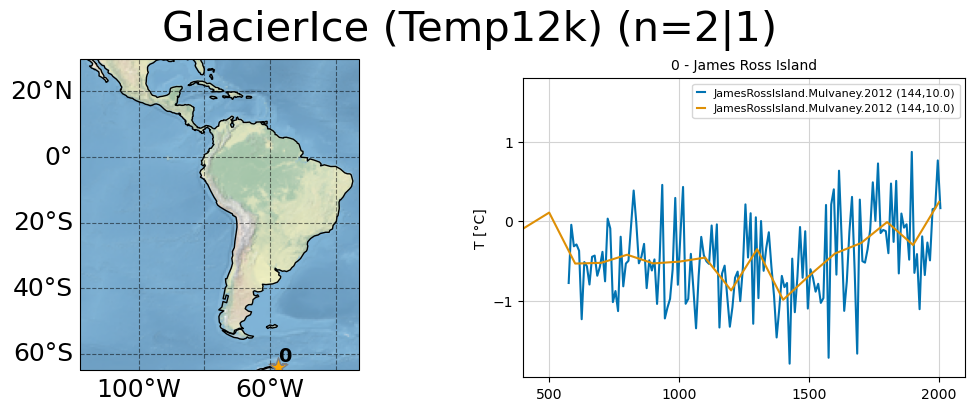

In [537]:
plot_map_ts(data=df_lm[df_lm['archiveType']=='GlacierIce'],
    title='GlacierIce (Temp12k)',
    figsize=(10,4),
    gridspec=(1,1),
    width_ratios=(1,1),
    map_extent=[242,327,-65,30,],
    time_0=[400,2100], #limits
    ticks=[500,1000,1500,2000], #limits
        #label_lim=8,
       )

In [538]:
df_lm[df_lm['archiveType']=='GlacierIce']

,archiveType,geo_siteName,geo_meanLat,geo_meanLon,geo_meanElev,pub1_doi,minYear,maxYear,paleoData_hasResolution_hasMeanValue,paleoData_hasResolution_hasMedianValue,age,ageUnits,paleoData_variableName,paleoData_units,paleoData_temperature12kUncertainty,paleoData_values,dataSetName,year,ID,median_resol_lm
1837,GlacierIce,James Ross Island,-64.2017,-57.685,1542.0,10.1038/nature11391,-58,14263.66,10.0,10.0,"[2005.0, 1995.0, 1985.0, 1975.0, 1965.0, 1955....",BP,temperature,degC,NA,"[0.164, 0.763, 0.163, 0.151, -0.492, -0.268, -...",JamesRossIsland.Mulvaney.2012,"[2005.0, 1995.0, 1985.0, 1975.0, 1965.0, 1955....",JamesRossIsland.Mulvaney.2012,10.0
1830,GlacierIce,James Ross Island,-64.2017,-57.685,1542.0,10.1038/nature11391,-58,14263.66,100.0,100.0,"[2000.0, 1900.0, 1800.0, 1700.0, 1600.0, 1500....",BP,temperature,degC,2.1,"[0.242, -0.299, -0.011, -0.274, -0.405, -0.685...",JamesRossIsland.Mulvaney.2012,"[2000.0, 1900.0, 1800.0, 1700.0, 1600.0, 1500....",JamesRossIsland.Mulvaney.2012,100.0
